# FLAIR Brain Tumor segmentation with DNN: from U-Net architecture to Vision Transformers
---

**Student Informations**
|||
|---|---|
|*Student* | `Matteo Liotta`|
|*Student ID*| `SM3800072`|
|*Course*| *Deep Learning, Spring 2025, UniTS - Final Project*|

**Index**
|||
|-|---|
|**1**|<u>[***Problem Introduction***](#problem-introduction)</u>|
|> **1.2**| [*Tumor individuation and segmentation*](#tumor-individuation-and-segmentation)|
|> **1.3**| [*DNN Approaches to the problem and Chosen dataset*](#dnn-approaches-to-the-problem-and-chosen-dataset)|
|> **1.4**| [*Formalizing the problem*](#formalizing-the-problem)|
|> **1.5**| [*The loss choice for segmentation tasks*](#the-loss-choice-for-segmentation-tasks)|
|||
|**2**|<u>***[Models](#models)***</u>|
|> **2.1**| [***CNN and U-Net***](#u-net) |
|>> **2.1.1**| [*Brief introduction*](#u-net)|
|>> **2.1.2**| [*Pythorch Model definition*](#u-net-pythorch-model-definition)|
|>> **2.1.2**| [*Parameters, Loss and Training Procedure*](#training-procedure) |
|>> **2.1.3**| [*Results*](#u-net-final-considerations)|
|> **2.2**| [***Vision transformers***](#vision-transformers---a-look) |
|>> **2.2.1**| [*Brief introduction and Segmenter*](#introduction-to-the-architecture)|
|>> **2.2.1**| [*Pythorch Model definition*](#model-definition)|
|>> **2.2.2**| *Parameters, Loss and Training Procedure* |
|>> **2.2.3**| *Results*|
|||
|**3**|[<u>***Conclusions***</u>](#conclusions-and-final-3d-volumetric-application)|
|> 3.1| [*3D volumetric application*](#volumetric-application)|

> ### **References**
>
> `[1]` EU cancer statistics: https://ec.europa.eu/eurostat/statistics-explained/index.php?title=Cancer_statistics
>
> `[2]` Brain tumor segmentation with Deep Neural Networks,Medical Image Analysis, Mohammad Havaei, Axel Davy, and others. https://doi.org/10.1016/j.media.2016.05.004.
>
> `[3]`  Multi-class glioma segmentation on real-world data with missing MRI sequences: comparison of three deep learning algorithms: https://www.nature.com/articles/s41598-023-44794-0
>
> `[4]`Dataset: https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation
>
> `[5]` Azad, R., Heidary, M., Yilmaz, K., Hüttemann, M., Karimijafarbigloo, S., Wu, Y., Schmeink, A., & Merhof, D. (2023). Loss Functions in the Era of Semantic Segmentation: A Survey and Outlook. arXiv:2312.05391. https://arxiv.org/abs/2312.05391
>
> `[6]` Ronneberger, O., Fischer, P., & Brox, T. (2015). U-Net: Convolutional Networks for Biomedical Image Segmentation. arXiv preprint arXiv:1505.04597. https://arxiv.org/abs/1505.04597
> 
> `[7]` The U-net: A Complete Guide. https://medium.com/@alejandro.itoaramendia/decoding-the-u-net-a-complete-guide-810b1c6d56d8
>
> `[8]` Loss Function library: https://www.kaggle.com/code/bigironsphere/loss-function-library-keras-pytorch#Combo-Loss
> 
> `[9]` Image Segmentation Using Vision Transformers (ViT): A Deep Dive with Cityscapes and CamVid Datasets https://medium.com/@ankitrajsh/image-segmentation-using-vision-transformers-vit-a-deep-dive-with-cityscapes-and-camvid-datasets-fc1ccdca295b
>
> `[10]` Segmenter: Transformer for Semantic Segmentation, Robin Strudel and Ricardo Garcia and Ivan Laptev and Cordelia Schmid,
https://arxiv.org/abs/2105.05633

---

## **Problem Introduction**

#### Tumor individuation and segmentation

Cancer, as we can access from the European Cancer Statistics was in 2021 the **second leading cause** of death in EU, with a percentage of 21.6 total number of deaths `[1]`. If we do consider in specific the case of brain tumor, in 2015 United States estimated the emergence of 23'000 new cases in its territory.

Nowadays the most common treatments for the brain tumor is the actual **surgery**, but not always this solution is easy to actually be executed `[2]` - then radiations and chemiotherapy could be used in order to slow down the tumoral region spread in the body. In addition to the complicate situation itself, even if some tumor as *meningiomas* can be easily segmented, there are other different types -i.e. Gliomas and Glioblastomas*- which could be **hardly localized**: those are poorly contrasted, usually diffused and with tentacle like structures, making difficult for medical doctors to fully segment. 

The other difficulty that emerges with tumoral individuation and segmentation is that brain tumor can **appear in any place of the head, without specific size or shape**, while **different MR machines** -e.g. in different hospital structures- **produces images with different greyscale values** - tumoral cells identified are **not usually standardized**. 

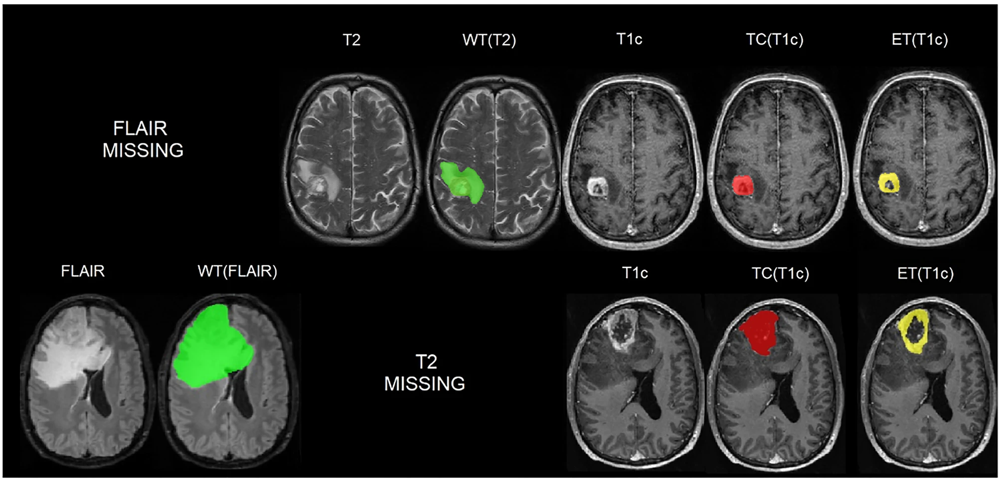

> **Fig 1.** Sample images. Ground truth manual segmentation for a GBM patient with missing FLAIR scan (top row) and one with missing T2w (bottom row). Whole Tumor (WT) in green. The WT defines the full extent of the tumor, including the tumor core and oedema, indicated by hyperintensity on FLAIR and T2w. Tumor Core (TC) in red. The TC is the main body of the tumor and most likely area of resection. The TC includes the enhancing tumor (ET) and necrosis. The ET is shown in yellow.

#### DNN Approaches to the problem and Chosen dataset

Due to the intrinsic complications of the problem, the idea is to introduce and exploration in deep learning models for an efficient solution for the tumoral region identification and segmentation. Since the problem itself works with **images** what we can do is to introduce machine learning models with image input -e.g. CNN- and that do return not just the classification of the image itself, but the actual **segmentation** in the given images, wherever the methods finds a recurrent pattern of the tumor seen in training processes.

Depending on the dataset considered, there could be different types of inputs, which are dependent on the hospital metodologies of image taking, while the most common ones are the following ones [2]:
* T1
* T1-constrasted
* T2
* T2-contrasted 
* Proton density contrast imaging (PD)
* Diffusion MRI (dMRI)
* Fluid attenuation inversion recovery (FLAIR) pulse sequences

Where each do produce, as visible also in the previous image, different kind of results - each one that recover a different signature of the tumoral area. 

In any case, the idea is to introduce a method that given an image returns the segmentation... even if in reality the result would be a **binary mask** of 0 and 1 pixel questioning.

The chosen dataset is the [kaggle mri segmentation](https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation) `[4]` one. As indicated there: *"This dataset includes This dataset contains brain **MR images together with manual FLAIR abnormality segmentation masks**. The images were obtained from The Cancer Imaging Archive (TCIA). They correspond to 110 patients included in The Cancer Genome Atlas (TCGA) lower-grade glioma collection with at least fluid-attenuated inversion recovery (FLAIR) sequence and genomic cluster data available."*

The choice behind this kind of dataset, which could be simplified if compared with high size complete T1/T1c/T2/T2c/FLAIR dataset, is related to the computational complexity behind high dimensional image handling, where:
* Each different MRI methodology whould represent a **different channel**
* The **image size** increase with the quality and image definition
* The **dataset size** increase with the quality of its instances and instances number
* The **image feeding time** is proportional to its size and dimensionality

This dataset is just some gigabites heavy, while professional ones are about ~ 100 gB. 



Let's consider the given dataset; an example of its instances are the following ones:

In [8]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset
import torchvision.transforms as T
from torch.utils.data import DataLoader
from torch.utils.data import random_split
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
import torch
import torch.nn as nn
import torch.nn.functional as F

# Parameters 

W = 96
H = 96
B = 32

device = torch.device("mps") # on mac

In [9]:
## TRANSFORMATIONS
# Since images are centered but with a huge black area around the brain, the idea 
# is to center crop the image. Since for speed that's not enough, we also resize the image to a fixed size.
# The size is set at the beginning.

transform = T.Compose([
    T.CenterCrop(200),        
    T.Resize((W, H)),
    T.ToTensor()
])

## DATASET
# The dataset is defined with the following structure:
#
# dataset/
# -- TCGA_DU_6407/
# -- -- TCGA_DU_6407_1.tif
# -- -- TCGA_DU_6407_1_mask.tif
# -- -- ...
# -- TCGA_CS_4941/
# -- -- ...
# -- data.csv

class LGGSegmentationDataset(Dataset):
    def __init__(self, root_dir, transform=None, mask_transform=None):
        self.image_mask_pairs = [] # list for the couples (image, mask)
        self.transform = transform # transformation for the images
        self.mask_transform = mask_transform # transformation for the mask image

        # Considering the directory structure, for each folder in the given one
        for folder in os.listdir(root_dir):
            # obtain the actual full path of the folder
            folder_path = os.path.join(root_dir, folder)
            
            if not os.path.isdir(folder_path):
                continue

            # Then consider the files (images and masks) in the current folders
            for file in os.listdir(folder_path):
                
                # if the file is a not a mask we can actually reduce to the mask related
                # to it, just by adding the '_mask' suffix to the file name
                if file.endswith('.tif') and not file.endswith('_mask.tif'):
                    # We obtain the paths of images and masks
                    img_path = os.path.join(folder_path, file)
                    mask_path = os.path.join(folder_path, file.replace('.tif', '_mask.tif'))
                    
                    # Now the idea is to transform the images 
                    image = Image.open(img_path).convert("RGB")
                    mask = Image.open(mask_path).convert("L")  # binary mask

                    image = self.transform(image)          # [3, H, W], float32
                    mask = self.mask_transform(mask)       # [1, H, W], float32 in [0,1]
                    
                    # if the trasformation is modifying the mask, there could be not values in at 0 or 1
                    # due to the resizing. We ned to convert the mask to binary again.
                    # The treshold is not the main problem, the middle one 0.5 is fine.
                    mask = (mask > 0.5).long().squeeze(0)  # convert to int64 [H, W]

                    # each mask and image will be inserted in the previously defined list
                    if os.path.exists(mask_path):
                        self.image_mask_pairs.append((image, mask))

    def __len__(self):
        return len(self.image_mask_pairs)

    def __getitem__(self, idx):
        # This method makes the call "dataset[idx]" available.
        image, mask = self.image_mask_pairs[idx]
        return image, mask

In [ ]:
dataset = LGGSegmentationDataset("../../dataset/kaggle_3m",   ## It refers to outside the repository, it's too heavy :(
                                 transform=transform, 
                                 mask_transform=transform)

In [11]:
train_percentage = 0.8  # 80% for training, 20% for testing
total_len = len(dataset)
train_len = int(train_percentage * total_len)
test_len = total_len - train_len

train_set, test_set = random_split(
                                    dataset, 
                                    [train_len, test_len], 
                                    generator=torch.Generator().manual_seed(42) # for the reproducibility
                                    )

# then we obtain the data
train_loader = DataLoader(train_set, batch_size=B, shuffle=True)
test_loader = DataLoader(test_set, batch_size=B, shuffle=False)

Once obtained the dataloader we're ready to show images:

torch.Size([3, 96, 96]) torch.Size([96, 96])


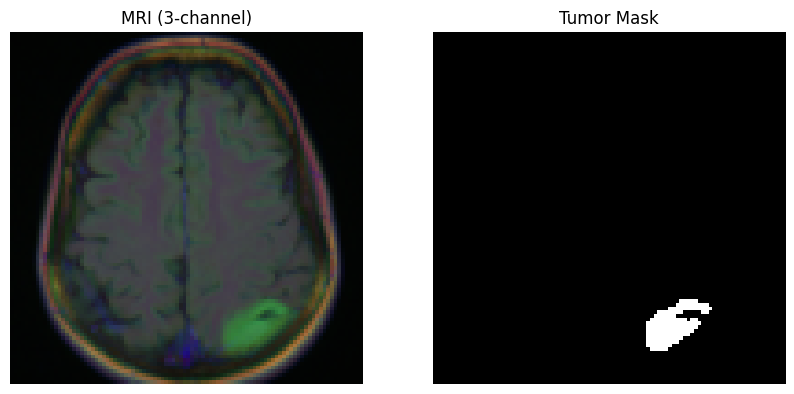

In [12]:
def show_sample(dataset, idx):
    image, mask = dataset[idx]  # image: [3,H,W], mask: [H,W]

    # Converti image in HWC per matplotlib
    image_np = image.permute(1, 2, 0).numpy()
    mask_np = mask.squeeze(0).numpy()

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image_np)
    plt.title("MRI (3-channel)")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(mask_np, cmap='gray')
    plt.title("Tumor Mask")
    plt.axis('off')

    print(image.shape, mask.shape)
    plt.show()

show_sample(dataset, 2)

It's interesting to notice that inside the whole dataset we have...

In [13]:
zero_count = 0
nonzero_count = 0

for i in range(len(dataset)):
    _, mask = dataset[i]
    if mask.sum() == 0:
        zero_count += 1
    else:
        nonzero_count += 1

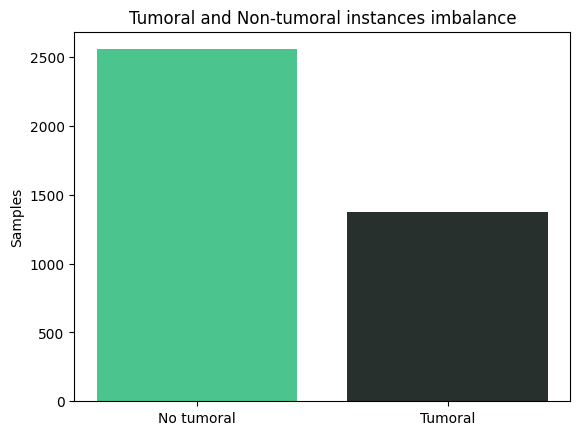

In [14]:
categories = ['No tumoral', 'Tumoral']
counts = [zero_count, nonzero_count]
plt.bar(categories, counts, color=['#4bc48e', '#27302c'])
plt.ylabel('Samples')
plt.title('Tumoral and Non-tumoral instances imbalance')
plt.show()

Slightly imbalances, but it's common, since in this dataset are included images that are representing different types of 2D slices and the volumetric size of the tumoral region could be small with respect to brain size.

torch.Size([3, 96, 96]) torch.Size([96, 96])


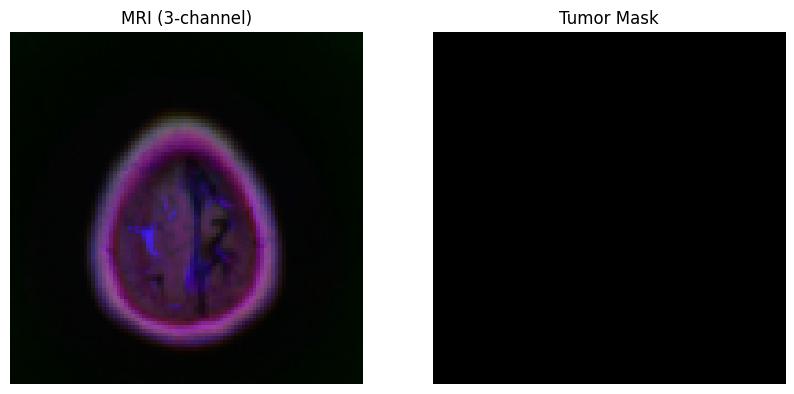

In [15]:
show_sample(dataset, 58)

So, we could just eventually include images in MRI which are with a fixed size at least.

In [16]:
class LGGSegmentationDataset_reduced(Dataset):
    def __init__(self, root_dir, transform=None, mask_transform=None, min_image_coverage = 0):
        self.image_mask_pairs = [] # list for the couples (image, mask)
        self.transform = transform # transformation for the images
        self.mask_transform = mask_transform # transformation for the mask image

        # Considering the directory structure, for each folder in the given one
        for folder in os.listdir(root_dir):
            # obtain the actual full path of the folder
            folder_path = os.path.join(root_dir, folder)
            
            if not os.path.isdir(folder_path):
                continue

            # Then consider the files (images and masks) in the current folders
            for file in os.listdir(folder_path):
                
                # if the file is a not a mask we can actually reduce to the mask related
                # to it, just by adding the '_mask' suffix to the file name
                if file.endswith('.tif') and not file.endswith('_mask.tif'):
                    # We obtain the paths of images and masks
                    img_path = os.path.join(folder_path, file)
                    mask_path = os.path.join(folder_path, file.replace('.tif', '_mask.tif'))
                    
                    # Now the idea is to transform the images 
                    image = Image.open(img_path).convert("RGB")
                    mask = Image.open(mask_path).convert("L")  # binary mask

                    image = self.transform(image)          # [3, H, W], float32

                    nonzero_ratio = (image > 0).float().mean().item()
                    if nonzero_ratio < min_image_coverage:
                        continue  # so, skip images with low coverage

                    mask = self.mask_transform(mask)       # [1, H, W], float32 in [0,1]
                    
                    # if the trasformation is modifying the mask, there could be not values in at 0 or 1
                    # due to the resizing. We ned to convert the mask to binary again.
                    # The treshold is not the main problem, the middle one 0.5 is fine.
                    mask = (mask > 0.5).long().squeeze(0)  # convert to int64 [H, W]
                    
                    # each mask and image will be inserted in the previously defined list
                    if os.path.exists(mask_path):
                        self.image_mask_pairs.append((image, mask))

    def __len__(self):
        return len(self.image_mask_pairs)

    def __getitem__(self, idx):
        # This method makes the call "dataset[idx]" available.
        image, mask = self.image_mask_pairs[idx]
        return image, mask

In [19]:
reduced_dataset = LGGSegmentationDataset_reduced("../../dataset/kaggle_3m", 
                                                 transform=transform, 
                                                 mask_transform=transform, 
                                                 min_image_coverage=0.6)

In [20]:
train_percentage = 0.8  # 80% for training, 20% for testing
total_len = len(reduced_dataset)
train_len = int(train_percentage * total_len)
test_len = total_len - train_len

train_set, test_set = random_split(
                                    reduced_dataset, 
                                    [train_len, test_len], 
                                    generator=torch.Generator().manual_seed(42) # for the reproducibility
                                    )

# then we obtain the data
train_loader = DataLoader(train_set, batch_size=B, shuffle=True)
test_loader = DataLoader(test_set, batch_size=B, shuffle=False)

torch.Size([3, 96, 96]) torch.Size([96, 96])


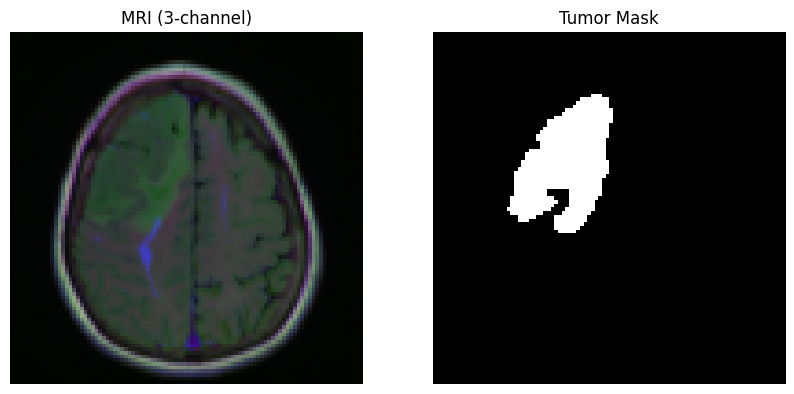

In [21]:
show_sample(reduced_dataset, 58)

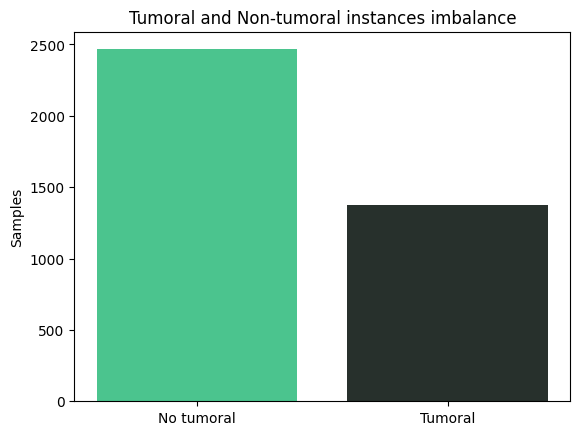

In [22]:
zero_count = 0
nonzero_count = 0

for i in range(len(reduced_dataset)):
    _, mask = reduced_dataset[i]
    if mask.sum() == 0:
        zero_count += 1
    else:
        nonzero_count += 1

categories = ['No tumoral', 'Tumoral']
counts = [zero_count, nonzero_count]
plt.bar(categories, counts, color=['#4bc48e', '#27302c'])
plt.ylabel('Samples')
plt.title('Tumoral and Non-tumoral instances imbalance')
plt.show()

This reduces a bit the problem, but removes completely useless samples problem in the future learning problems.

#### Formalizing the problem

So, the idea is that giving the image and feeding it through the newtwork the result will end up being a **same image size matrix** in which **each pixel** $x_{i,j}$ is going to be assigned with a learnable probability $p(x_{i,j})$, i.e the **probability of being a pixel that's part of the tumoral region of the brain**. This quantity is what we're interested in learning, since the return value, even if it can be mapped with non linear transformation as **0 or 1** (mask), but is interesting to understand the grade of ceirtainty we have around the prediction.

In particular, the input size of each network we'd be able to construct is $N\times N$ RGB image (3 channels) predicting the binary mask: it's possibile thanks to the 2D lables mask available for each of the instances available.

$$3 \times \text{N}\times\text{N}\longrightarrow architecture NN \longrightarrow 1 \times \text{N} \times \text{N binary mask}$$

So, the network will end up by comparing the **results of the prediction** with the real/certified mask of the considered image. 

#### The Loss choice for Segmentation tasks

Considering the segmentation task in its own complexity, from CNN to transformers many architectures have been implemented in order to solve this task efficiently and accurately. However, optimality depends not only on the right structure for the model, but also on an accurate choice for the **objective function**, the loss. Different loss functions have been proposed with different kind of interestes -which are problem dependent. The following taxionomy of designs `[5]` shows the **majour strengths of current approaches**. 

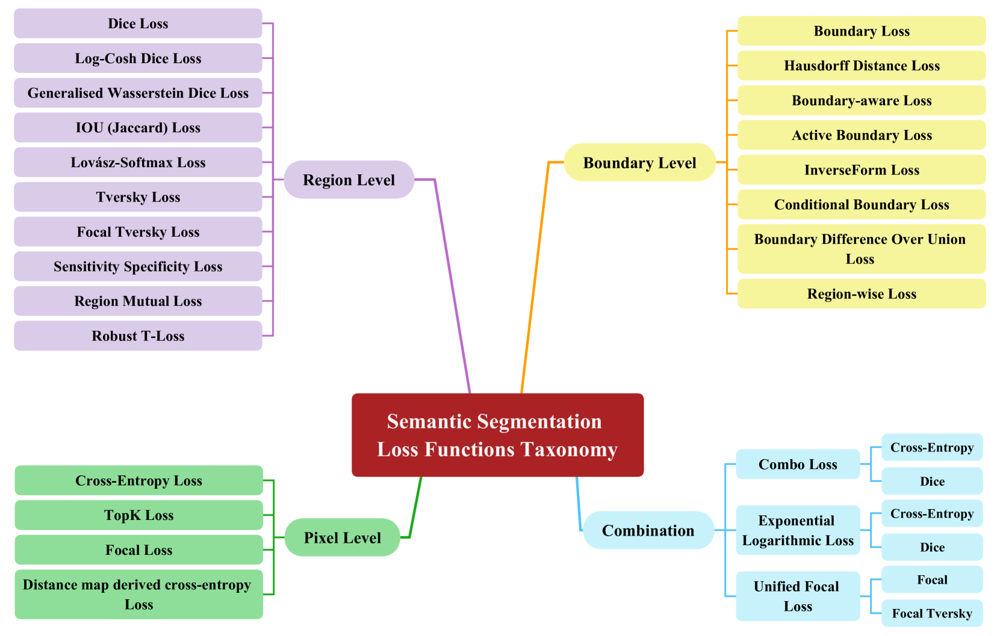
> **Fig 2.**:*The taxonomy subsections delineate four distinct groups: (1) Region-Level, (2) Boundary-Level, (3) Pixel-Level, and (4) Combination.*

In particular, we can see in details how [5]:

1. <u>**Pixel Level losses**</u>: 
    Those loss functions work by considering **individual pixels** to achieve high accuracy in the classification of each of them within the segmented region. The dissimilarity is computed between prediction and real at the **pixel level**, so comparing 
    $$d(\hat x_{i,j}, x_{i,j})\quad \forall i,j = 1,...,N$$

2. <u>**Region Level losses**</u>:
    Those loss functions work by introducing a **broader view** in **semantic segmentation task**. The idea is **not to focus on the individual pixels** but on the overall accuracy of the object segmentation itself. The prediction segmentation mask should match othe ground truth one, by capturing the essence of the object's shape and layout - without a pixel high attention. These are preferable in the case of a **global context completeness** being more important than a pixel level accuracy.

3. <u>**Boundary Level losses**</u>:
    Those loss functions are specialized in the precision of object boundaries within the segmentation task, with their primary objective being
    - sharpen object boundaries
    - separate overlapping objects

4. <u>**Combination losses**</u>: the idea is to **harmonize elements from the previous ones and optimize the segmentation performance. This is possible by **introducing multiple loss functions seeking for their equilibrium, leveraging those**. Different losses of this cathegories are considering different combinations of losses of the previous 3 kinds.


It's obvious as all these could be a great choice for the problem solution, independently on the architecture choice. However, since considering the medical importance of a good segmentations, the attention should be shifted towards the **boundaries**, more than we could expect on the pixel level. We can't exlude the importance of both, maybe trying to introduce the advantages of the **combo loss** (dice + cross-entropy).

---

## **Models**

### U-NET

The deep convolutional networks have outperformed in many cases the sota in the **visual recognition tasks**, even if the success was limited to the availability of training sets size. Their usage was originarly devoted to the classification task, where images are limited to the prediction of a **single class output**, but as we saw previously, in many medical oriented problems the interest shifts from the single output prediction to a 2D output. `[6]`

The usual CNN architecture, in fact, uses some **convolutional layers** which are responsible for both the change of the image **size** and **channel number**, but also for the chance of introducing local analysis and mathematical relations introduction. The idea is to perform the usual convolutional feed of the input, but then -since the interest is into the same dimension recovery- the need is to introduce **deconvolution** layers, obtaining the desired output. 

The name itself comes from the U-shaped architecture:

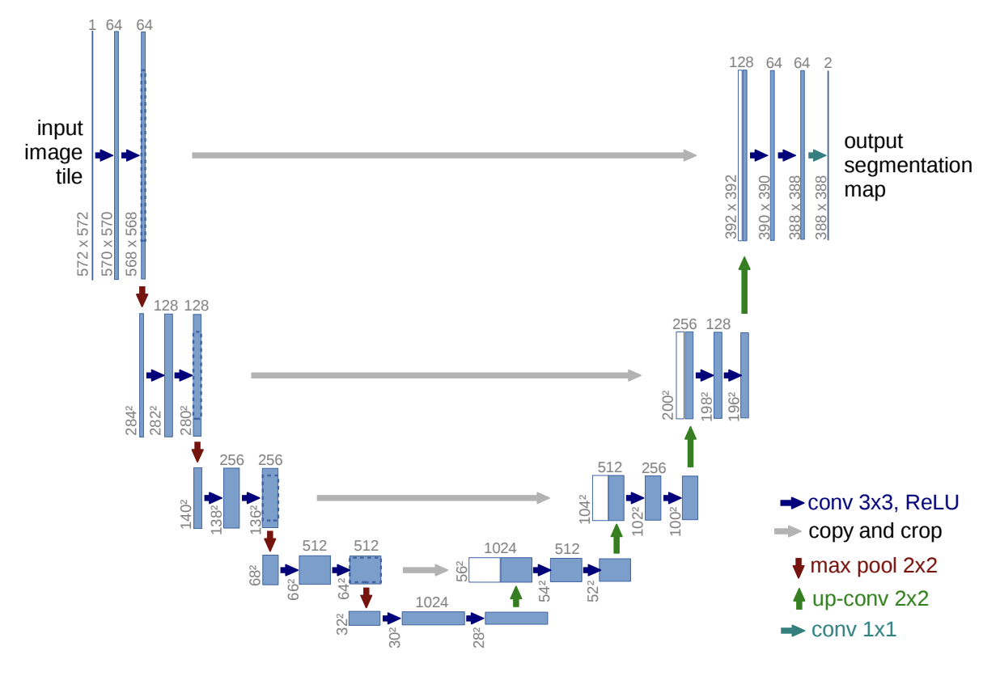

> **Fig. 3** *U-net architecture (example for 32x32 pixels in the lowest resolution). Each blue
box corresponds to a multi-channel feature map. The number of channels is denoted
on top of the box. The x-y-size is provided at the lower left edge of the box. White
boxes represent copied feature maps. The arrows denote the different operations.* `[6]`


Notice that as shown in the example, the output is

* Convoluted and transformed with max pooling
* Deconvoluted obtaining the desired output

However, the difference with a simple autoencoder networks is the component of **copy and crop**. In fact, each of these output for the convolution layer is actually moved as part of the input of the deconvolution sequence: the previous is appened wrt the current layer channels -and as visible in many cases the new block is actually double-size in channels. That's the so called **skip connection**, where at the feature map of the **convolution** step (down) is **concatenated** the output of the **deconvolution** (up). The (down conv.) feature map is eventually cropped to match the expanding-one dimensions. `[7]`

#### U-net Pythorch Model Definition

The model must have
* [B,3,W,H] input images
* [B,1,W,H] output masks

Where

* B is the selected batch size
* W is the image width defined dimension
* H is the image heigth defined dimension


In [23]:
## Unet Model definition
# The models is implementing a U-net architecture, where we need to define different 
# encoding via convolution and decoding. We use also max pooling as suggested in the reference paper.


class UNet(nn.Module):

    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        
        # We need to divide the model in different sequential parts, since we do remember
        # that the U-net implements the copy-and-crop skip connections. 

        ## ENCODING (down)
        self.enc1 = nn.Sequential(
            nn.Conv2d(in_channels, 64, 3, padding=1), nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1), nn.ReLU())
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding=1), nn.ReLU())
        self.pool2 = nn.MaxPool2d(2)

        ## We reach the end of the U
        self.uend = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1), nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding=1), nn.ReLU())

        ## DECODING (up)
        # It's the opposite of the previous part: remember that the mask
        # is needed of the same size of the input image!

        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding=1), nn.ReLU(),
            nn.Conv2d(128, 128, 3, padding=1), nn.ReLU())

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        
        self.dec1 = nn.Sequential(
            nn.Conv2d(128, 64, 3, padding=1), nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding=1), nn.ReLU())


        self.out_conv = nn.Conv2d(64, out_channels, 1)

    def forward(self, x):
        # The step is to do encoding and pooling up to the end of the U
        e1 = self.enc1(x)
        p1 = self.pool1(e1)

        e2 = self.enc2(p1)
        p2 = self.pool2(e2)

        
        b = self.uend(p2)

        # Then we need to do the up part, but with the skip connections.
        # So, previous inputs are attached to the current ones ()
        u2 = self.up2(b)
        c2 = torch.cat([e2, u2], dim=1)
        d2 = self.dec2(c2)

        u1 = self.up1(d2)
        c1 = torch.cat([e1, u1], dim=1)
        d1 = self.dec1(c1)

        # Finally, we apply the output convolution to obtain the final mask
        out = self.out_conv(d1)
        # But these values are not in [0,1], so we need to apply the sigmoid function
        return torch.sigmoid(out)

This is a basic definition coherent with the formal formulation of U-net architectures. An example could be given:

In [24]:
# example
model = UNet(in_channels=3, out_channels=1)
x = torch.randn(4, 3, W, H) # B = 4
out = model(x)

#And we see that the output shape is the same as the input image, but with a single (color) channel
x.shape , out.shape

(torch.Size([4, 3, 96, 96]), torch.Size([4, 1, 96, 96]))

#### Training Procedure

Now, it's important to define the loss function. Since the idea, as said before, will be to use the "combo loss" we need both the dice loss `[8]` and the cross-entropy loss. However, we can start just with the dice function.

In [25]:
#PyTorch
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = F.sigmoid(inputs)       
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice

diceloss = DiceLoss()

In [26]:
#PyTorch
ALPHA = 0.5 # < 0.5 penalises FP more, > 0.5 penalises FN more
CE_RATIO = 0.5 # weighted contribution of modified CE loss compared to Dice loss

class ComboLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(ComboLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1, alpha=ALPHA, eps=1e-9):
        
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #True Positives, False Positives & False Negatives
        intersection = (inputs * targets).sum()    
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        
        inputs = torch.clamp(inputs, eps, 1.0 - eps)       
        out = - (alpha * ((targets * torch.log(inputs)) + ((1 - alpha) * (1.0 - targets) * torch.log(1.0 - inputs))))
        weighted_ce = out.mean(-1)
        combo = (CE_RATIO * weighted_ce) - ((1 - CE_RATIO) * dice)
        
        return combo

Finally we can introduce a method to visualize results:

In [27]:
def display_results(model, dataset, dataset_num = 34, ax_num = 3, plot_show = True):
    # Take the dataset image (num)
    model.eval() # stop the training
    img, true_mask = dataset[dataset_num]
    img = img.unsqueeze(0).to(device)

    # predict the mask
    with torch.no_grad():
        pred_mask = model(img)  # [1,1,H,W]
        pred_mask = (pred_mask.squeeze() > 0.5).cpu().float()
        true_mask = true_mask.squeeze()

    # Compare the mask
    fig, axs = plt.subplots(1, ax_num, figsize=(12, 4)) 
    axs[0].imshow(img.squeeze().permute(1, 2, 0).cpu())
    axs[0].set_title("Input Image")
    axs[1].imshow(true_mask, cmap='gray')
    axs[1].set_title("Ground Truth Mask")
    axs[2].imshow(pred_mask, cmap='gray')
    axs[2].set_title("Predicted Mask")

    for ax in axs:
        ax.axis("off")

    plt.tight_layout()
    if plot_show:
        plt.show()

    return axs

Now the training

In [28]:
import torch.optim as optim

model = UNet(in_channels=3, out_channels=1)
optimizer = optim.Adam(model.parameters(), lr=1e-4)

model.to(device)
loss_vec = []

In [29]:
totalbatches = round(train_len / B)

In [30]:
def training(model, train_loader, optimizer, loss_fn, num_epochs=1, plots = False, comments = True):
    model.train()
    for epoch in range(num_epochs):
        total_loss = 0
        count = 0
        for images, masks in train_loader:
            count += 1
            images = images.to(device)
            masks = masks.unsqueeze(1).float().to(device)  # [B,1,H,W]

            optimizer.zero_grad()
            outputs = model(images)
            loss = loss_fn(outputs, masks) 
            
            loss.backward()
            optimizer.step()

            total_loss += loss.item() * images.size(0)

            if comments:
                print( "Epoch:", epoch, 
                    "\t Current batch:", count, "|", totalbatches, 
                    #"\t Total:", (len(dataset) * train_percentage )/B , 
                    "\t with loss:", loss.item())  # Print loss for each batch
            
            loss_vec.append(loss.item())

        #avg_loss = total_loss / len(dataset / B)
        #display_results(model, dataset)  # Visualizza i risultati dopo ogni epoca
        #print(f"Epoch {epoch+1}/{num_epochs}, Loss: {avg_loss:.4f}")
    
    model.eval()

    if plots:
        ax = display_results(model, dataset, ax_num=3, plot_show=False)
        #ax[3].plot(loss_vec)
        #ax[3].set_title("Loss curve")
        plt.show()

    return model, loss_vec[-1]

We can proceed by plotting one epoch at a time evolution:

Epoch 1/9


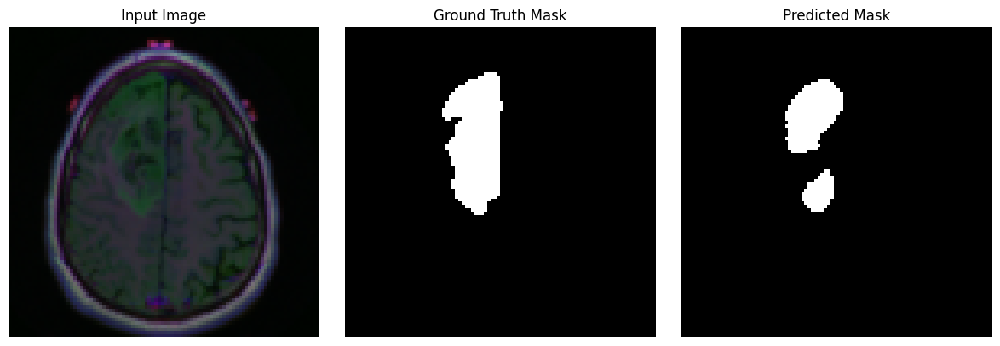

Epoch 2/9


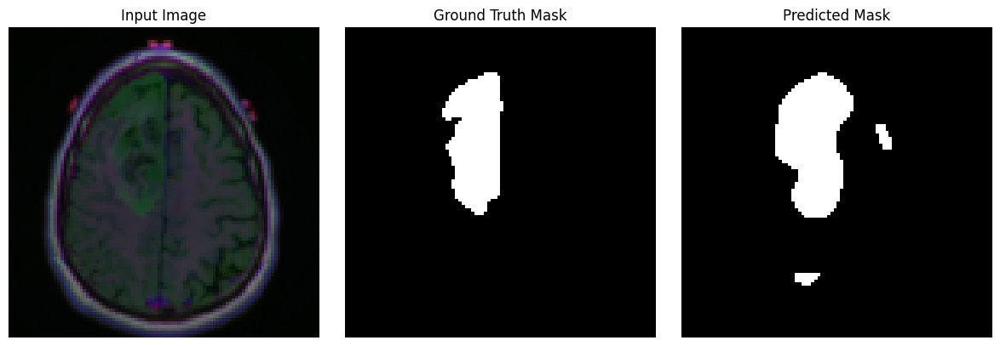

Epoch 3/9


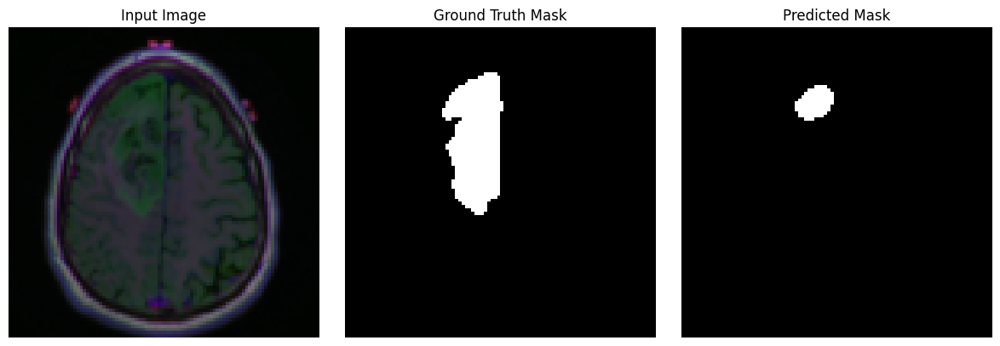

Epoch 4/9


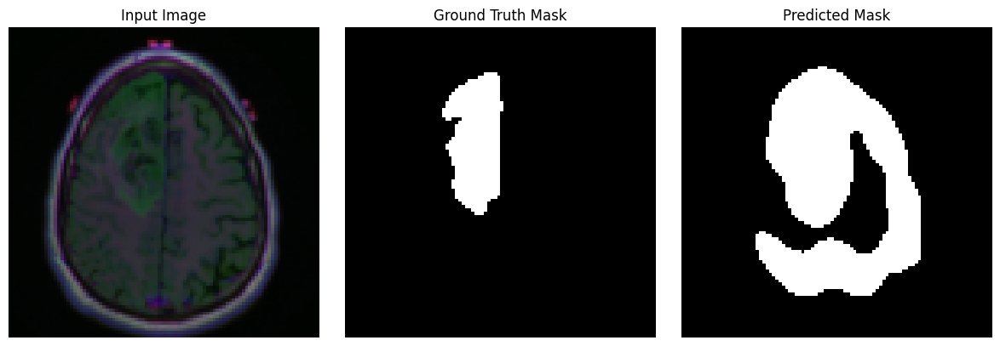

Epoch 5/9


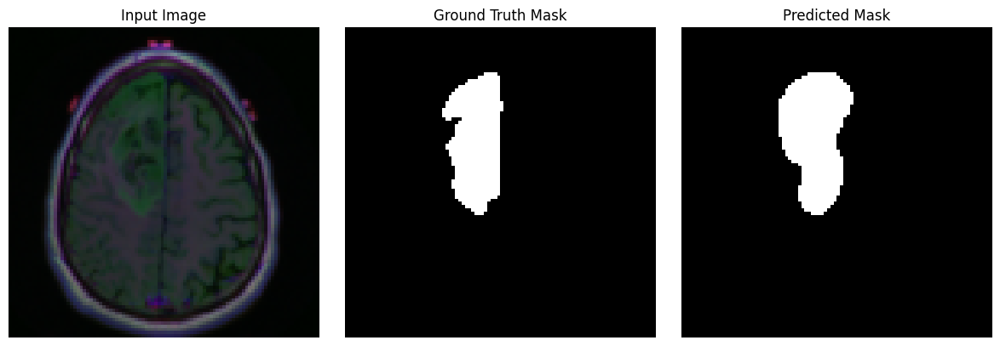

Epoch 6/9


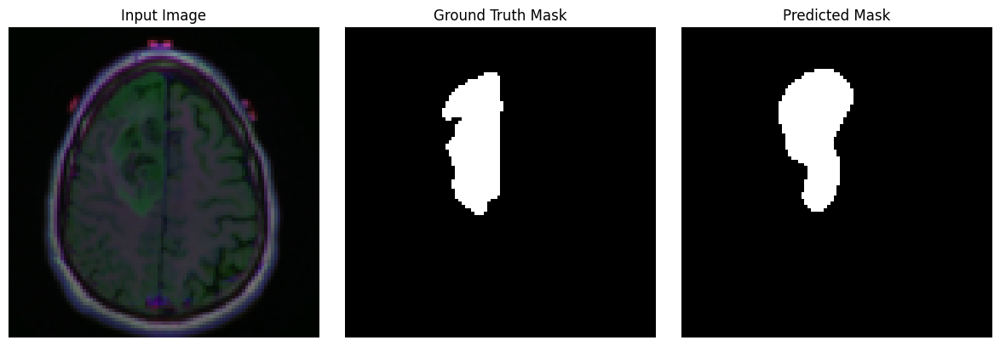

Epoch 7/9


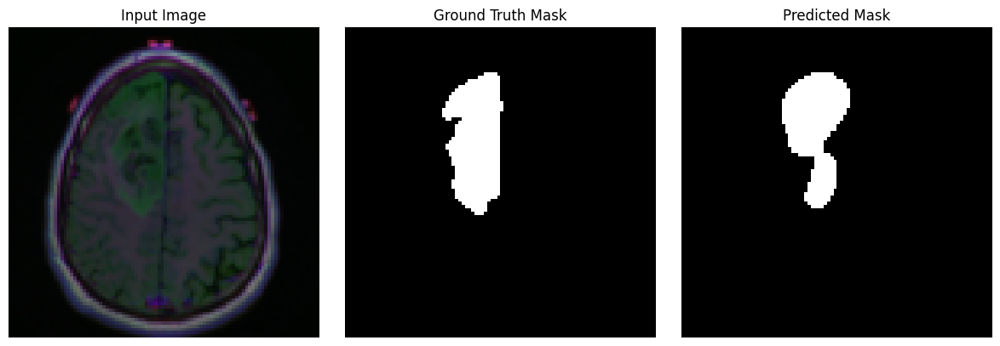

Epoch 8/9


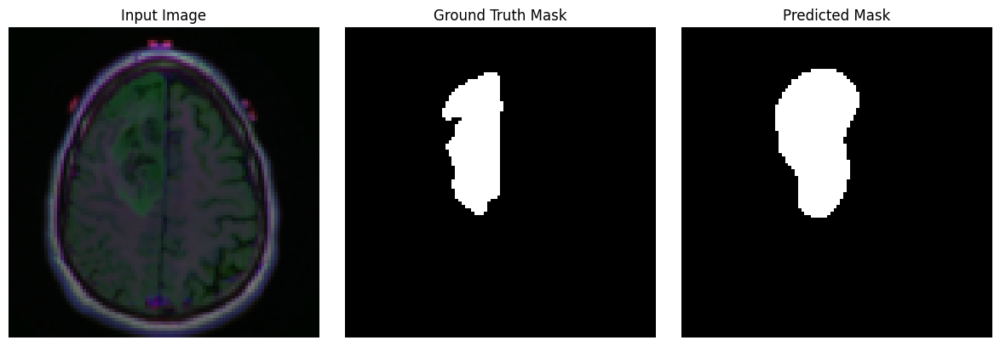

Epoch 9/9


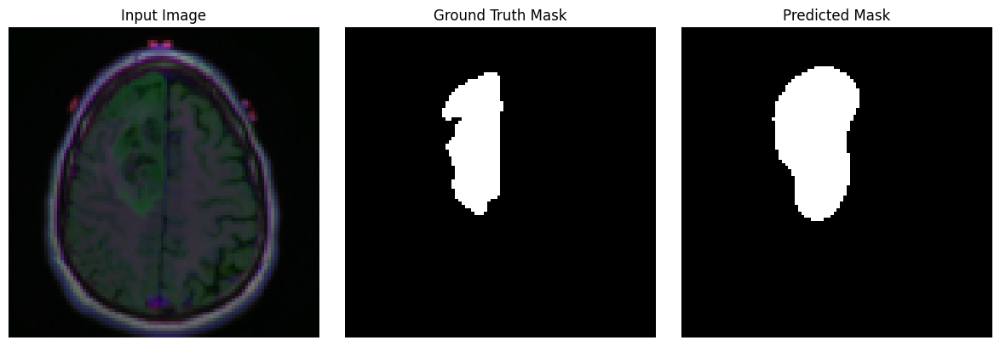

In [ ]:
num_epochs = 9 # used more times

for i in range(num_epochs):
    print(f"Epoch {i+1}/{num_epochs}")
    model, final_loss = training(model, 
                                 train_loader, 
                                 optimizer, 
                                 diceloss, 
                                 num_epochs=1, 
                                 plots=True, comments=False)

We can see the different types of accuracy:

1. Pixel accuracy

$$ \frac{\text{matching pixel}}{\text{total pixel}}$$

2. Mean accuracy

$$\text{MeanAccuracy} = \frac{1}{2} \left( \frac{TP}{TP + FN} + \frac{TN}{TN + FP} \right)$$

3. IoU (intersection over union)

$$\text{IoU} = \frac{TP}{TP + FP + FN}$$

In [ ]:
def evaluate_segmentation(model, test_loader, plot = False):
    model.eval()
    tp = tn = fp = fn = 0

    with torch.no_grad():
        for images, masks in test_loader:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            preds = (outputs > 0.5).int()  # convert in a binary mask

            preds = preds.view(-1)
            masks = masks.view(-1) 

            tp += torch.sum((preds == 1) & (masks == 1)).item()
            tn += torch.sum((preds == 0) & (masks == 0)).item()
            fp += torch.sum((preds == 1) & (masks == 0)).item()
            fn += torch.sum((preds == 0) & (masks == 1)).item()

    pixel_acc = (tp + tn) / (tp + tn + fp + fn)
    mean_acc = 0.5 * (tp / (tp + fn + 1e-8) + tn / (tn + fp + 1e-8))
    iou = tp / (tp + fp + fn + 1e-8)

    if plot:

        # the idea is to plot the measures in a wya that makes it clear the precision
        values = [pixel_acc * 100, mean_acc * 100, iou * 100]
        labels = ['Pixel Accuracy', 'Mean Accuracy', 'IoU']

        plt.figure(figsize=(6, 4))
        bars = plt.bar(labels, values, color=['skyblue', 'lightgreen', 'salmon'])
        plt.ylim(0, 100)
        plt.ylabel('Accuracy Percentage')
        plt.title('Model evaluation metrics')

        for bar in bars:
            height = bar.get_height()
            plt.text(bar.get_x() + bar.get_width() / 2, height + 1, f'{height:.1f}%', ha='center')

        plt.tight_layout()
        plt.show()

    return pixel_acc, mean_acc, iou

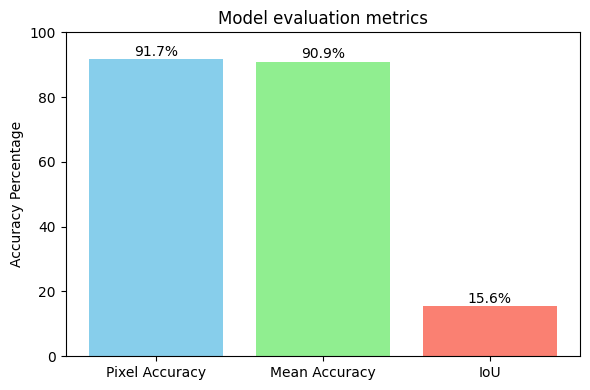

(0.9168778878671152, 0.9092515053394792, 0.155505379924897)

In [75]:
evaluate_segmentation(model, test_loader, plot=True)

The result with just the loss dice function is not actually the greatest, since, as we saw, the attention is pushed towards the overlapping in a general sense. We can move towards a leveraging between the cross entropy and dice function with the combo loss.

In [76]:
import torch.nn.functional as F

combomodel = UNet(in_channels=3, out_channels=1)
optimizer = optim.Adam(combomodel.parameters(), lr=1e-4)
crossentropy = F.binary_cross_entropy

combomodel.to(device)
loss_vec = []

In [60]:
def combo_loss(inputs, targets, ratio=0.7):
    probs = torch.sigmoid(inputs)
    ce = F.binary_cross_entropy_with_logits(inputs, targets)
    dice = (2 * (probs * targets).sum() + 1e-6) / (probs.sum() + targets.sum() + 1e-6)
    return ratio * ce + (1-ratio) * (1 - dice)

Epoch 1/1 

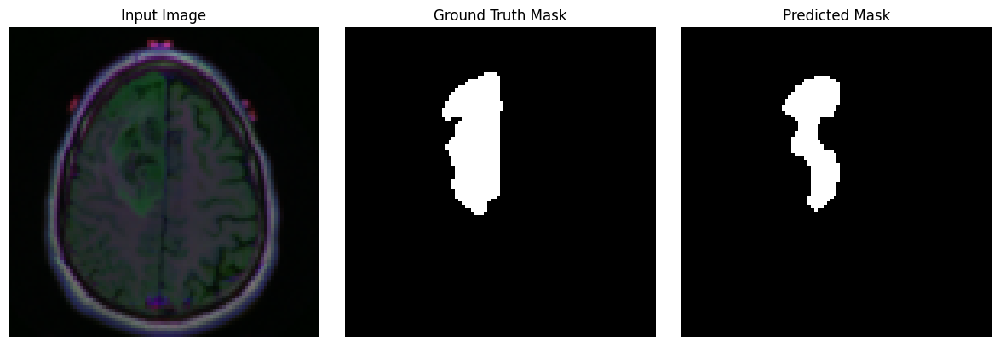

Final loss: 0.0556


In [83]:
num_epochs = 1

for i in range(num_epochs):
    print(f"Epoch {i+1}/{num_epochs}", end=' ')
    combomodel, final_loss = training(combomodel, 
                                 train_loader, 
                                 optimizer, 
                                 crossentropy, 
                                 num_epochs=1, 
                                 plots=True, comments=False)
    print(f"Final loss: {final_loss:.4f}")

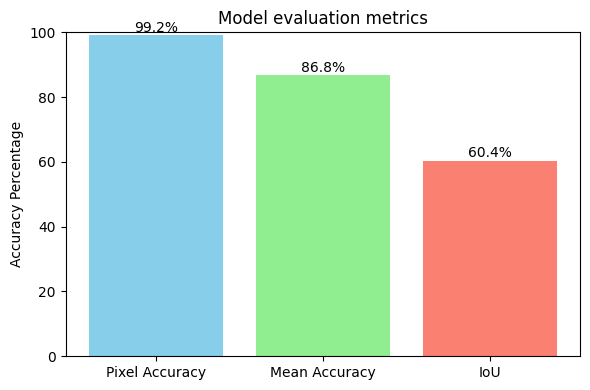

(0.9917557327835648, 0.8684556884318295, 0.6041033434650046)

In [84]:
evaluate_segmentation(combomodel, test_loader, plot=True)

The combo loss seems to be more appropriate in the case of this problem. We can try also with a 0.5 ratio:

In [87]:
import torch.nn.functional as F

combomodel2 = UNet(in_channels=3, out_channels=1)
optimizer = optim.Adam(combomodel2.parameters(), lr=1e-4)
crossentropy = F.binary_cross_entropy

combomodel2.to(device)
loss_vec = []

Epoch 1/1 

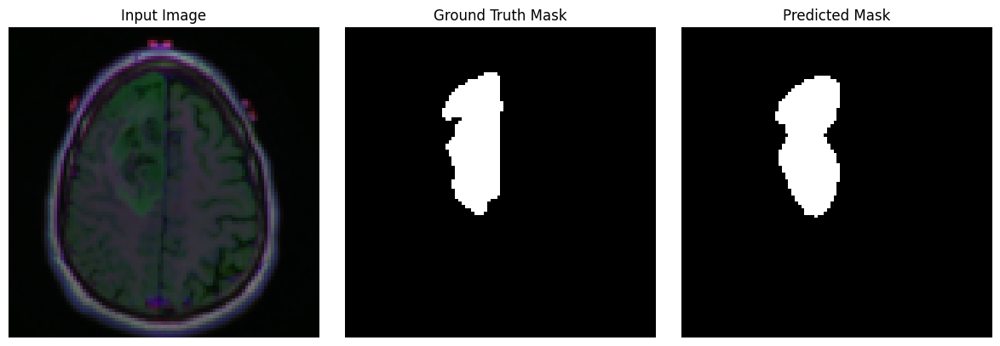

Final loss: 0.0083


In [94]:
num_epochs = 1

for i in range(num_epochs):
    print(f"Epoch {i+1}/{num_epochs}", end=' ')
    combomodel2, final_loss = training(combomodel2, 
                                 train_loader, 
                                 optimizer, 
                                 crossentropy, 
                                 num_epochs=1, 
                                 plots=True, comments=False)
    print(f"Final loss: {final_loss:.4f}")

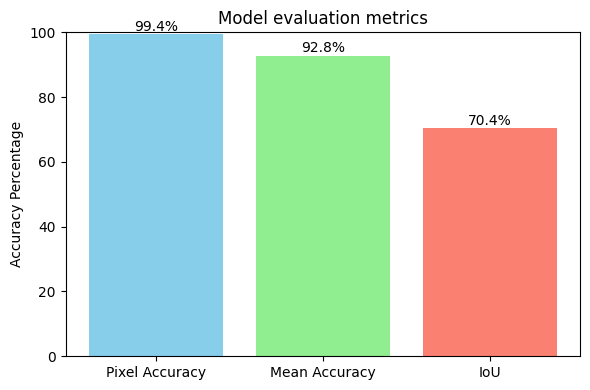

(0.9938703466344763, 0.9278001236225081, 0.7042160378515725)

In [95]:
evaluate_segmentation(combomodel2, test_loader, plot=True)

#### U-net final considerations 
We can visualize also on other datapoints the model result

In [ ]:
# for i in range(25):
#    display_results(combomodel2, train_set, i)  # Visualizza un esempio specifico

In [ ]:
# Saving the trained model
# model, combomodel, combomodel2
torch.save(model, '../Trained models/unet_model.pth')
torch.save(combomodel, '../Trained models/unet_combomodel.pth')
torch.save(combomodel2, '../Trained models/unet_combomodel2.pth')

### Vision Transformers

#### Introduction to the architecture

U-net is not the only approach we can try for this specific task, since the recent advances with vision transformed has shown great results `[9]` . The idea is to offer a similar approach to image handling than the one proposed to the Natural Language processing word one. 

Transformers as architectures are originally designed for **sequential data in Natural Language Processing** and those are based on the **self-attention mechanism**; the visual transformer leverage the same architecture for the image handling. However, the contrapposition with CNN is more evident where
* The CNN is used to handle **spacial information** (local to general) with convolution
* The ViT divide the image into patches and process each of them as token element of the sequence, same as words in a sentence. By using self attention, the ViT are able to introduce attentions between **all** image patches, making implicitly and without convolution available the local and global dependency treated.

In particular, the difference key is:
- The **patches usage** 
- The **self attention** that **each patch** reserve to all others (across the whole image)
- Positional embedding, used to preserve the spacial information -since transformers are used for sequences.

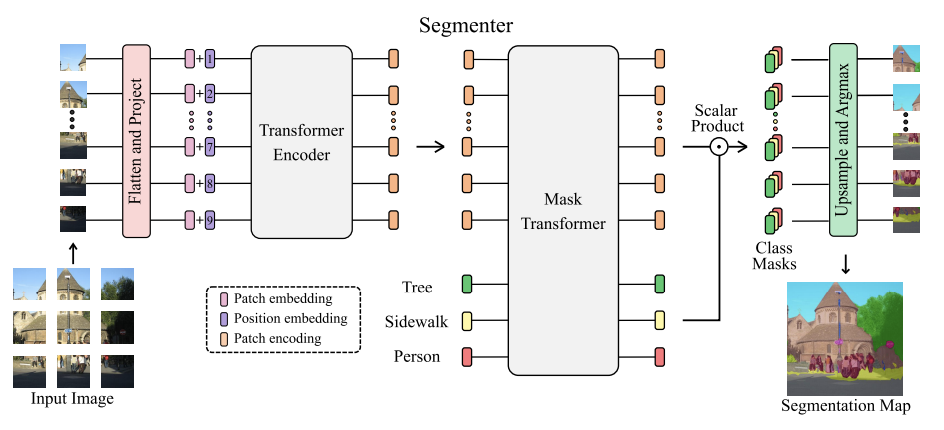

> **Fig. 3** *Overview of our approach Segmenter. (Left) Encoder: The image patches are projected to a sequence of embeddings and then encoded with a transformer. (Right) Decoder: A mask transformer takes as input the output of the encoder
and class embeddings to predict segmentation masks. `[10]`*

Different approaches are available, but the key ideas stays the same.

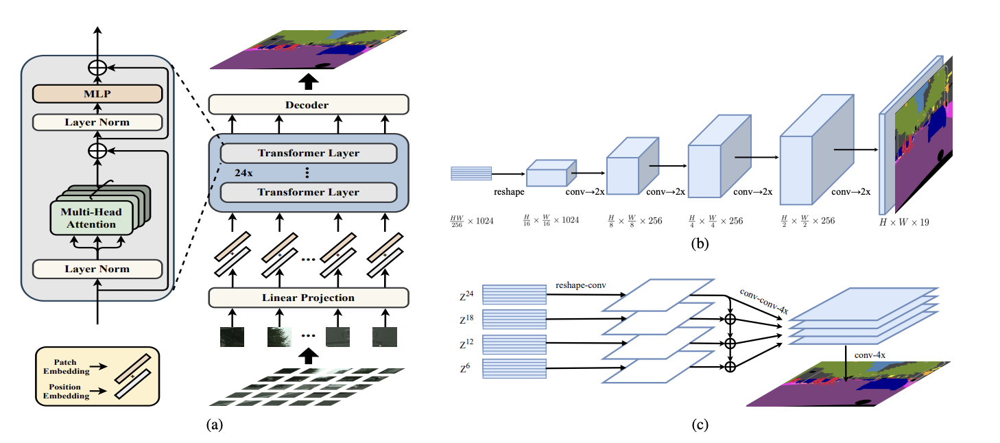

> **Fig 4.** Schematic illustration of the proposed SEgmentation TRansformer (SETR) (a). We first split an image into fixed-size patches, linearly embed each of them, add position embeddings, and feed the resulting sequence of vectors to a standard Transformer encoder. To perform pixel-wise segmentation, we introduce different decoder designs: (b) progressive upsampling (resulting in a variant called SETRPUP); and (c) multi-level feature aggregation (a variant called SETR-MLA).

In the last architecture we see a specific case of vision transformer: a **segmentation transformer**. In this case the image gets still divided into fixed size patches. The patch as a token gets projected into a vector in the *embedding patch* phase, while *position embedding are added to maintain spatial informations* about the tokens. Once done, this gets feed into transformer encoder, which is the same of NLP: multihead attentions, layer normalization and feed forward.

The transformer layer output then gets decoded into a 2D map, with progressive upsampling with deconvolution and relu. So, the actual difference in here is the initial treatment, while different approaches are available for deconvolution (e.g. "b" is similar to autoencoder one).

#### Model definition

Let's consider the model definition of the structure above for image segmentation task.

**1 )  Patches**

Given the image batch of shape $B\times 3\times W \times H$ we firstly need to prepare the image **patches** described above.

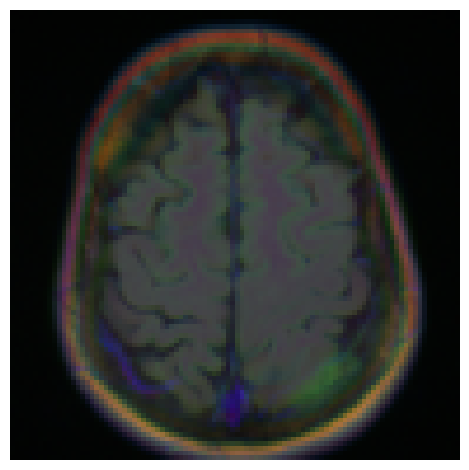

torch.Size([1, 3, 96, 96])

In [26]:
img, _ = reduced_dataset[3]
plt.imshow(img.squeeze().permute(1, 2, 0).cpu())
plt.axis('off')
plt.tight_layout()
plt.show()

img = img.unsqueeze(0) # (the following function expects a batch of images)
img.shape

Now, imagine we need to produce the image with 16 patches (so 4 cut per each side). THe idea is to cut images vertically and orizontaly, then to linearize the output after a change in the order of the tensors.

In [27]:
def patching(image, num_cuts=4, plot = False):
    # num_cuts := Number of patches along one side of the image (assuming square patches)
    
    patchsize = int(W / num_cuts)   # Size of the patches
    
    # apply a sliding window of size patchsize with step patchsize firstly o H then W and reorganize the patches
    patches = image.unfold(2, patchsize, patchsize)\
                .unfold(3, patchsize, patchsize)\
                .permute(0, 2, 3, 1, 4, 5)\
                .reshape(image.size(0), -1, 3, patchsize, patchsize)  # (B, N, C, ps, ps)

    if plot:
        fig, axs = plt.subplots(num_cuts, num_cuts, figsize=(5, 5))
        for i in range(num_cuts * num_cuts):
            ax = axs[i // num_cuts, i % num_cuts]
            patch = patches[0, i].permute(1, 2, 0).cpu().numpy()
            ax.imshow(patch)
            ax.axis('off')

        plt.tight_layout()
        plt.show()
    
    return patches, patchsize

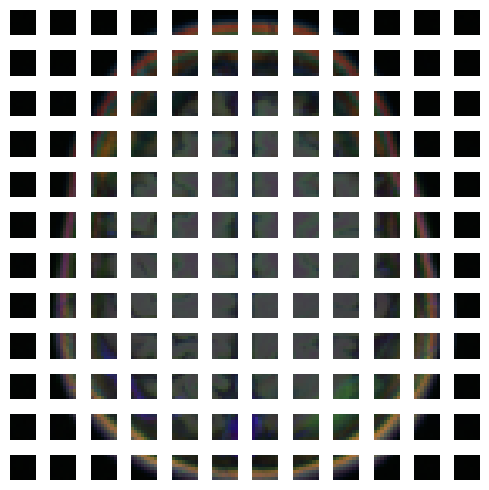

torch.Size([1, 144, 3, 8, 8])

In [28]:
num_cuts = 12 # over 96
patches , patchsize = patching(img, num_cuts, plot=True)
patches.shape

Remember that the **higher** is the number of the patches, the higher are the actual token received by the model itself. So, it's suggested to use a big number; computationally speaking, however, there is a huge limitation in increasing this quantity, since:
* It's related to the decovolution layers (and then to the actual number of parameters)
* It's computationally heavier to do this over and over again, for each epoch.

However, the result seen is the image patches obtained.

**2 ) Embedding**

Now the aim is to transform patches into vectors and add to them the positional embedding, so to pass them to the transformer encoder. The idea is to **transform the actual patch linearized into tokens, thanks to a linear layer. In the case of embedding we need to use a linear module:

In [ ]:
# Where the in_ch is the number of channels of the input image (3 for RGB images)
# dim is the dimension of the embedding space (e.g., 1024)

in_ch = img.shape[1]  # Number of channels of the input image (3 for RGB images)
dim = 1024  # Dimension of the embedding space
patch_embed = nn.Linear(patchsize * patchsize * in_ch, dim) # it's a function!

While for the positional embedding (which helps in the maintainment of the spatial informations). Notice also that here we introduce a parameter of the subsequent network, the dimension. It's the output dimension of the linear pass; it's the dimensionality of the **token**, and of course the higher, the higher the parameters and the possibility to learn better - even if once again this would lead to an **impossibility of training the model**, due to the actual computational cost.

In [31]:
pos_embed = nn.Parameter(torch.randn(1, num_cuts**2 , dim))
pos_embed

Parameter containing:
tensor([[[-0.4167, -0.5740,  0.2515,  ..., -0.6951,  0.4432, -0.7471],
         [ 0.5729,  1.4829, -0.5958,  ...,  0.4629, -1.7486,  0.4936],
         [-1.1472, -0.0310, -2.6187,  ..., -0.9157, -1.6211, -0.3970],
         ...,
         [-1.2673,  0.0952, -1.1499,  ..., -0.7744, -0.6551, -1.7978],
         [ 2.0205, -0.0693,  0.4301,  ...,  0.4317,  1.3075,  2.0427],
         [ 1.0916,  0.2058, -1.0003,  ..., -0.2962,  1.5228,  0.2405]]],
       requires_grad=True)

In [32]:
patches = patches.flatten(2)

Then this phase ends with:

In [33]:
patches = patch_embed(patches) + pos_embed 

In [34]:
patches.shape

torch.Size([1, 144, 1024])

**3 ) Transformer encoder**

The transformer encoder is coherent with the previous image presented. Notice that we introduce some parameters, i.e.
* heads number: the attention heads of the transformer encoder, the higher, the more the model can find different relations
* mlp dimension: the dimension of the feed forward models.

In [32]:
class TransformerEncoderLayer(nn.Module):
    def __init__(self, dim, heads, mlp_dim):
        super().__init__()
        self.norm1 = nn.LayerNorm(dim)
        self.attn = nn.MultiheadAttention(embed_dim=dim, num_heads=heads)
        self.norm2 = nn.LayerNorm(dim)
        self.mlp = nn.Sequential(
            nn.Linear(dim, mlp_dim),
            nn.ReLU(),
            nn.Linear(mlp_dim, dim)
        )

    def forward(self, x):
        x = x + self.attn(self.norm1(x), self.norm1(x), self.norm1(x))[0]
        x = x + self.mlp(self.norm2(x))
        return x

This is the transformer layer described above in the picture.

In [36]:
transformer_layer = TransformerEncoderLayer(dim=dim, heads=8, mlp_dim=2048)
transf_patches = transformer_layer(patches)
transf_patches.shape

torch.Size([1, 144, 1024])

**4) Reshaping and deconvolution phase (decoder)**

The decoder is the typical deconvolution sequence we're used to see:

In [37]:
decoder = nn.Sequential(
            nn.ConvTranspose2d(dim, 256, kernel_size=2, stride=2),  # H/16 -> H/8
            nn.ReLU(),
            nn.ConvTranspose2d(256, 256, kernel_size=2, stride=2),  # H/8 -> H/4
            nn.ReLU(),
            nn.ConvTranspose2d(256, 256, kernel_size=2, stride=2),  # H/4 -> H/2
            nn.ReLU(),
            nn.ConvTranspose2d(256, 256, kernel_size=2, stride=2),  # H/2 -> H
            nn.ReLU(),
            nn.Conv2d(256, 1, kernel_size=1)
)

In [33]:
B, N, dim = transf_patches.shape  # es. (1,16,1024)
transf_patches = transf_patches.permute(0, 2, 1)  # (B, dim, N)
transf_patches = transf_patches.reshape(B, dim, num_cuts, num_cuts)

In [34]:
decoded = decoder(transf_patches)

In [35]:
predicted_mask = (torch.sigmoid(decoded) > 0.5).float()
predicted_mask

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]])

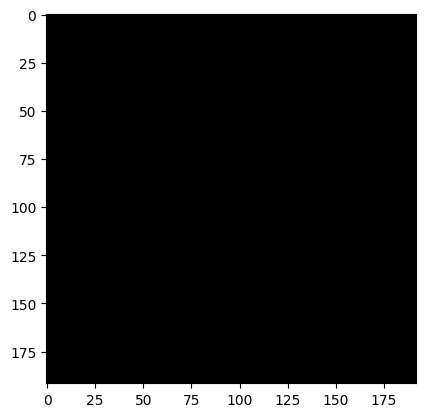

In [36]:
plt.imshow(predicted_mask[0, 0].cpu(), cmap='gray')
None

> The number of upsamplig is dependent on the number of cuts

Now we have a clear idea of the structure, we can end with the full model definition. The training procedure will be the same as before, since the methodologies and the **loss** are task and not architecture dependent.

In [ ]:
# import torch
# torch.mps.empty_cache()

# I once filled the mps device... :(

THe model will be made in a way to make explicit the number of dimensions, heads and depts (number of transformer layers)

In [ ]:
class SETR(nn.Module):

    def __init__(self, img_size=128, num_cuts = 6,
                 in_ch=3, num_classes=1,
                 dim=1024, depth=8, heads=8, mlp_dim=2048):
        
        super().__init__()

        # Internal parameters definition:
        self.patch_size = int(W / num_cuts)
        self.num_cuts = num_cuts
        self.num_patches = self.num_cuts ** 2
        self.dim = dim
        self.in_ch = in_ch 

        # Patch + Positional Embedding. We need to redefine this due to generalization...
        self.patch_embed = nn.Linear(self.patch_size * self.patch_size * in_ch, dim)
        self.pos_embed = nn.Parameter(torch.randn(1, self.num_patches, dim))

        # Transformer Encoder. We refer to the previously defined class
        self.transformer = nn.Sequential(
            *[TransformerEncoderLayer(dim, heads, mlp_dim) for _ in range(depth)]
        )

        # Deconvolution decoder
        # Notice that is the same of before byt dimension here is generic
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(dim, 256, kernel_size=2, stride=2), 
            nn.ReLU(),
            nn.ConvTranspose2d(256, 256, kernel_size=2, stride=2),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 256, kernel_size=2, stride=2),
            nn.ReLU(),
            #nn.ConvTranspose2d(256, 256, kernel_size=2, stride=2),
            #nn.ReLU(),
            nn.Conv2d(256, num_classes, kernel_size=1)
        )

    def forward(self, x):

        # Split image into patches
        B = x.size(0)
        x = x.unfold(2, self.patch_size, self.patch_size)\
             .unfold(3, self.patch_size, self.patch_size)\
             .permute(0, 2, 3, 1, 4, 5)\
             .reshape(B, self.num_patches, self.in_ch * self.patch_size * self.patch_size)

        # print(f"Patched shape: {x.shape}")

        # Embedding + Positional encoding
        x = self.patch_embed(x) + self.pos_embed 

        # Transformer encoder
        x = x.permute(1, 0, 2)  # (N, B, dim) for nn.MultiheadAttention
        x = self.transformer(x)
        x = x.permute(1, 2, 0)  # (B, dim, N)

        # Reshape to 2D feature map
        x = x.reshape(B, self.dim, self.num_cuts, self.num_cuts)  # (B, dim, H/16, W/16)

        # Decoder
        x = self.decoder(x)  # (B, num_classes, H, W)
        
        # Now we need values at zero or one
        return torch.sigmoid(x)

#### Training Procedure of the SETR

In [34]:
import torch.nn.functional as F
import torch.optim as optim

setr_model = SETR(img_size=W, num_cuts=12, in_ch=3, num_classes=1,
                            dim=256, depth=4, heads=4, mlp_dim=256)

optimizer = optim.Adam(setr_model.parameters(), lr=1e-4)
setr_model.to(device)
loss_vec = []
num_epochs = 1

> Notice that the dimension is proportional to the cut number, that's why we've originally selected such a W and H

And we can start the learning

Epoch 1/10 

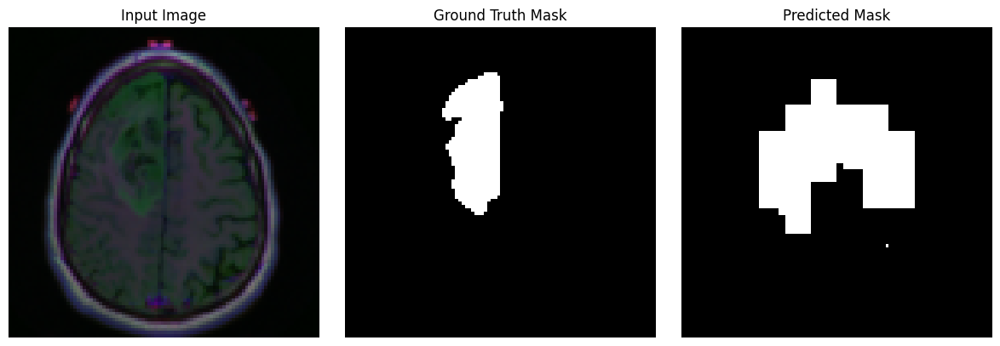

Final loss: 0.9482
Epoch 2/10 

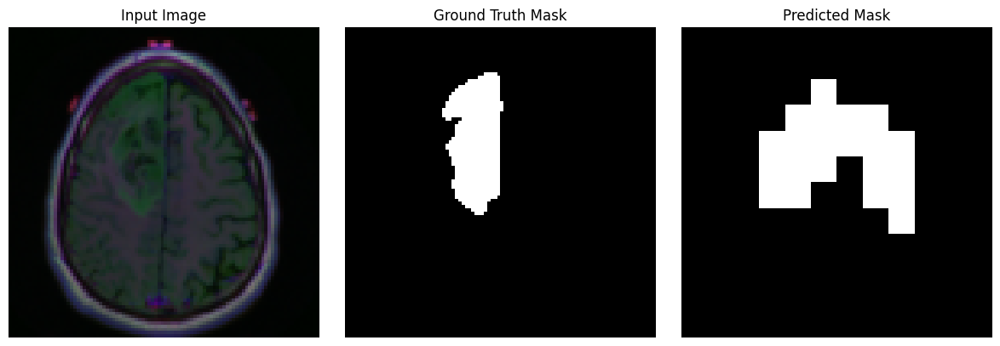

Final loss: 0.9503
Epoch 3/10 

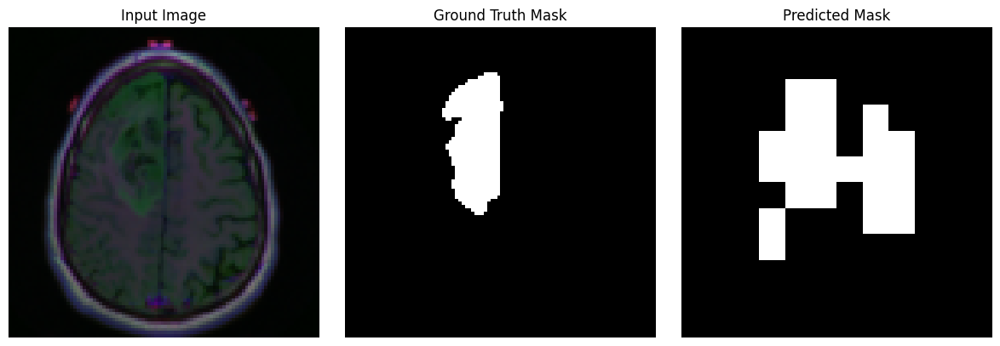

Final loss: 0.9252
Epoch 4/10 

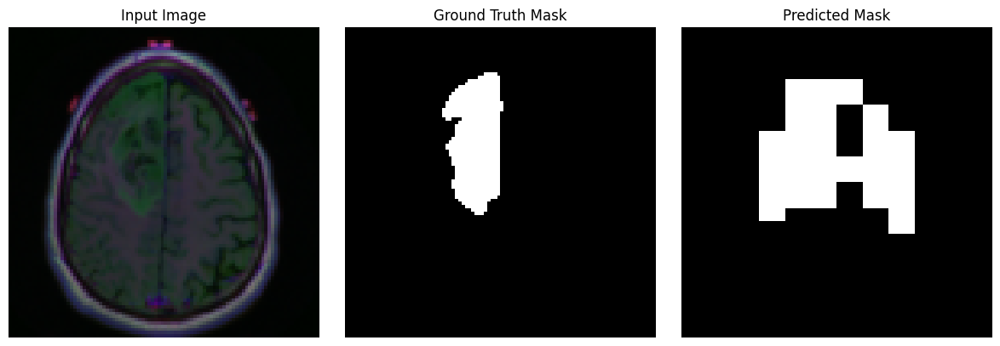

Final loss: 0.9611
Epoch 5/10 

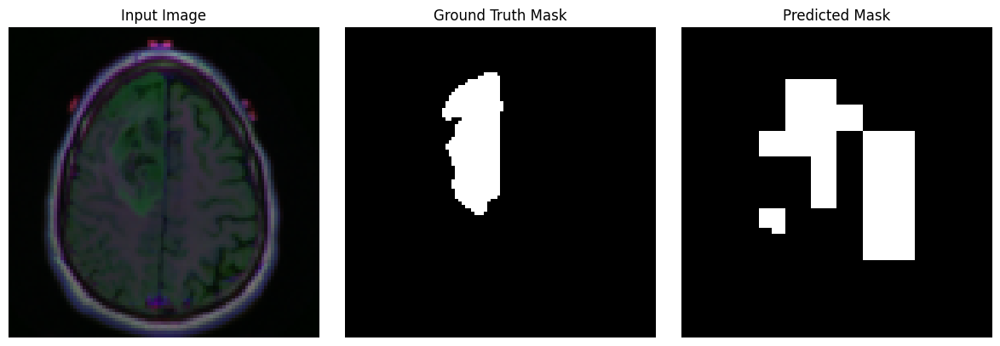

Final loss: 0.9388
Epoch 6/10 

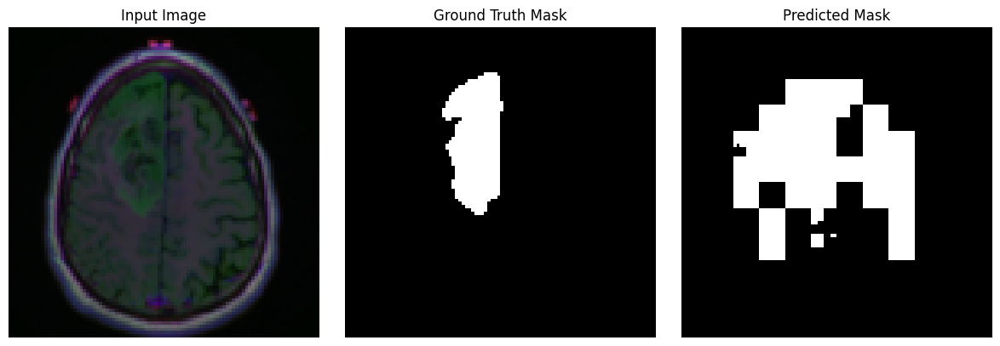

Final loss: 0.9534
Epoch 7/10 

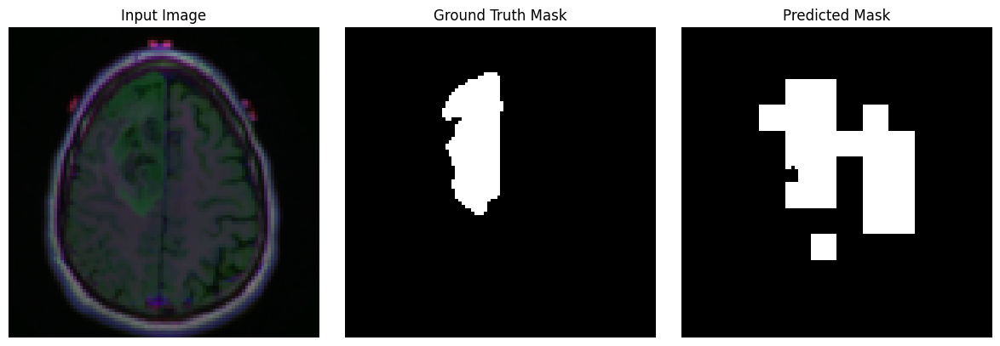

Final loss: 0.9650
Epoch 8/10 

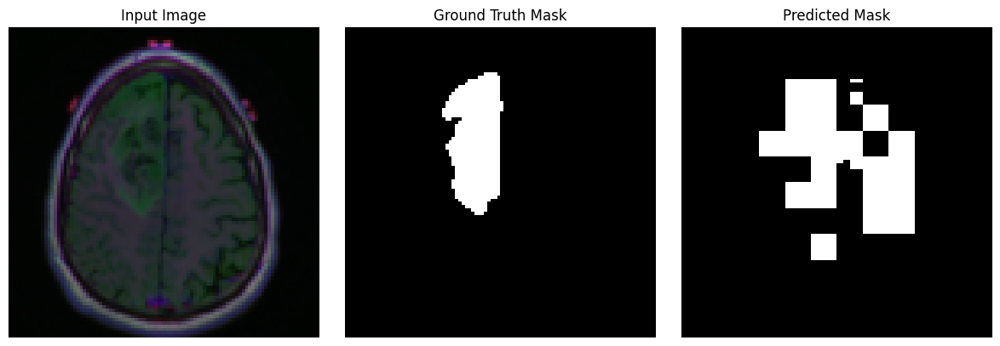

Final loss: 0.9766
Epoch 9/10 

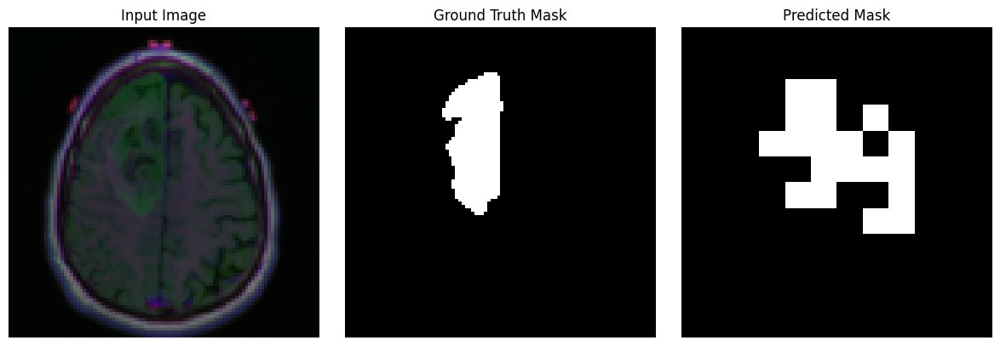

Final loss: 0.9707
Epoch 10/10 

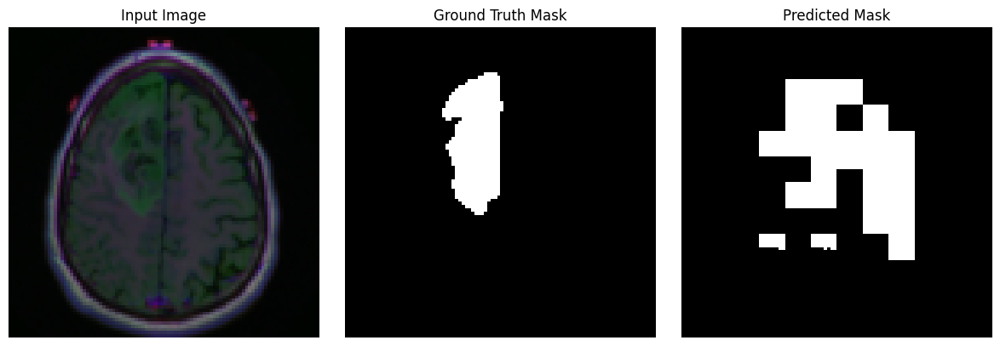

Final loss: 0.9335


In [46]:
num_epochs = 10

for i in range(num_epochs):
    print(f"Epoch {i+1}/{num_epochs}", end=' ')
    setr_model, final_loss = training(setr_model, 
                                 train_loader, 
                                 optimizer, 
                                 diceloss, 
                                 num_epochs=1, 
                                 plots=True, comments=False)
    print(f"Final loss: {final_loss:.4f}")

Epoch 1/20 

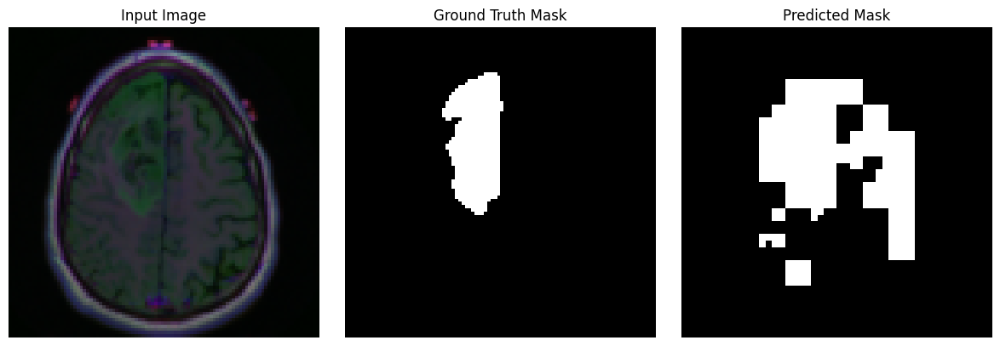

Final loss: 0.9522
Epoch 2/20 

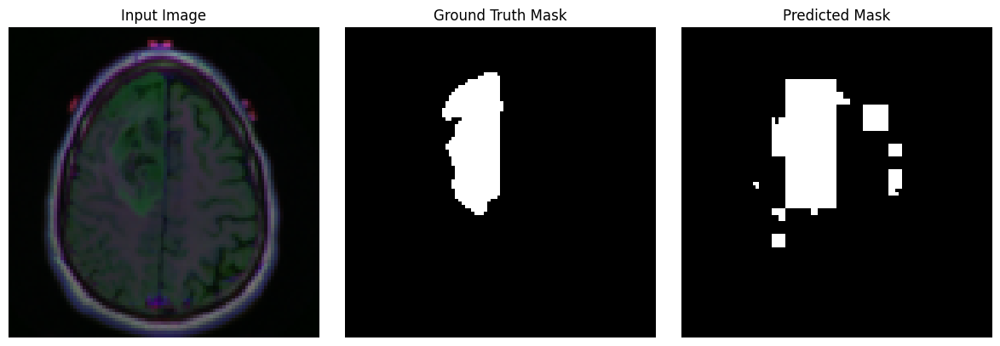

Final loss: 0.9481
Epoch 3/20 

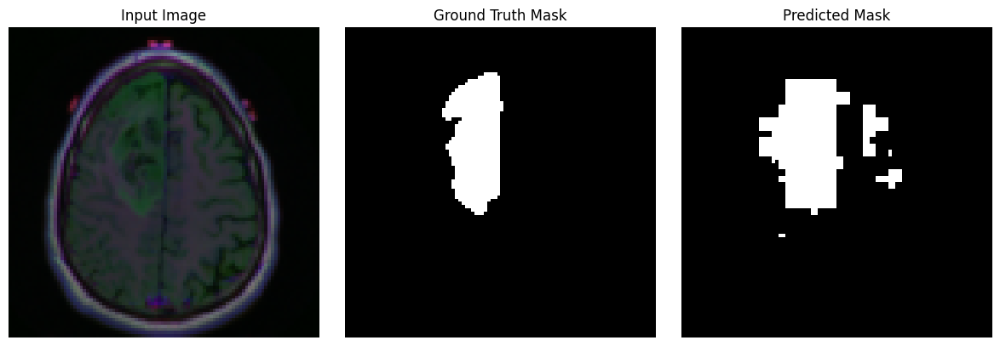

Final loss: 0.9527
Epoch 4/20 

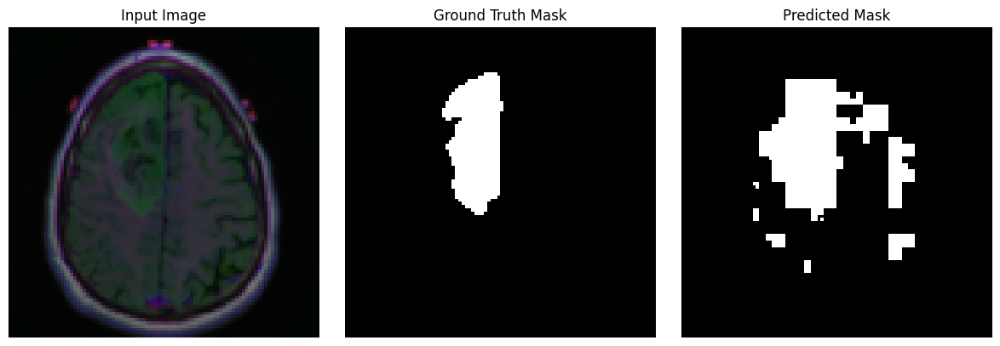

Final loss: 0.9086
Epoch 5/20 

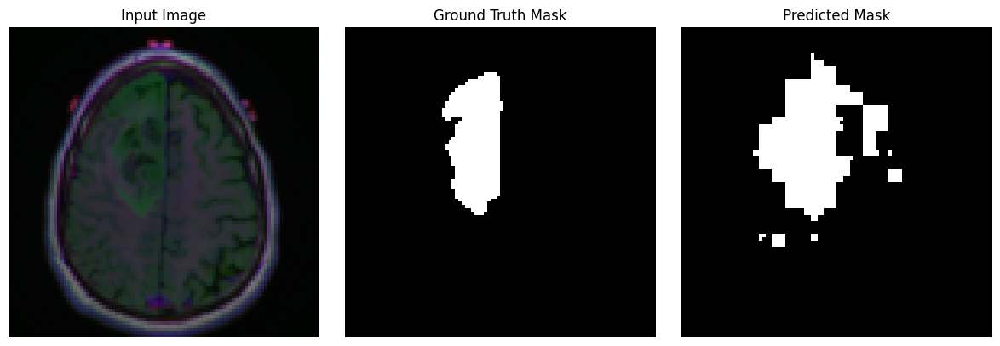

Final loss: 0.9454
Epoch 6/20 

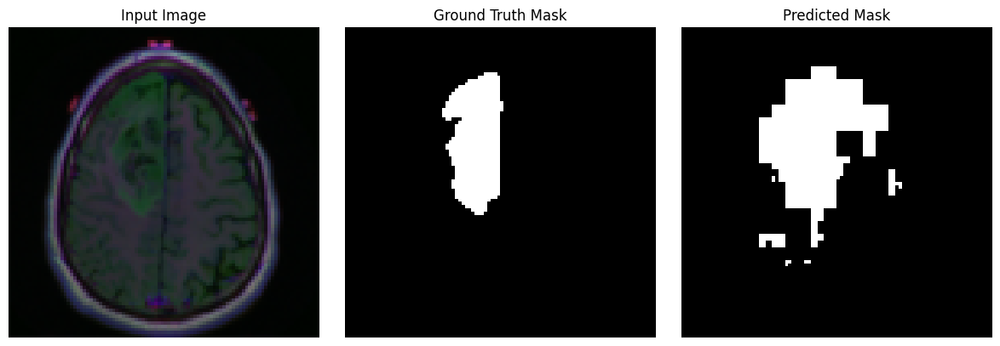

Final loss: 0.9612
Epoch 7/20 

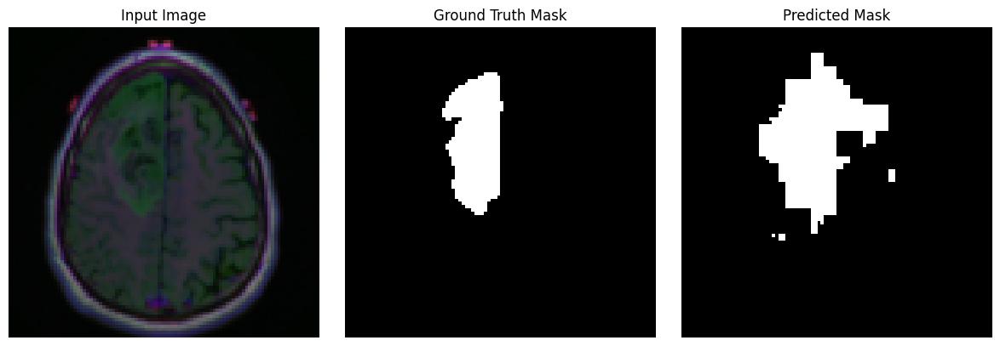

Final loss: 0.9501
Epoch 8/20 

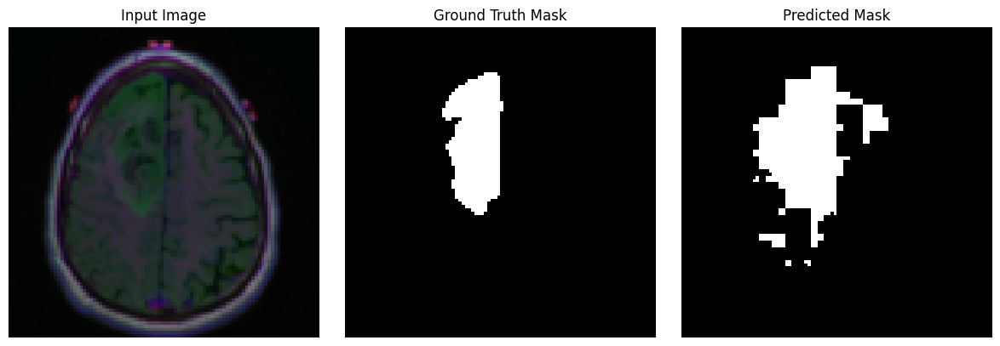

Final loss: 0.9681
Epoch 9/20 

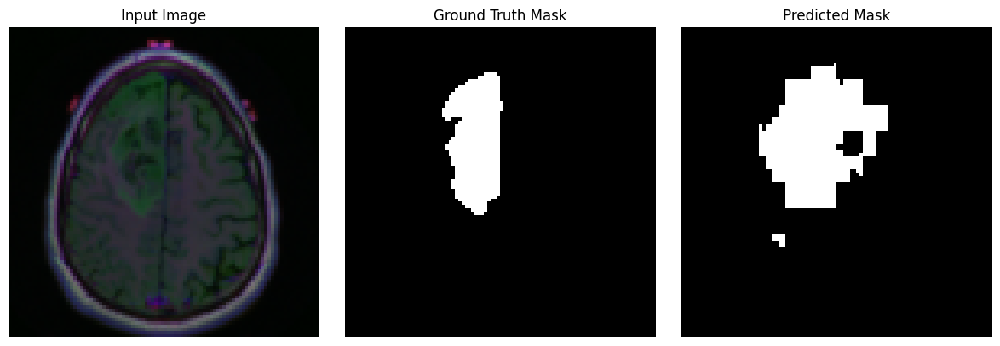

Final loss: 0.9683
Epoch 10/20 

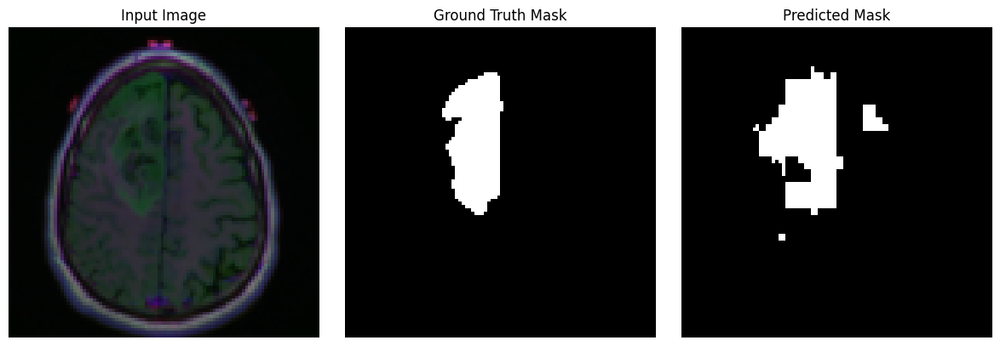

Final loss: 0.9341
Epoch 11/20 

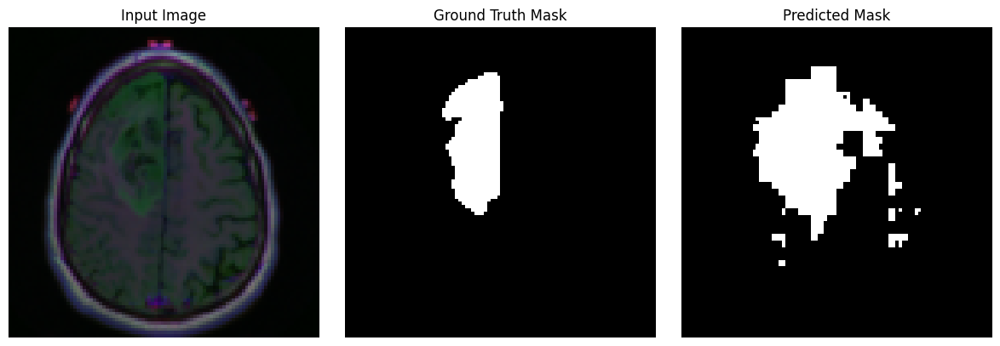

Final loss: 0.9595
Epoch 12/20 

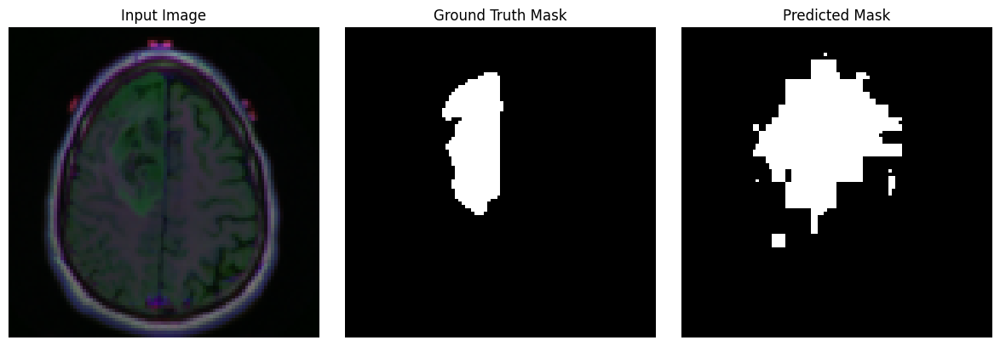

Final loss: 0.9505
Epoch 13/20 

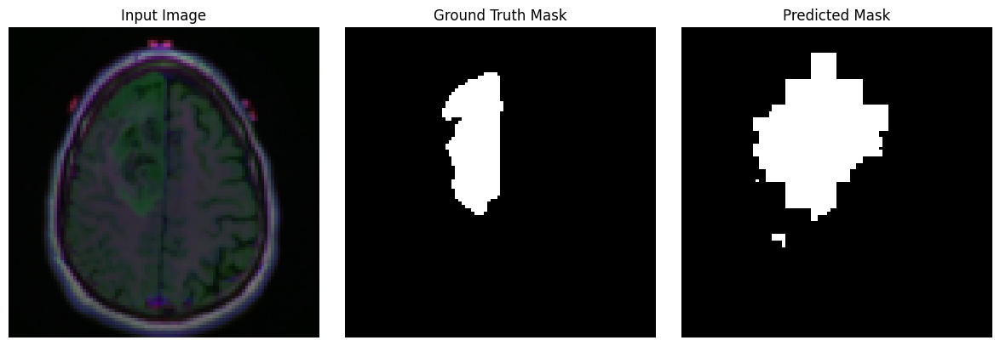

Final loss: 0.9726
Epoch 14/20 

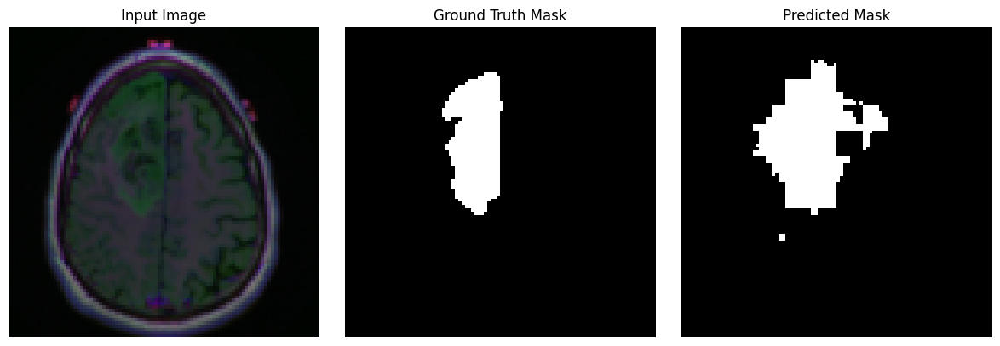

Final loss: 0.9666
Epoch 15/20 

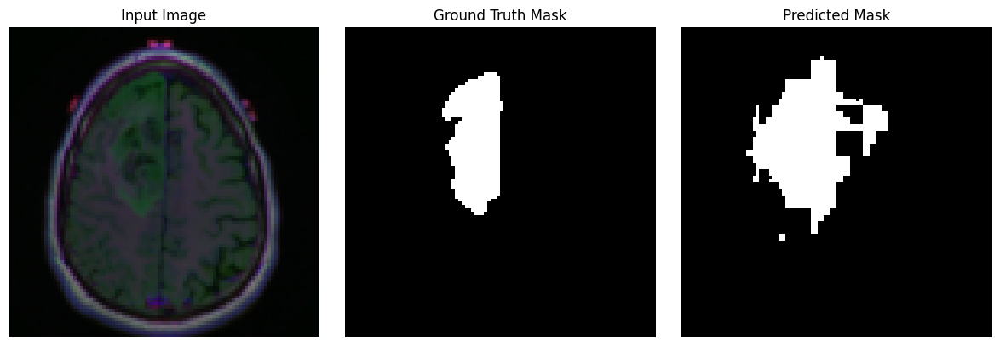

Final loss: 0.9663
Epoch 16/20 

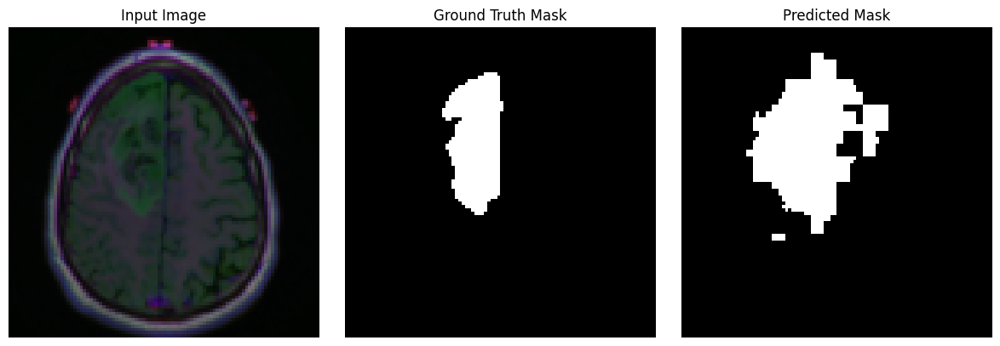

Final loss: 0.9553
Epoch 17/20 

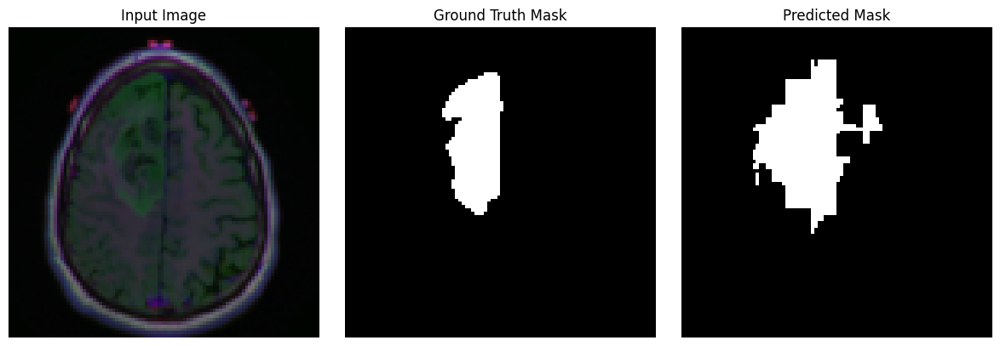

Final loss: 0.9378
Epoch 18/20 

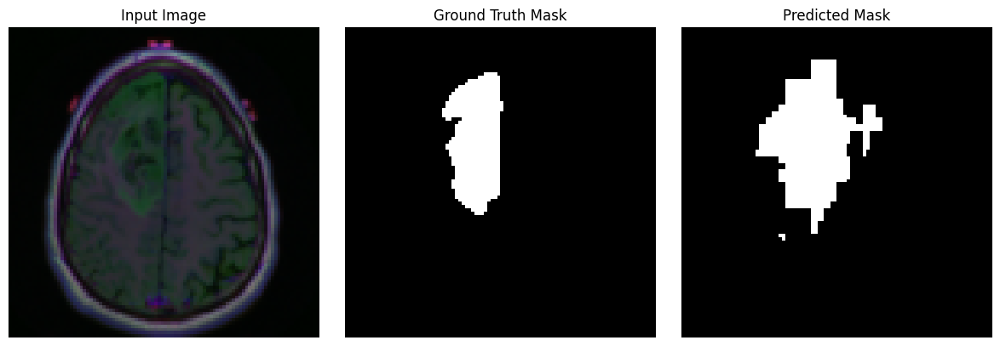

Final loss: 0.9581
Epoch 19/20 

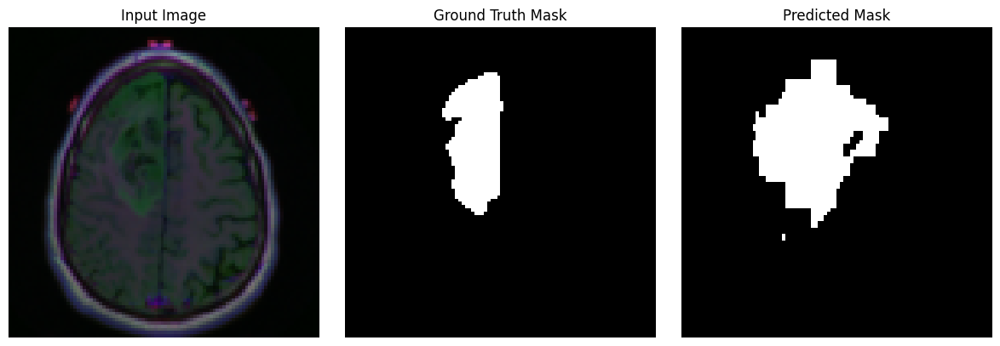

Final loss: 0.9594
Epoch 20/20 

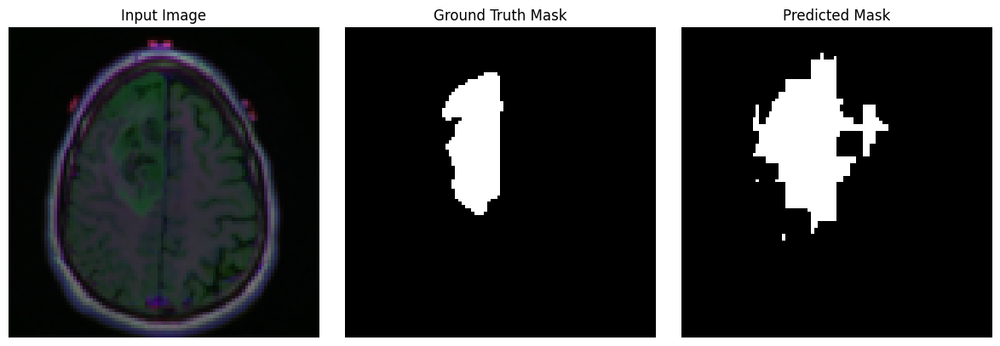

Final loss: 0.9301


In [49]:
num_epochs = 20

for i in range(num_epochs):
    print(f"Epoch {i+1}/{num_epochs}", end=' ')
    setr_model, final_loss = training(setr_model, 
                                 train_loader, 
                                 optimizer, 
                                 diceloss, 
                                 num_epochs=1, 
                                 plots=True, comments=False)
    print(f"Final loss: {final_loss:.4f}")

In [51]:
# Save the model
torch.save(setr_model, '../Trained models/setr_model.pth')

#### Accessing the results

In [ ]:
# for i in range(25):
#    display_results(setr_model, train_set, i)  # Visualizza un esempio specifico

In [ ]:
setr_loaded = torch.load('../Trained models/setr_model.pth')
setr_loaded.to(device)
None

In [58]:
optimizer = optim.Adam(setr_model.parameters(), lr=0.001)

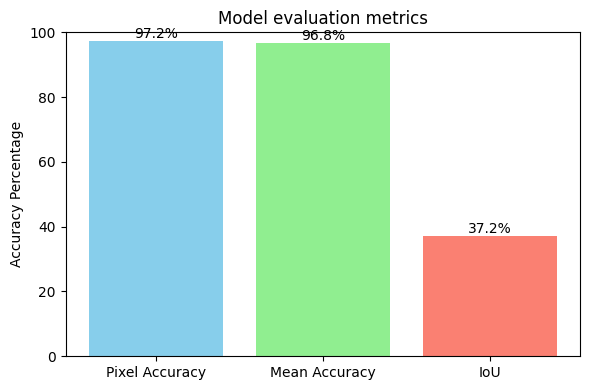

(0.9723601164641203, 0.9675240634038721, 0.37160074264898363)

In [55]:
evaluate_segmentation(setr_loaded, test_loader, plot=True)

#### Another training phase

In [67]:
import torch.nn.functional as F
import torch.optim as optim

setr_model_2 = SETR(img_size=W, num_cuts=12, in_ch=3, num_classes=1,
                            dim=256, depth=4, heads=4, mlp_dim=256)

optimizer = optim.Adam(setr_model_2.parameters(), lr=1e-4)
setr_model_2.to(device)
loss_vec = []
num_epochs = 1

In [81]:
setr_model_2.train()
None

Epoch 1/200 

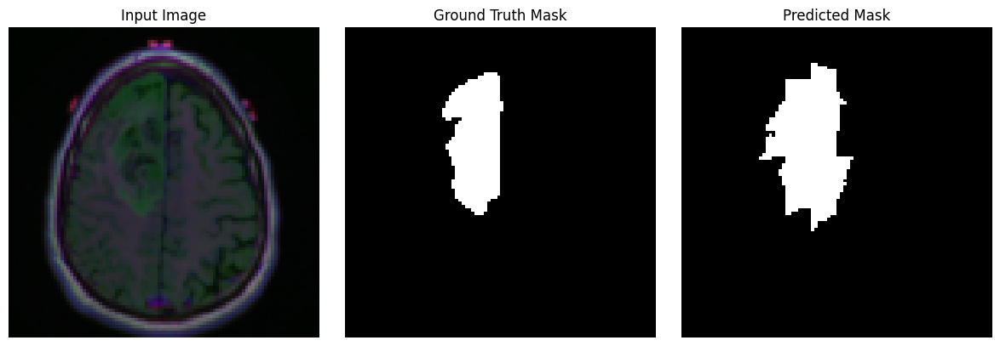

Final loss: 0.9741
Epoch 2/200 

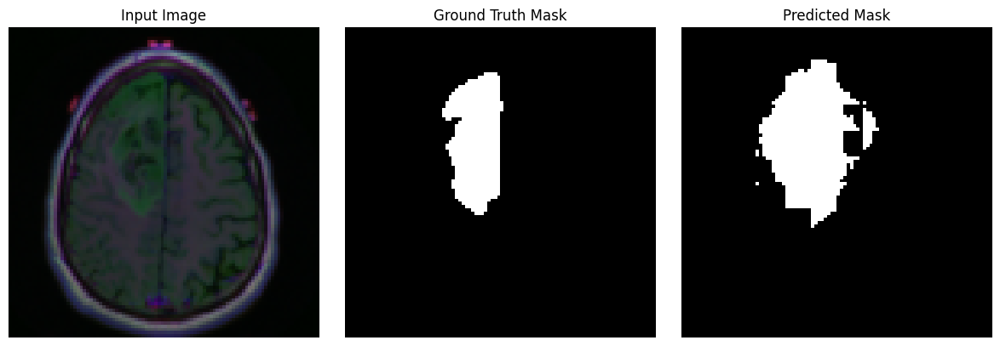

Final loss: 0.9315
Epoch 3/200 

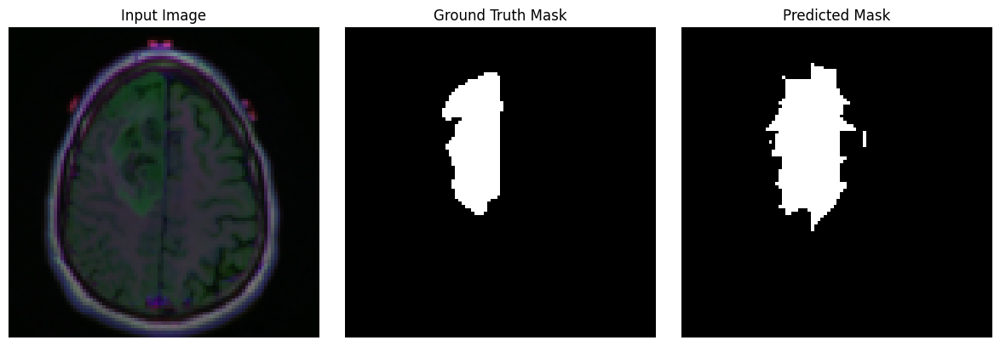

Final loss: 0.9562
Epoch 4/200 

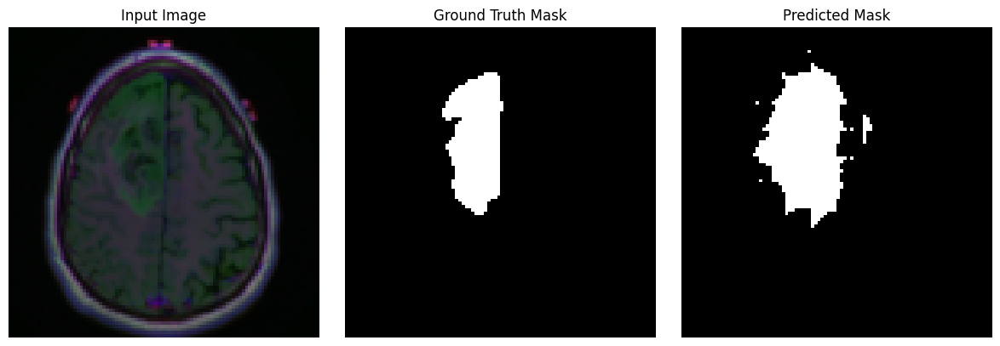

Final loss: 0.9521
Epoch 5/200 

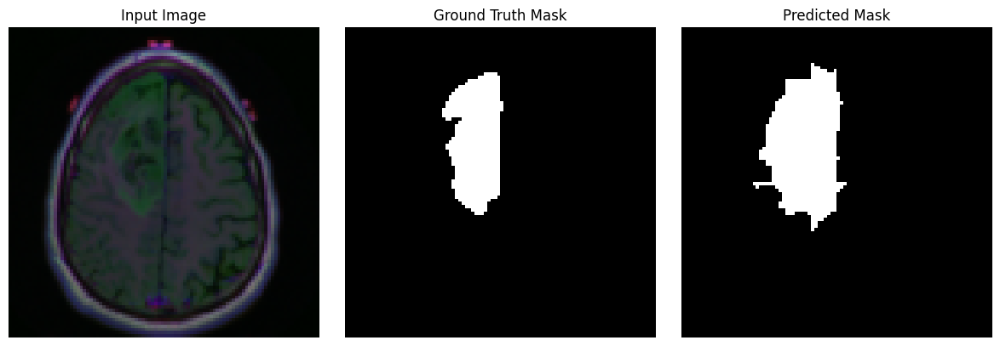

Final loss: 0.9388
Epoch 6/200 

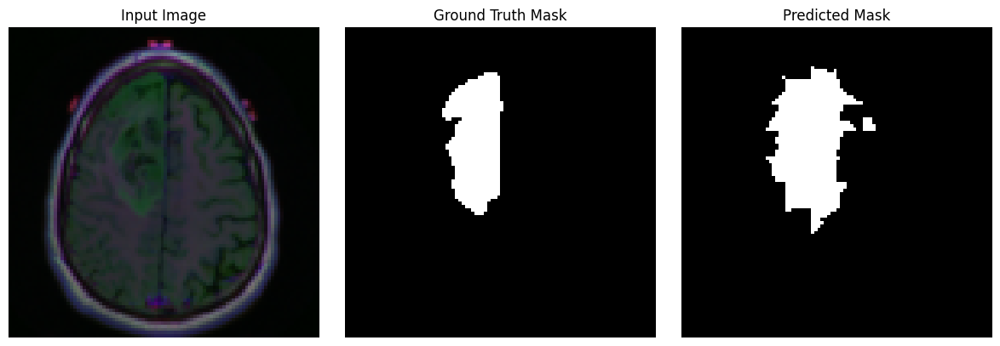

Final loss: 0.9705
Epoch 7/200 

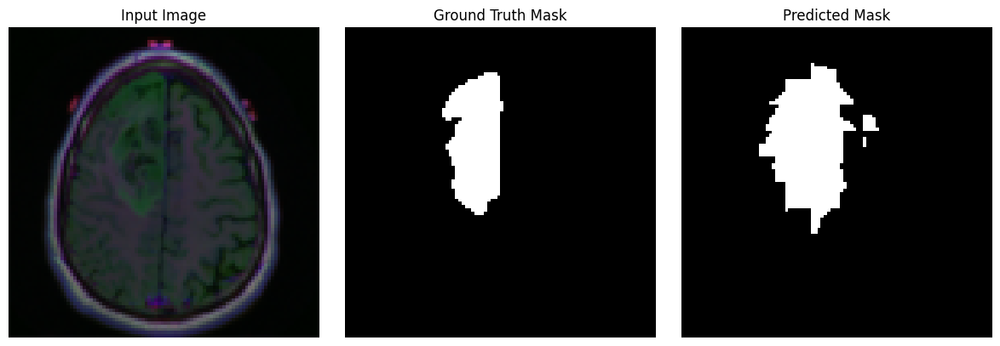

Final loss: 0.9637
Epoch 8/200 

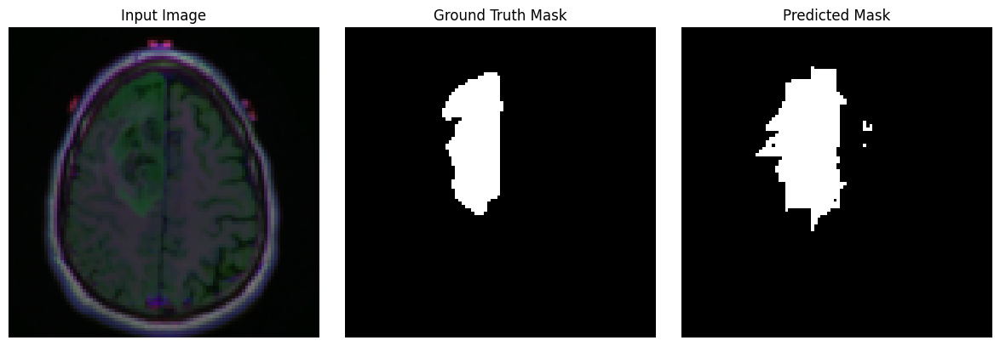

Final loss: 0.9368
Epoch 9/200 

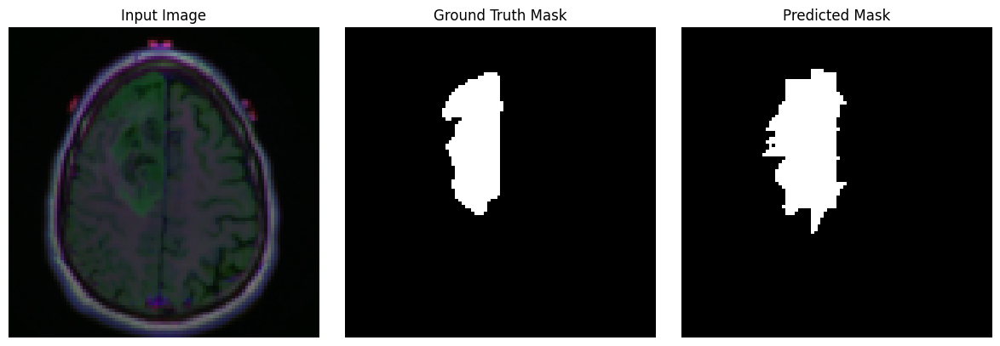

Final loss: 0.9537
Epoch 10/200 

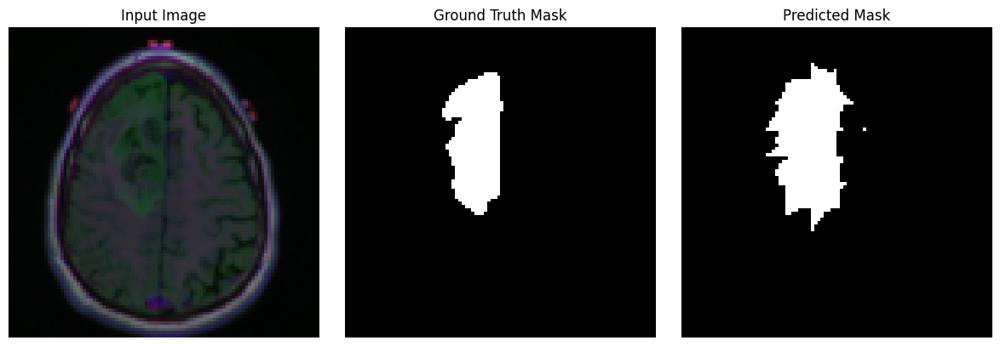

Final loss: 0.9274
Epoch 11/200 

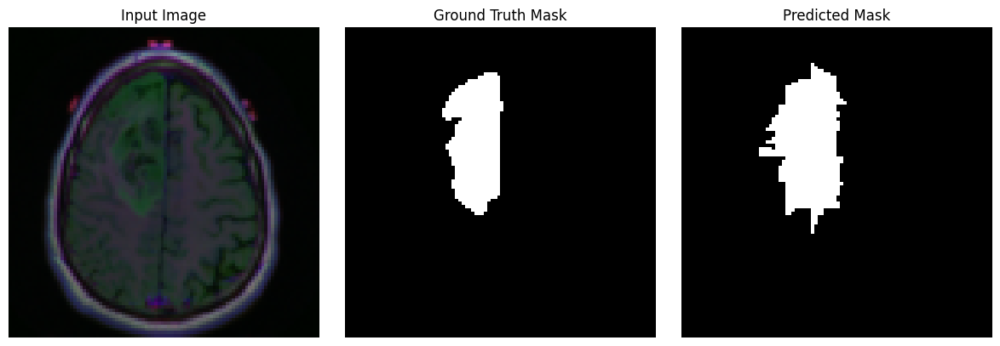

Final loss: 0.9291
Epoch 12/200 

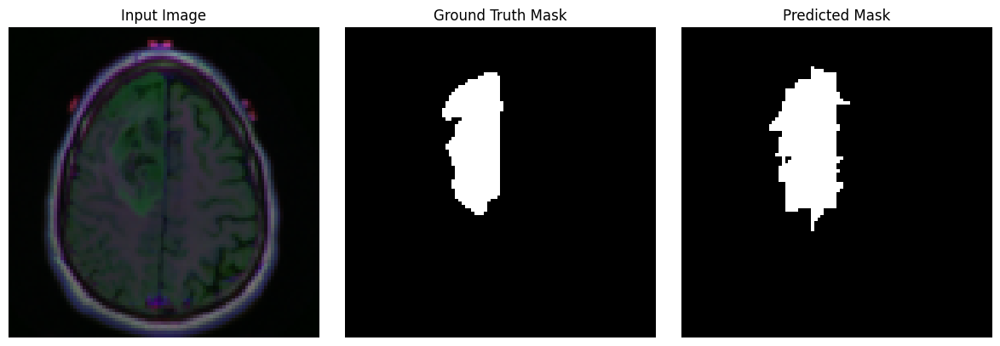

Final loss: 0.9607
Epoch 13/200 

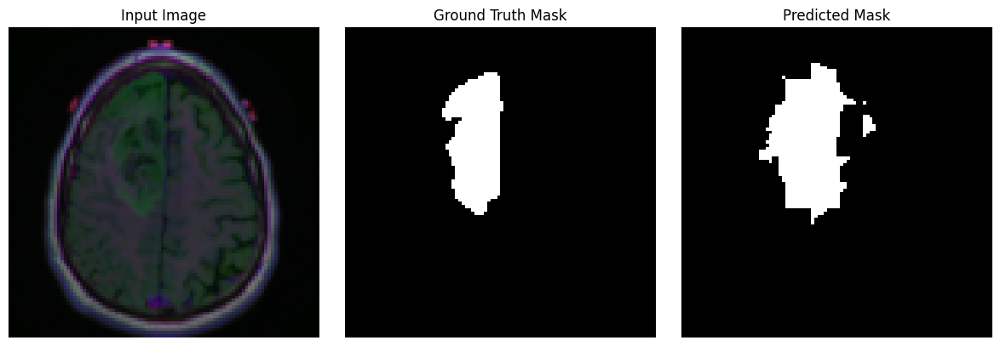

Final loss: 0.9736
Epoch 14/200 

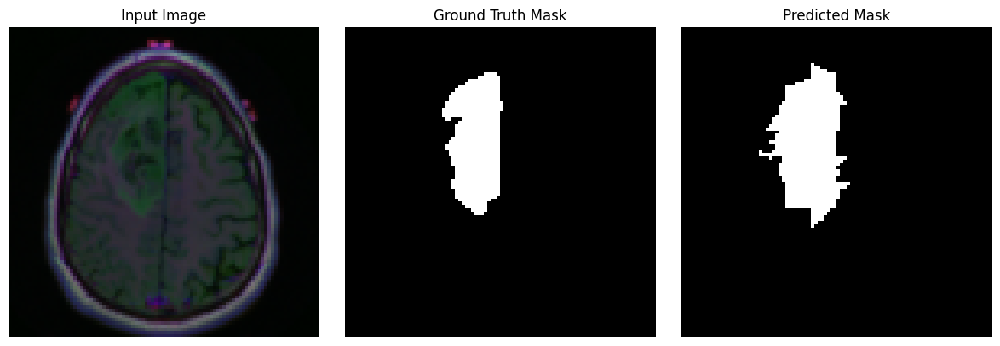

Final loss: 0.9674
Epoch 15/200 

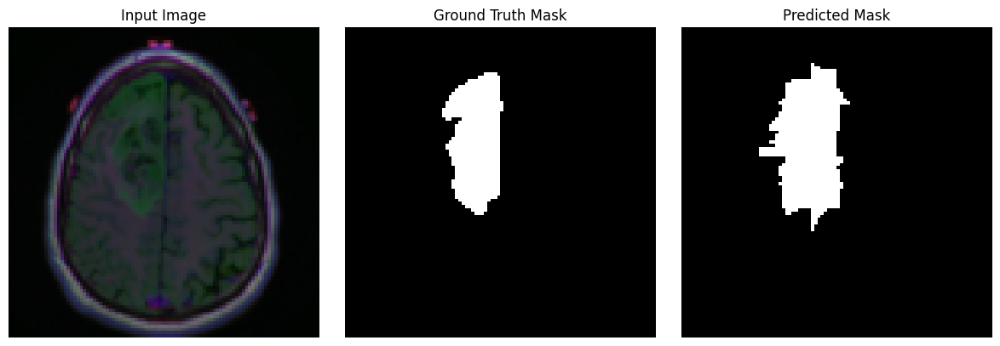

Final loss: 0.9601
Epoch 16/200 

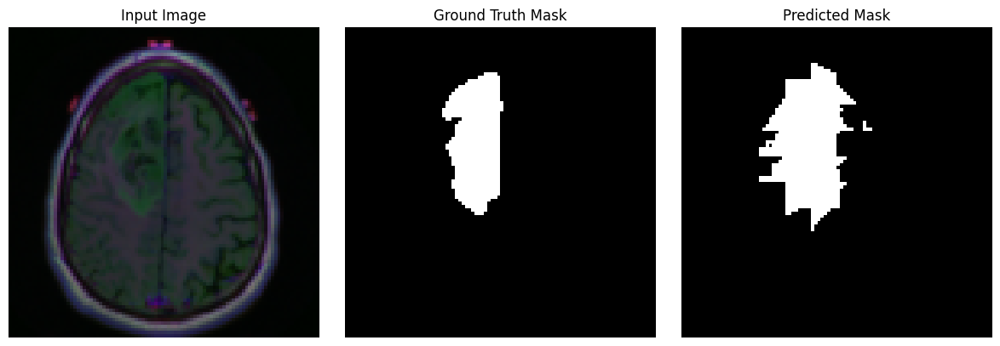

Final loss: 0.9515
Epoch 17/200 

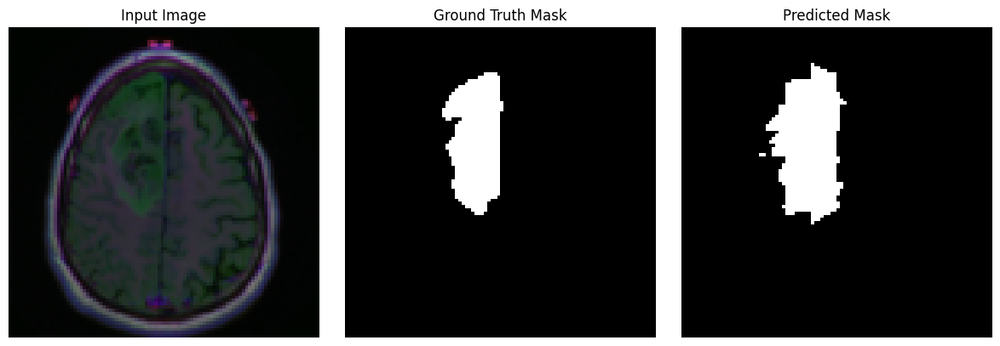

Final loss: 0.9436
Epoch 18/200 

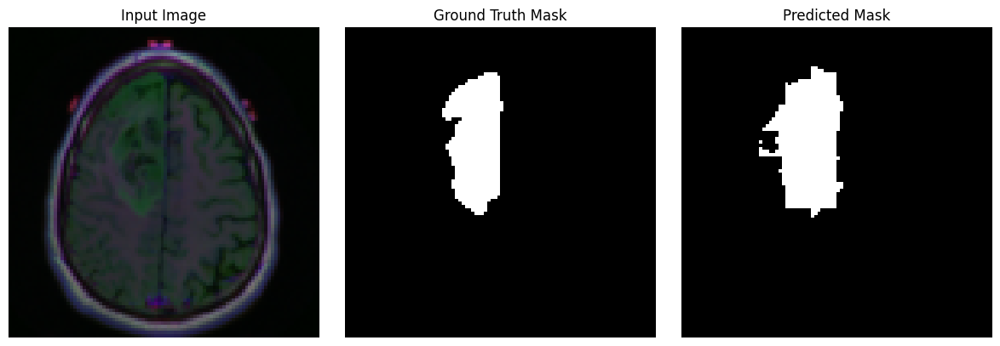

Final loss: 0.9137
Epoch 19/200 

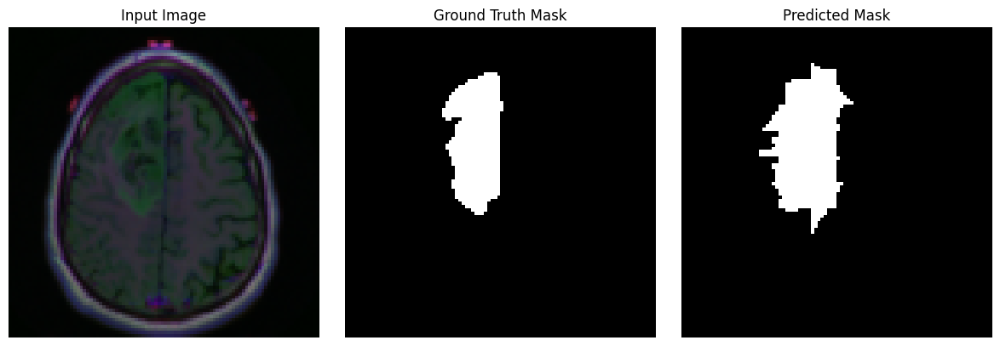

Final loss: 0.9598
Epoch 20/200 

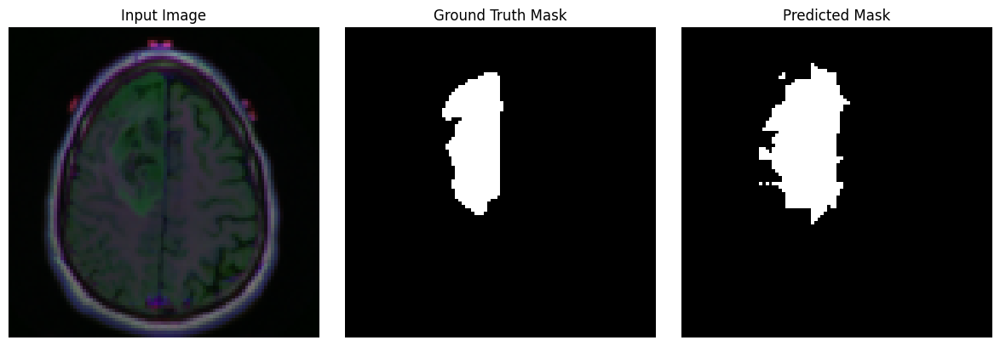

Final loss: 0.9532
Epoch 21/200 

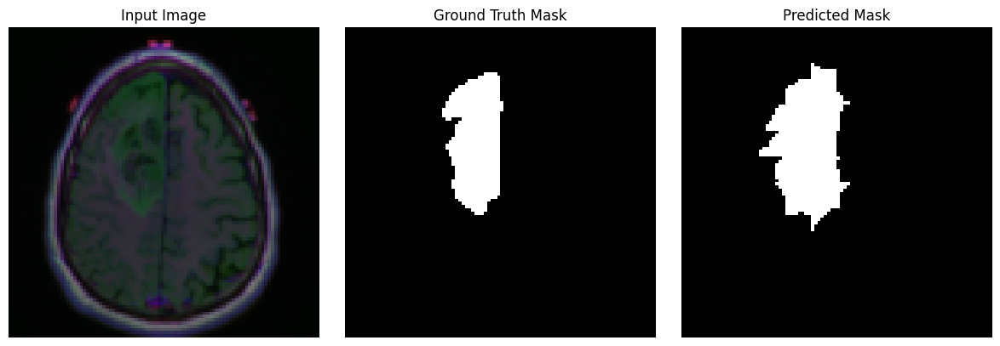

Final loss: 0.9458
Epoch 22/200 

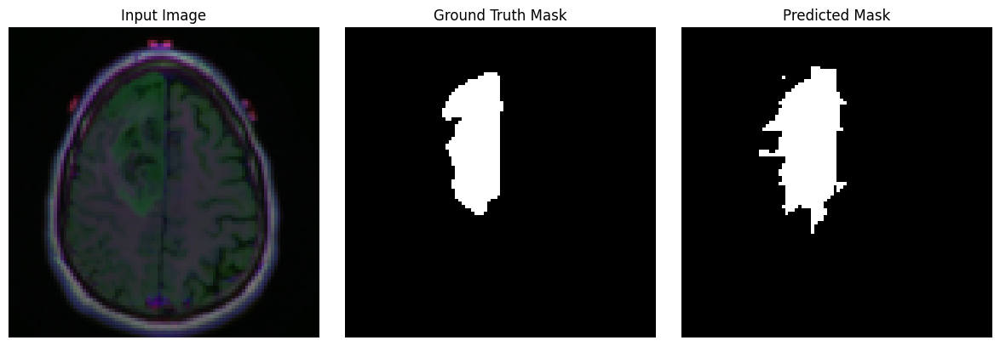

Final loss: 0.9686
Epoch 23/200 

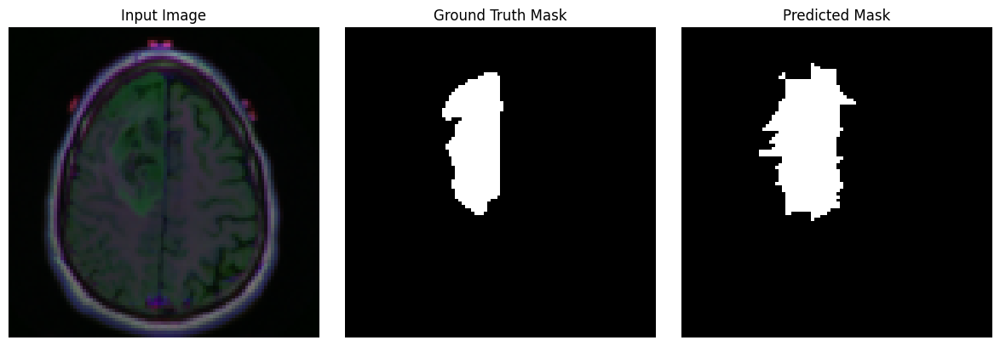

Final loss: 0.9533
Epoch 24/200 

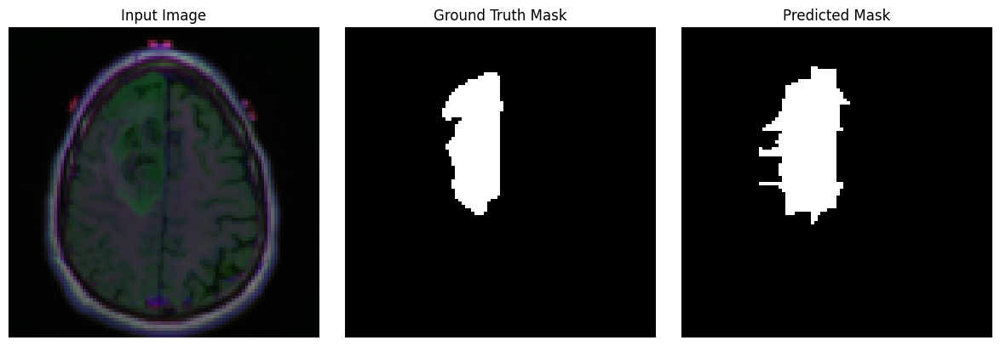

Final loss: 0.9736
Epoch 25/200 

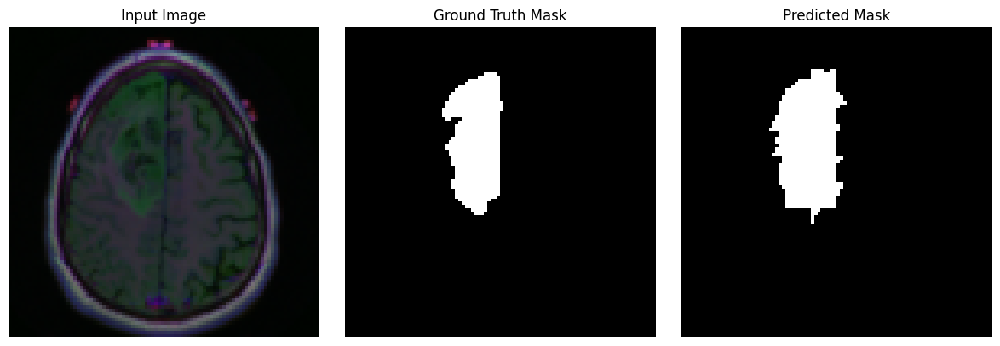

Final loss: 0.9472
Epoch 26/200 

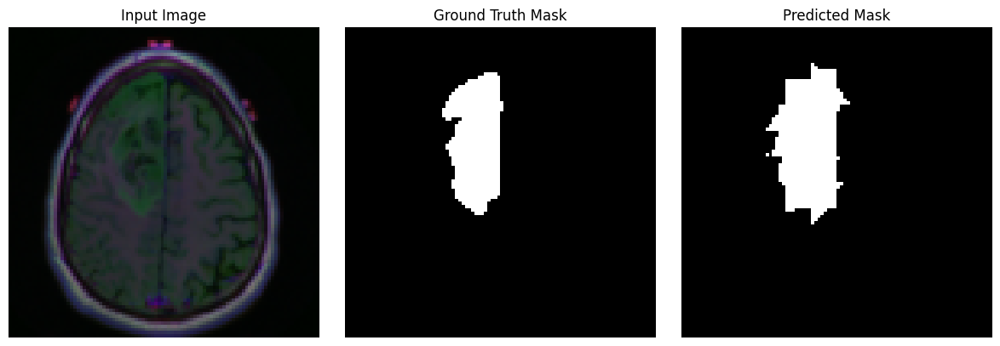

Final loss: 0.9439
Epoch 27/200 

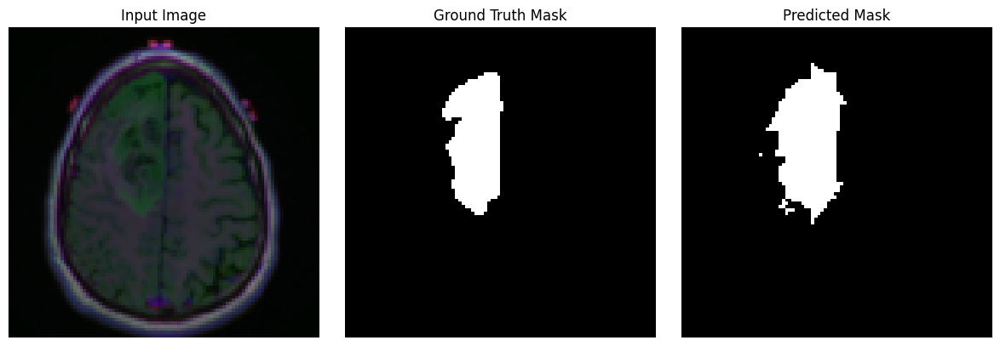

Final loss: 0.9386
Epoch 28/200 

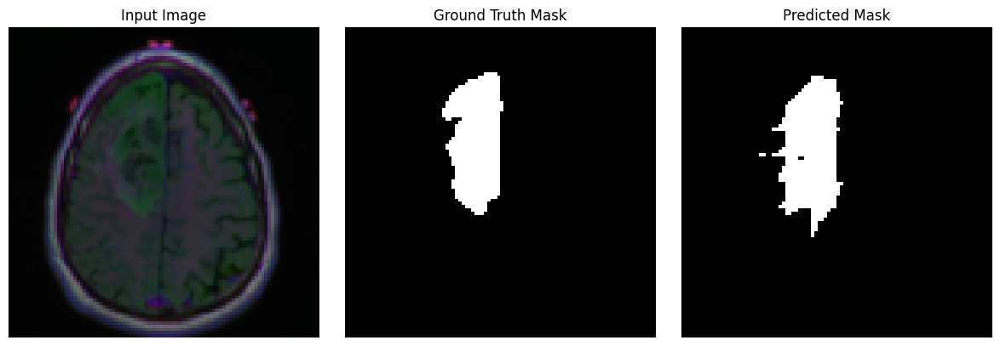

Final loss: 0.9733
Epoch 29/200 

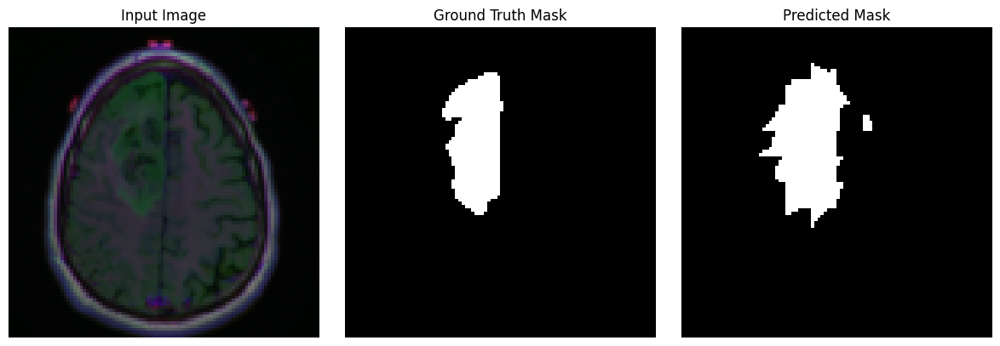

Final loss: 0.9460
Epoch 30/200 

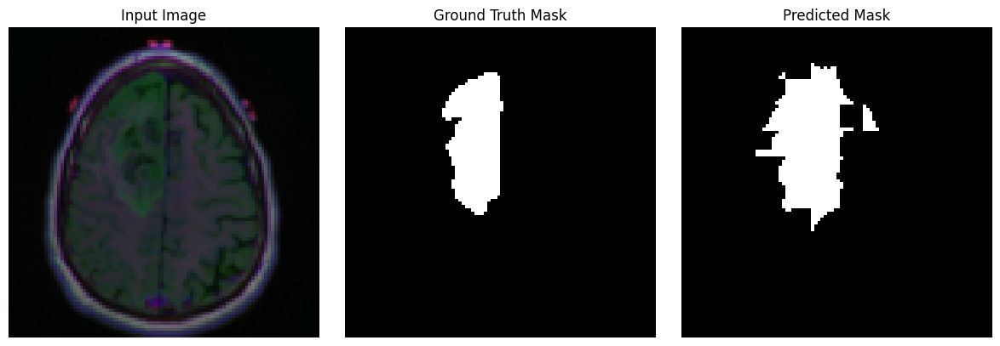

Final loss: 0.9480
Epoch 31/200 

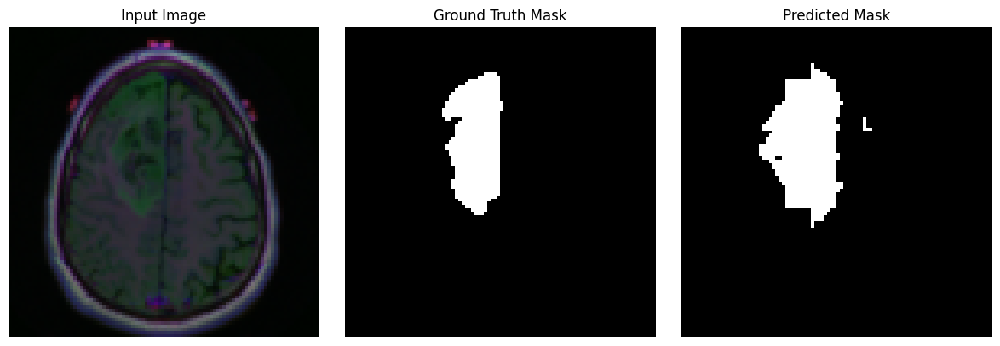

Final loss: 0.9442
Epoch 32/200 

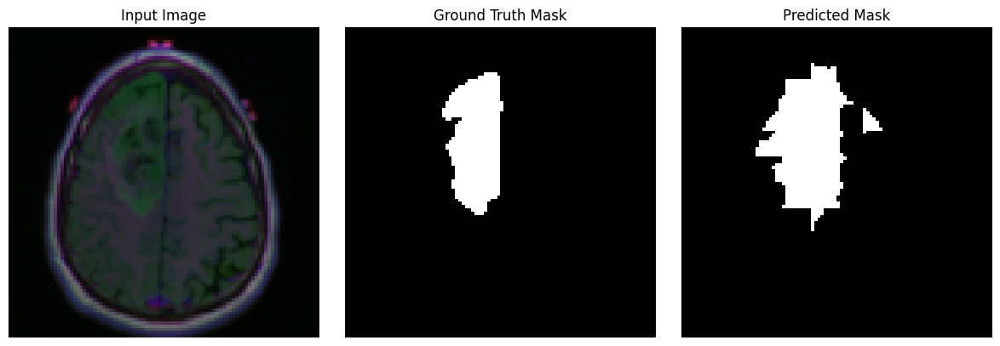

Final loss: 0.9238
Epoch 33/200 

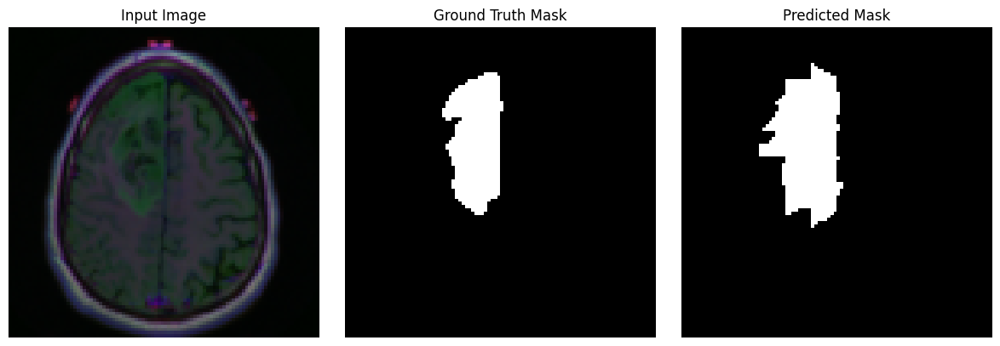

Final loss: 0.9595
Epoch 34/200 

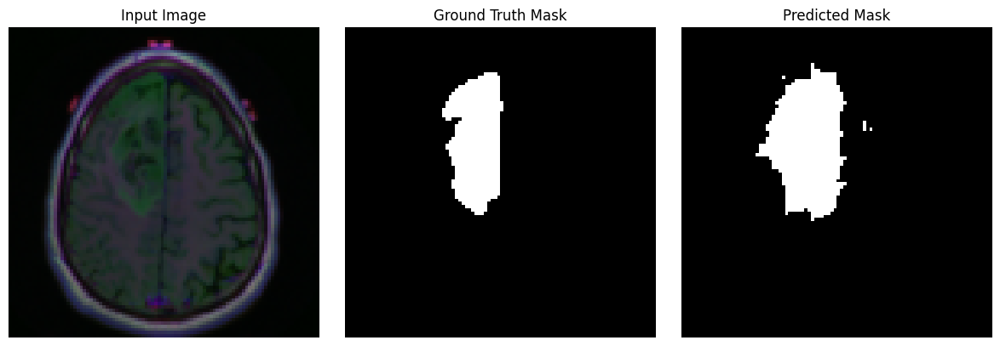

Final loss: 0.9496
Epoch 35/200 

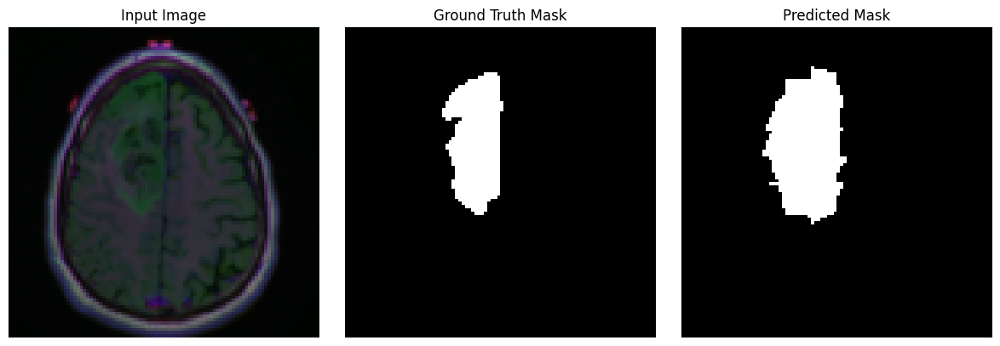

Final loss: 0.9617
Epoch 36/200 

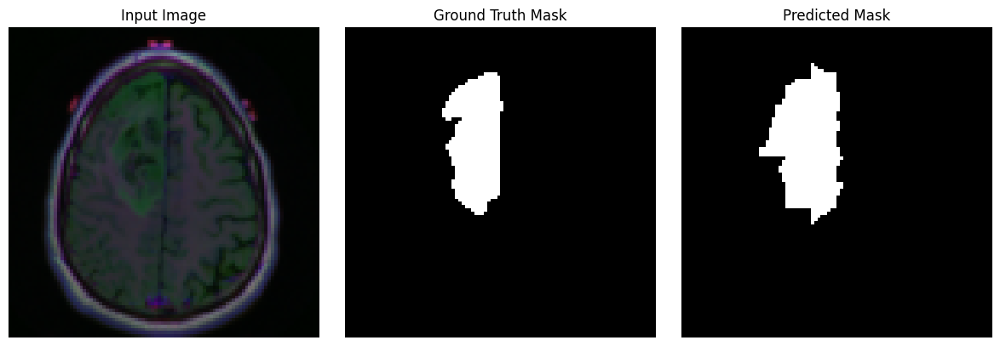

Final loss: 0.9492
Epoch 37/200 

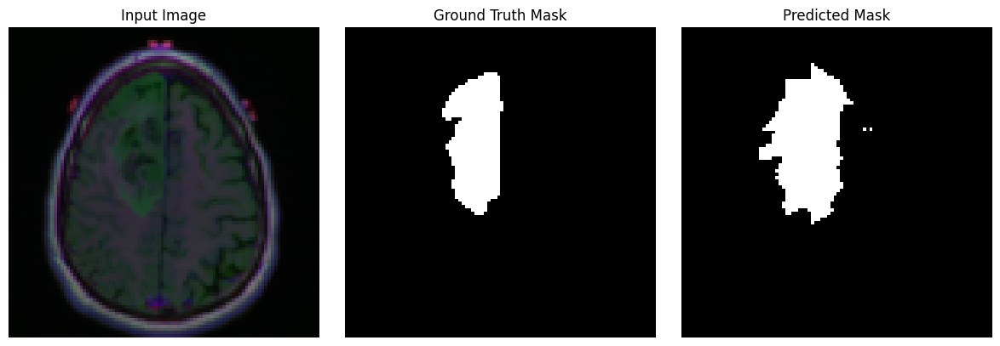

Final loss: 0.9856
Epoch 38/200 

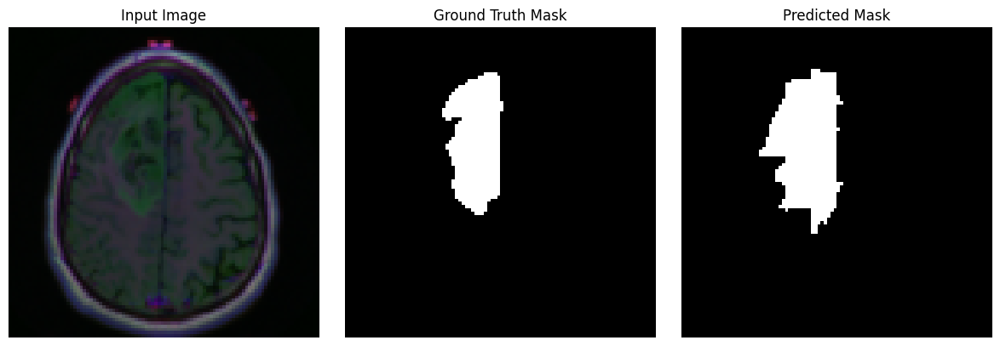

Final loss: 0.9490
Epoch 39/200 

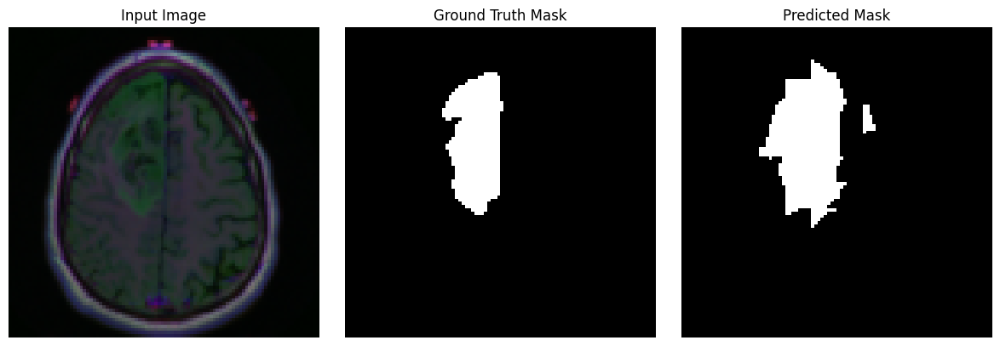

Final loss: 0.9322
Epoch 40/200 

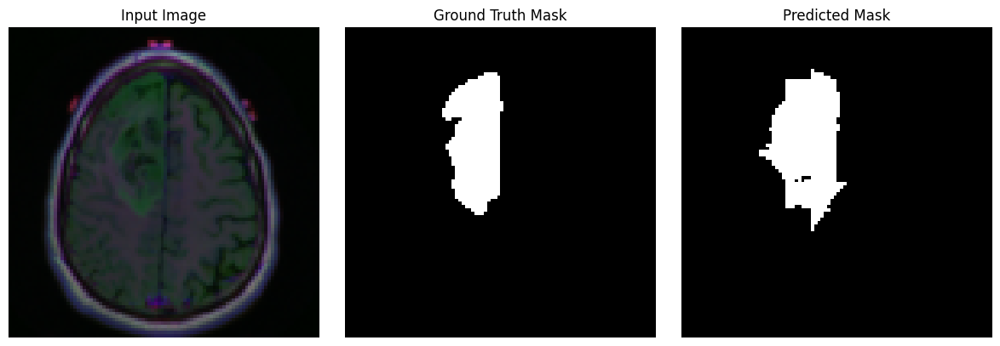

Final loss: 0.9470
Epoch 41/200 

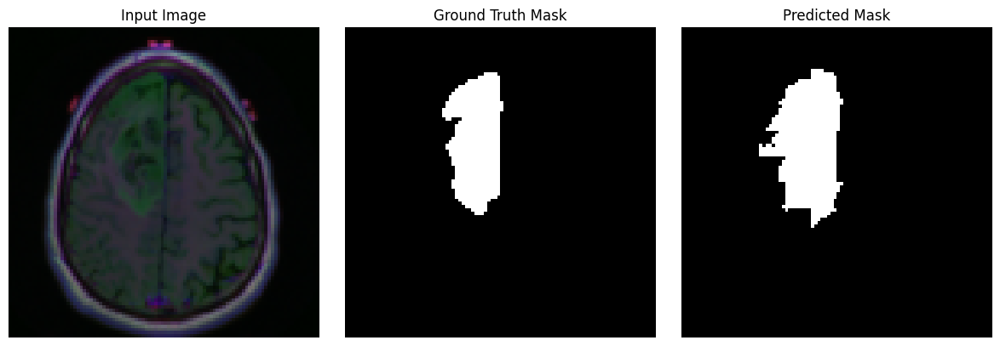

Final loss: 0.9627
Epoch 42/200 

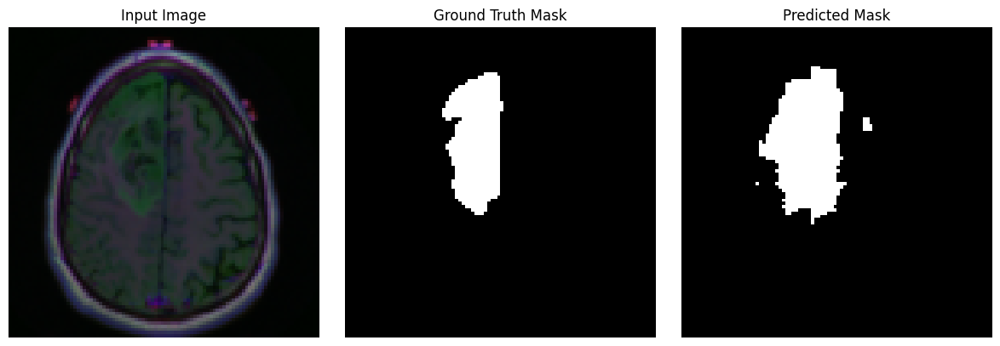

Final loss: 0.9479
Epoch 43/200 

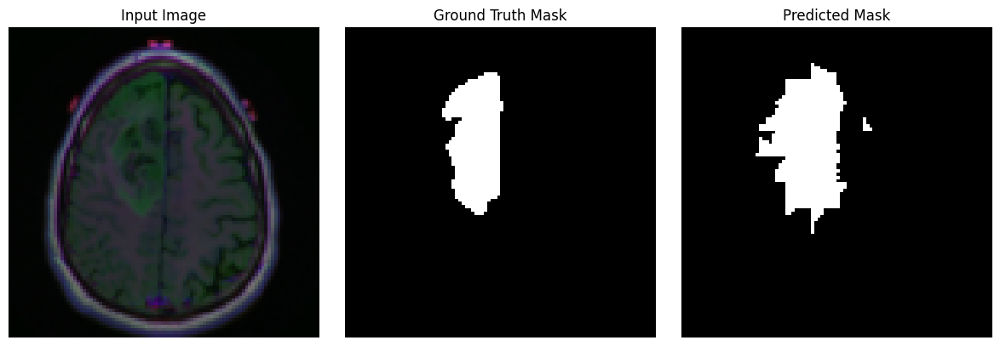

Final loss: 0.9527
Epoch 44/200 

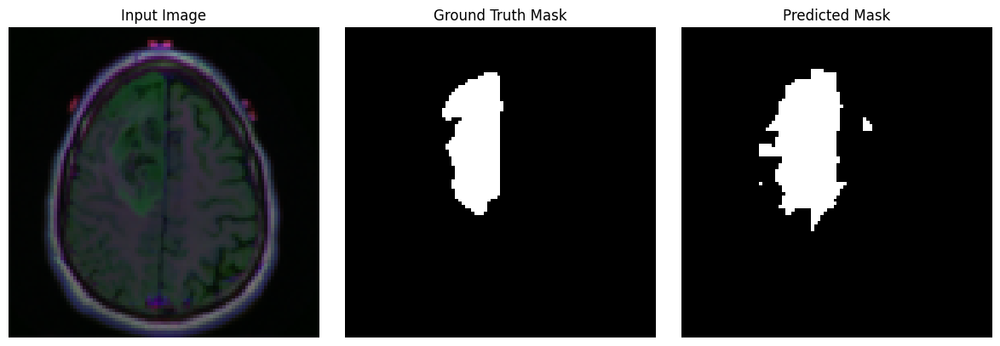

Final loss: 0.9518
Epoch 45/200 

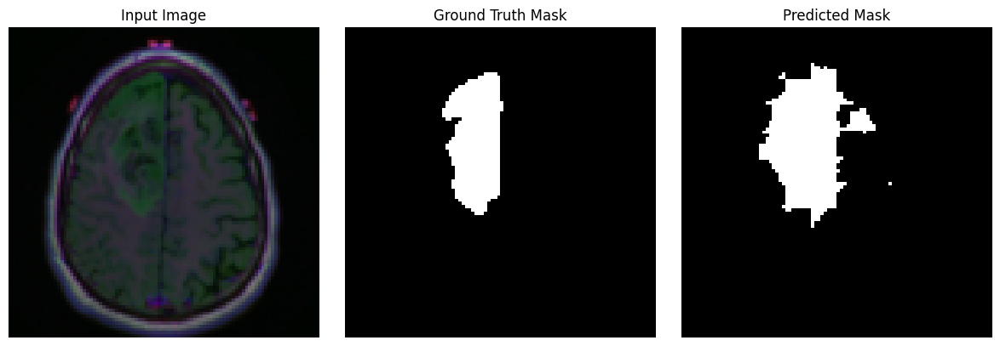

Final loss: 0.9752
Epoch 46/200 

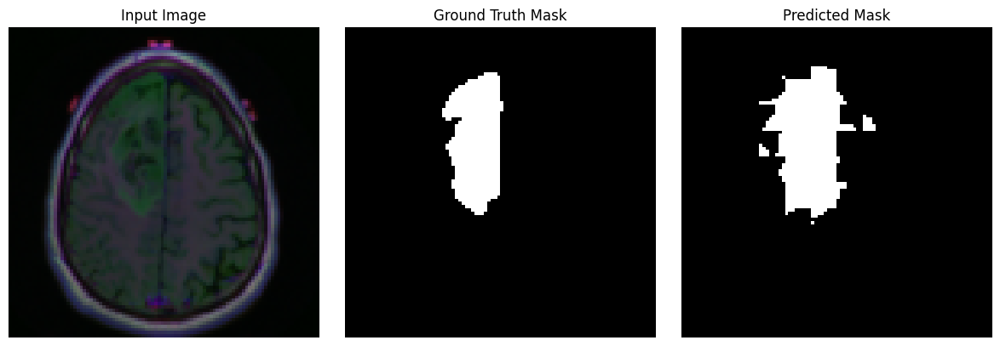

Final loss: 0.9589
Epoch 47/200 

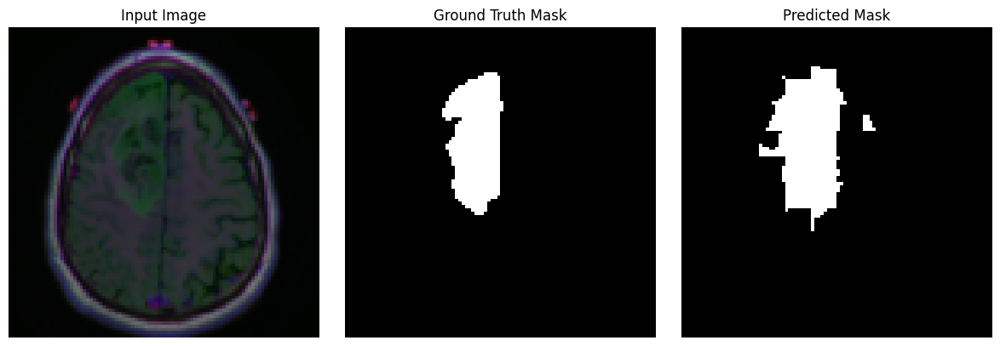

Final loss: 0.9577
Epoch 48/200 

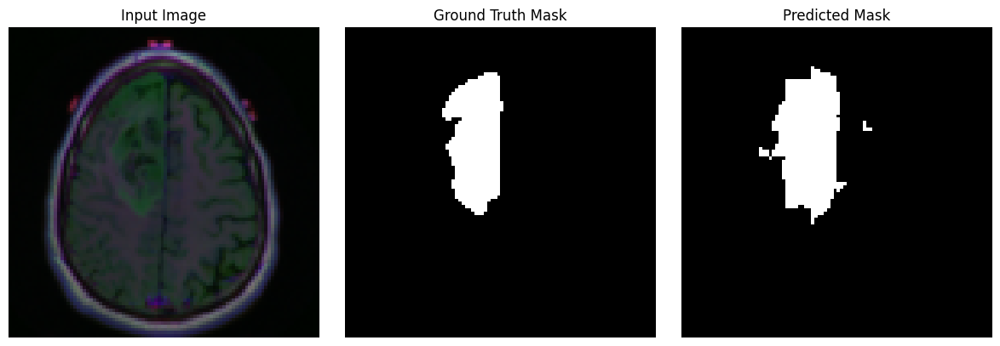

Final loss: 0.9560
Epoch 49/200 

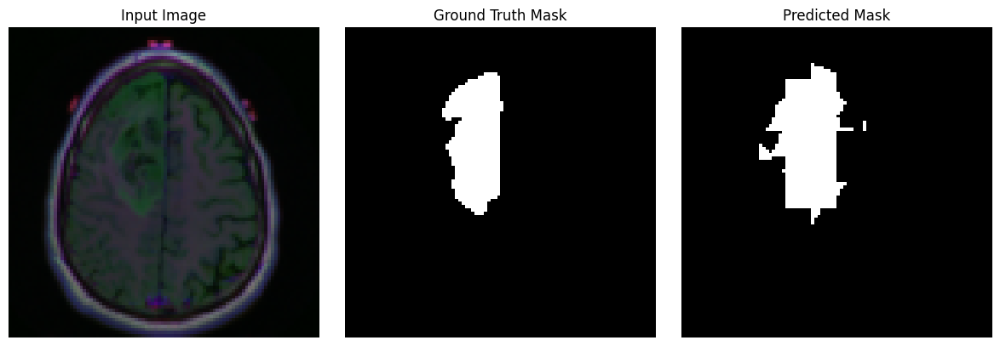

Final loss: 0.9537
Epoch 50/200 

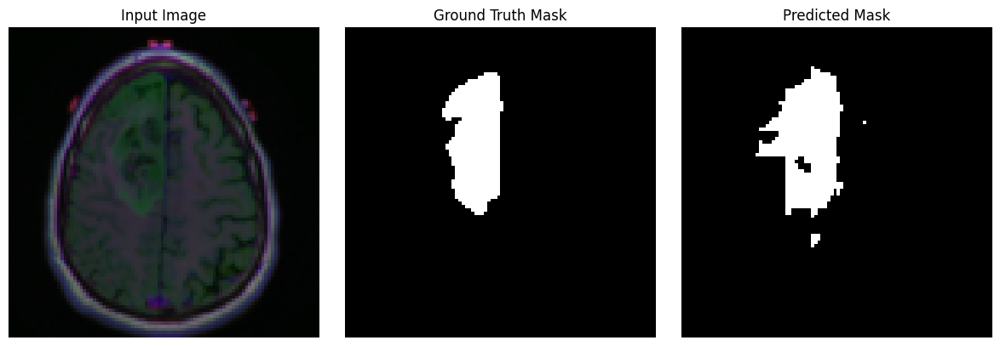

Final loss: 0.9456
Epoch 51/200 

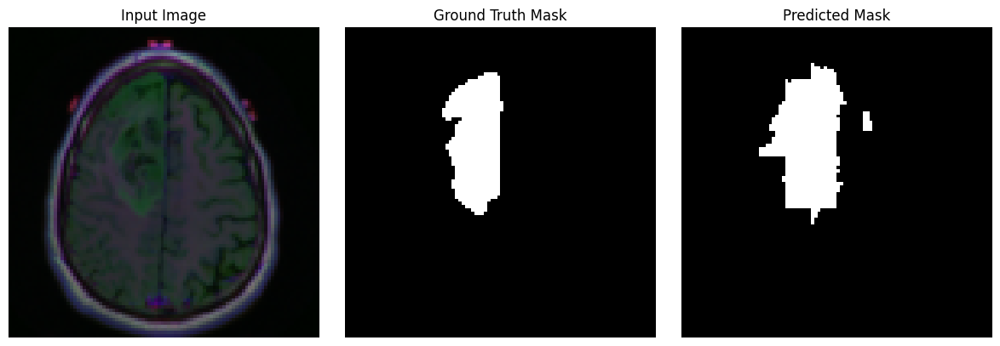

Final loss: 0.9451
Epoch 52/200 

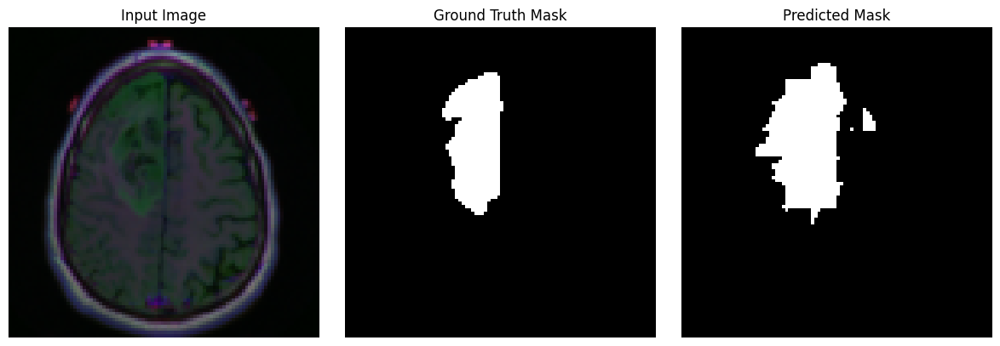

Final loss: 0.9327
Epoch 53/200 

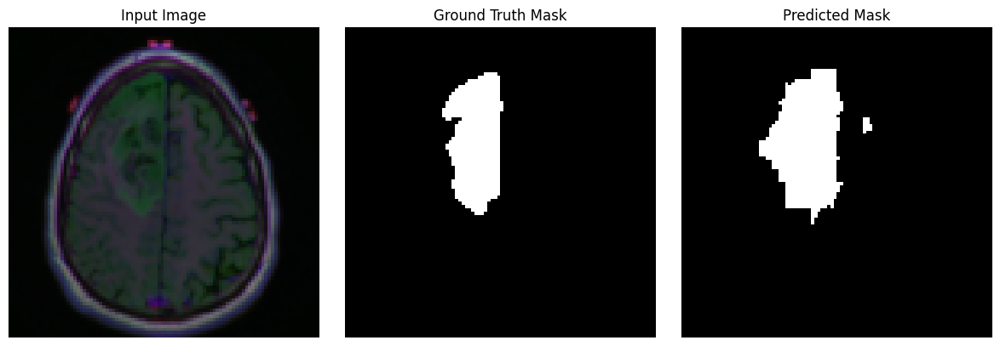

Final loss: 0.9101
Epoch 54/200 

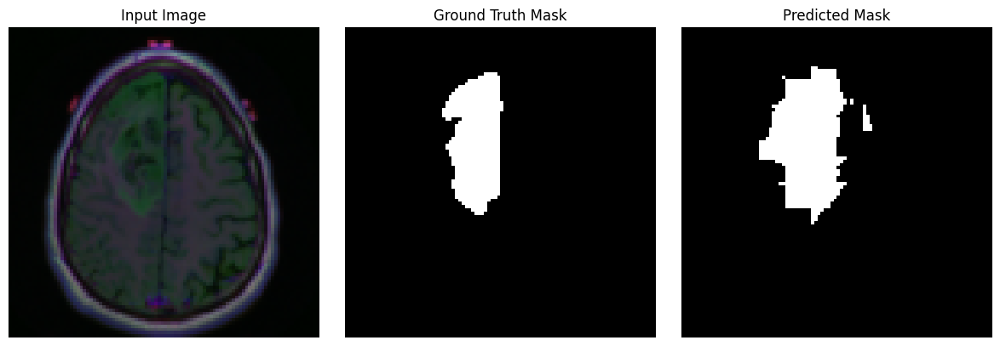

Final loss: 0.9655
Epoch 55/200 

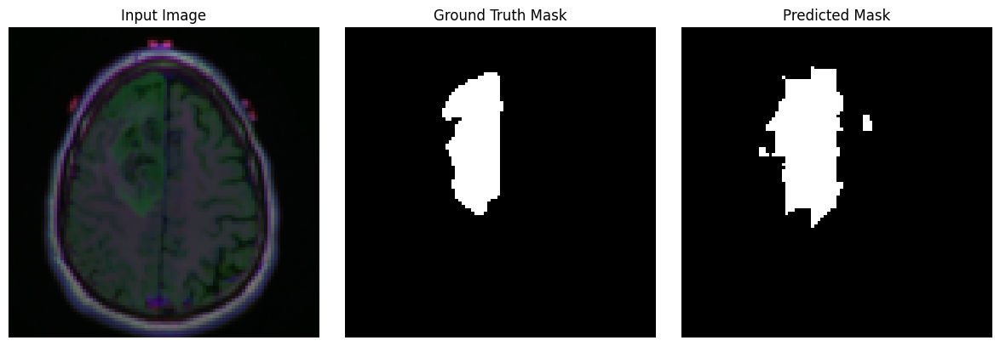

Final loss: 0.9424
Epoch 56/200 

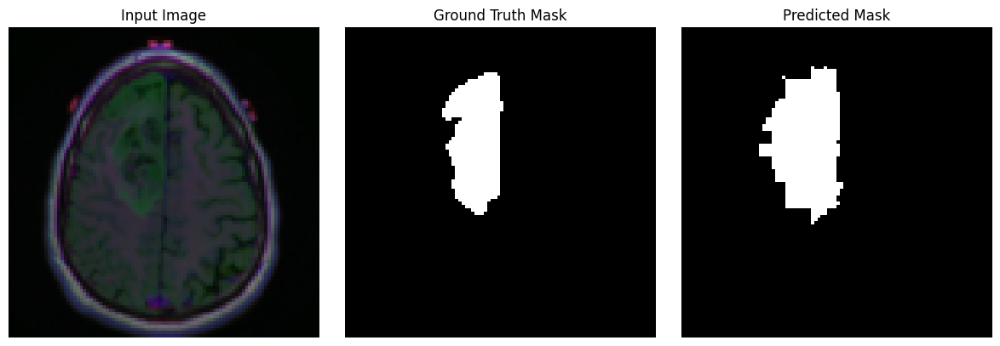

Final loss: 0.9644
Epoch 57/200 

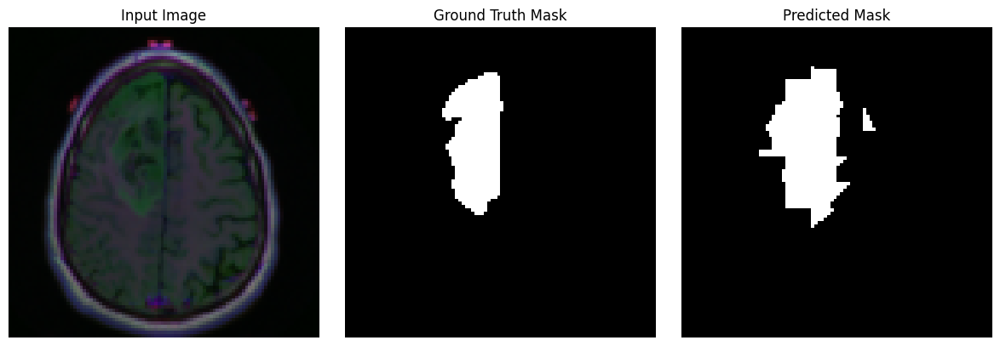

Final loss: 0.9378
Epoch 58/200 

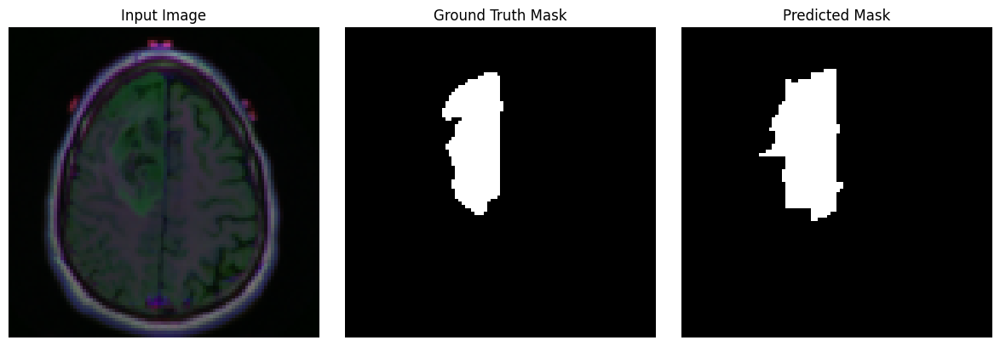

Final loss: 0.9394
Epoch 59/200 

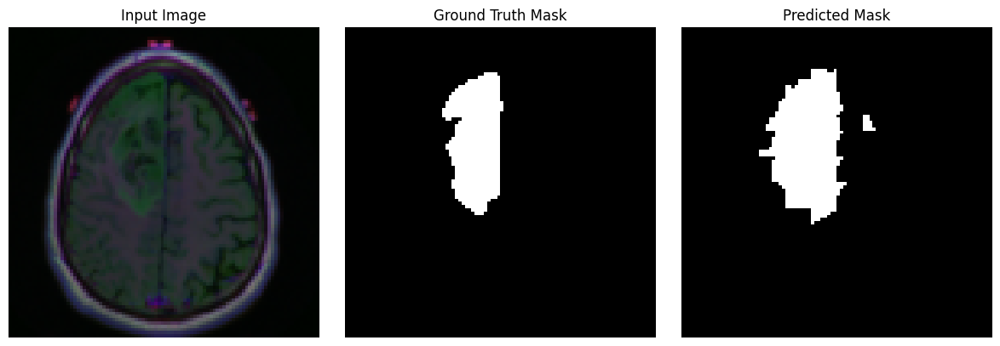

Final loss: 0.9436
Epoch 60/200 

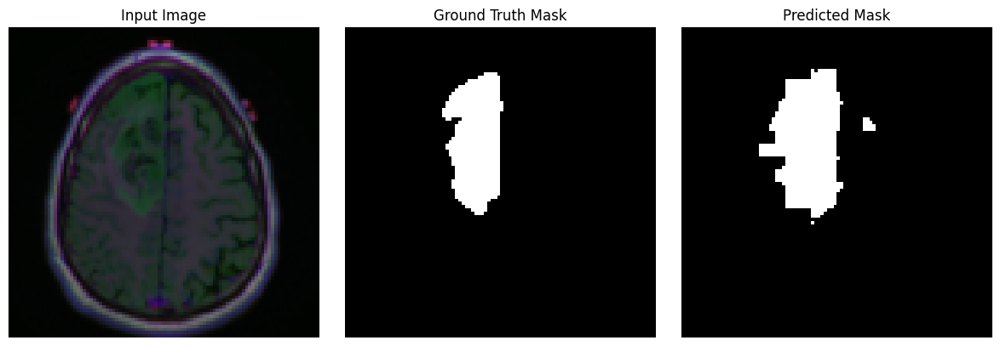

Final loss: 0.9554
Epoch 61/200 

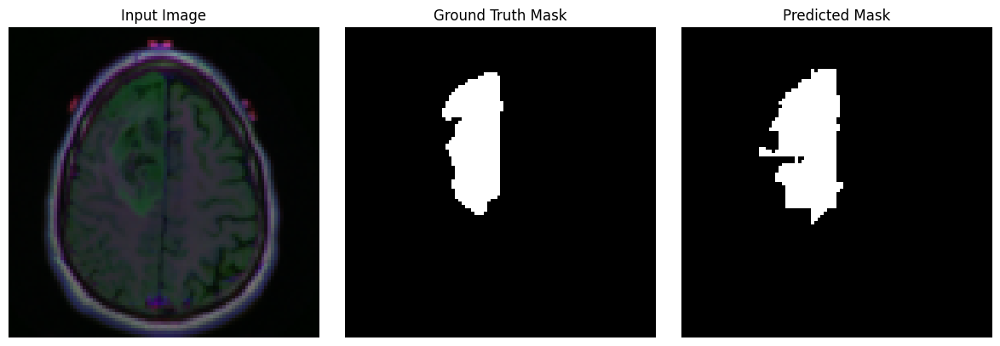

Final loss: 0.9614
Epoch 62/200 

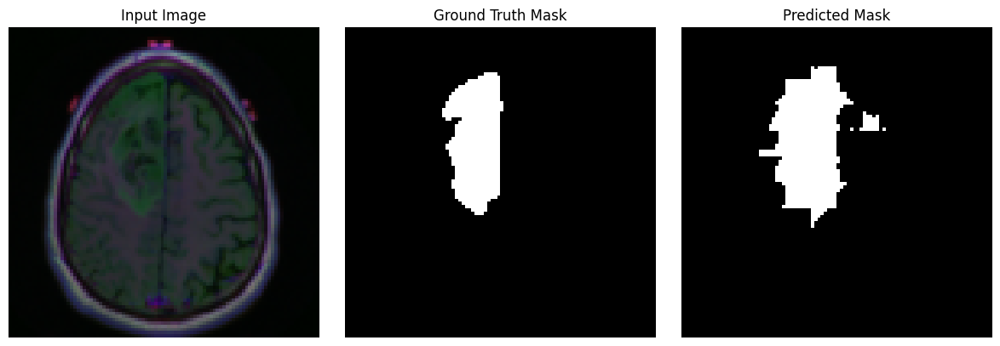

Final loss: 0.9282
Epoch 63/200 

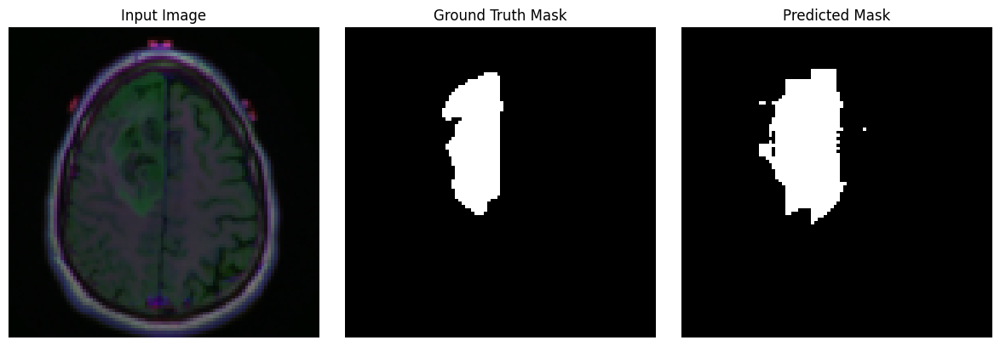

Final loss: 0.9707
Epoch 64/200 

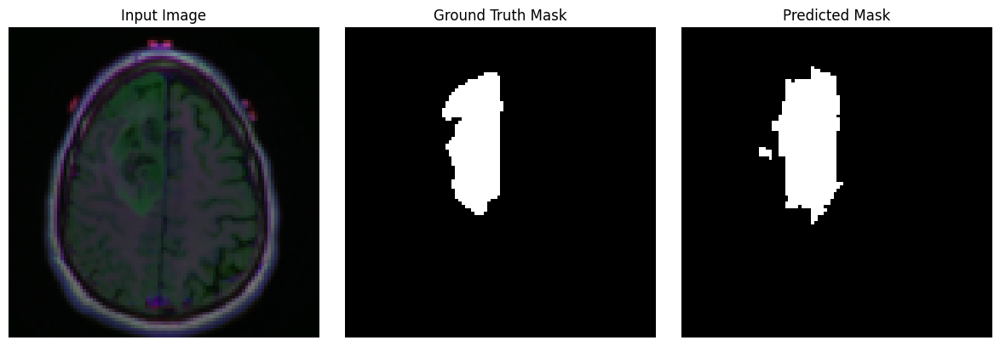

Final loss: 0.9494
Epoch 65/200 

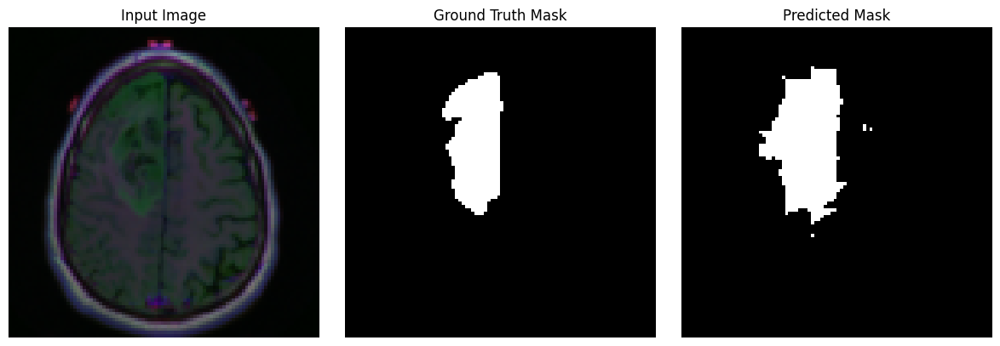

Final loss: 0.9328
Epoch 66/200 

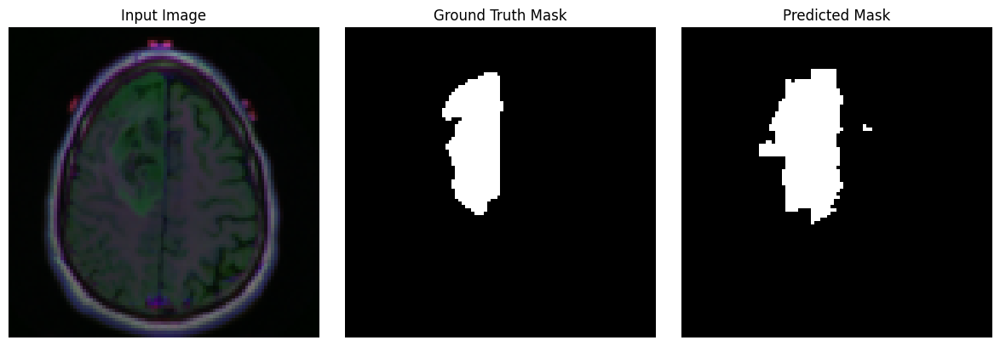

Final loss: 0.9738
Epoch 67/200 

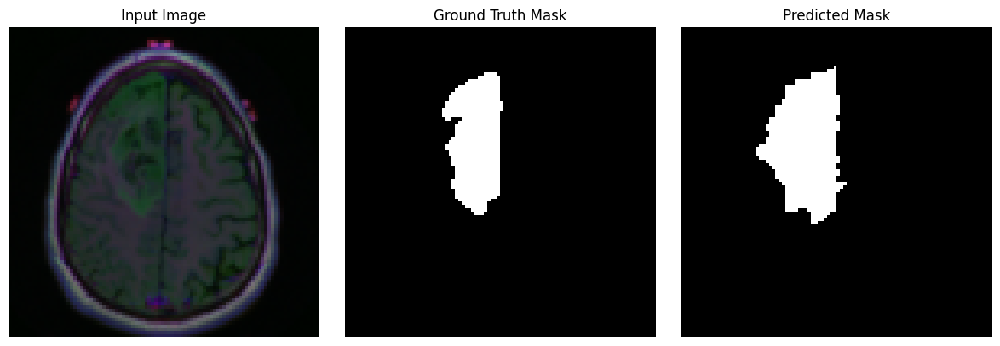

Final loss: 0.9490
Epoch 68/200 

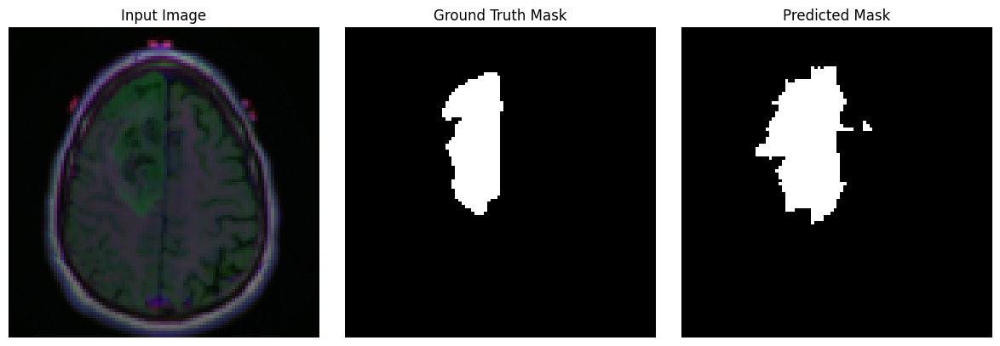

Final loss: 0.9550
Epoch 69/200 

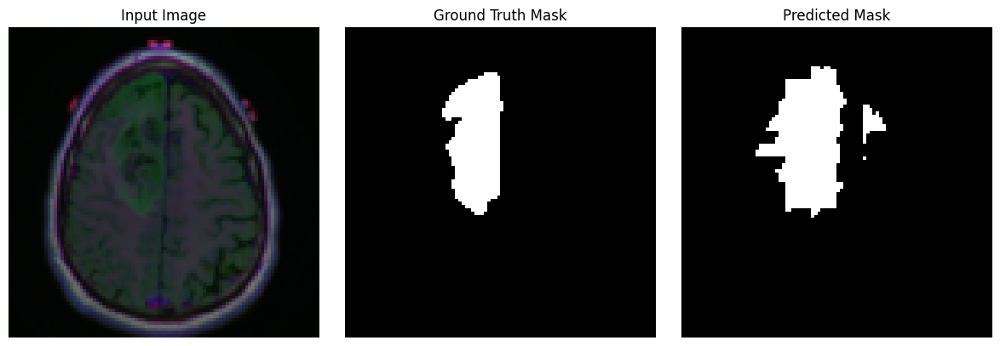

Final loss: 0.9576
Epoch 70/200 

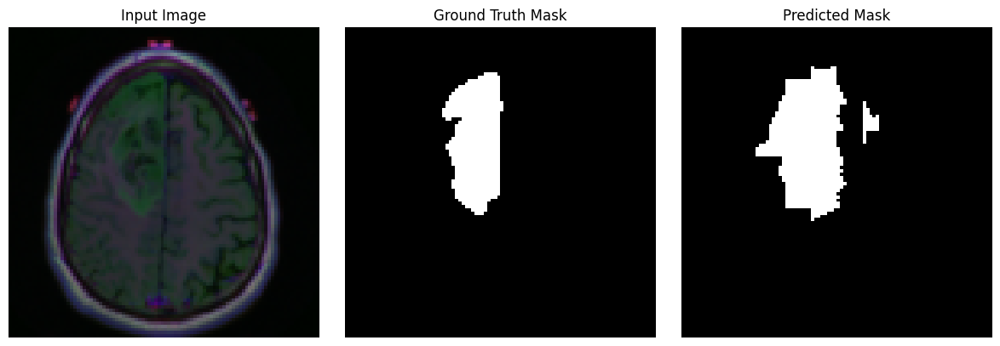

Final loss: 0.9701
Epoch 71/200 

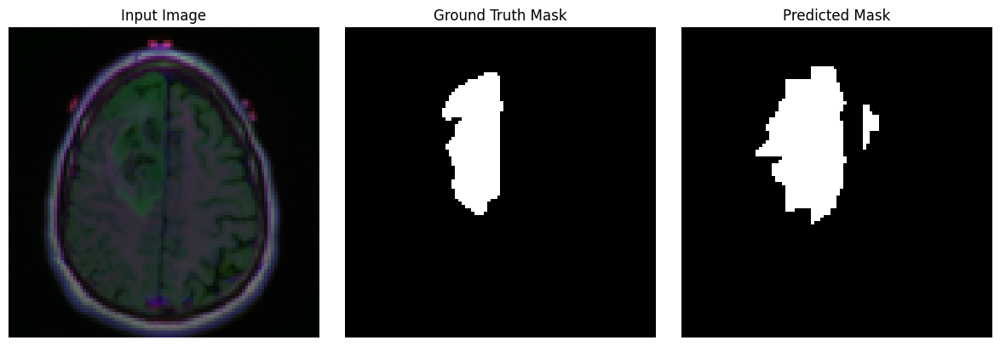

Final loss: 0.9756
Epoch 72/200 

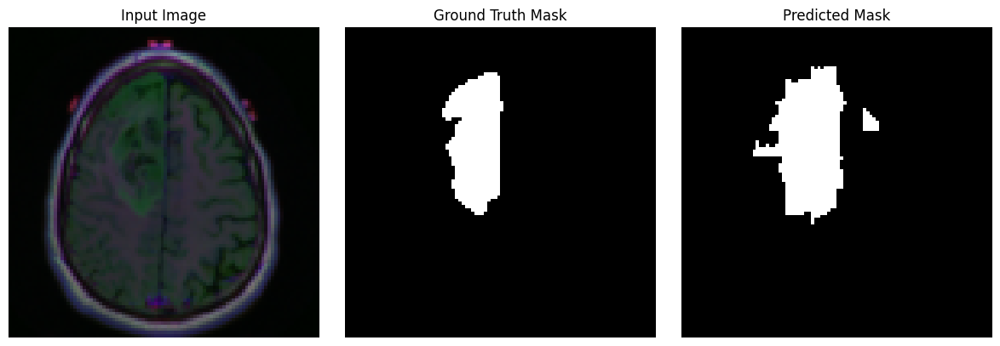

Final loss: 0.9625
Epoch 73/200 

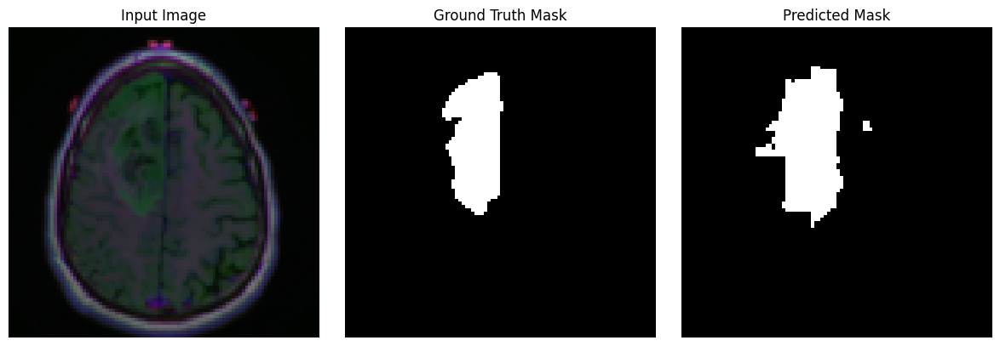

Final loss: 0.9573
Epoch 74/200 

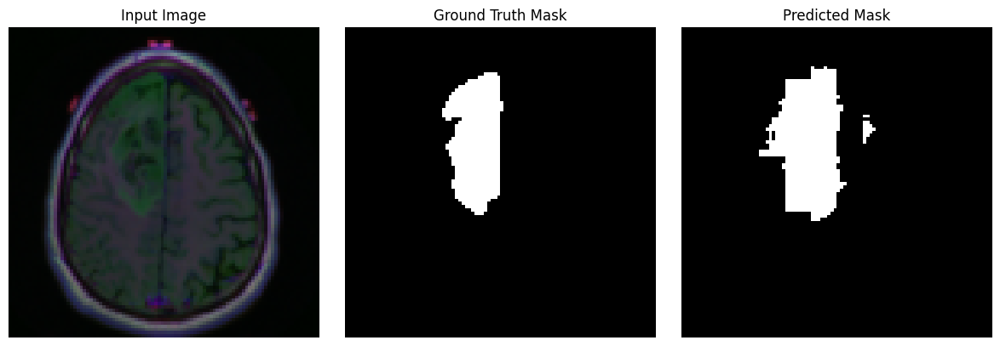

Final loss: 0.9580
Epoch 75/200 

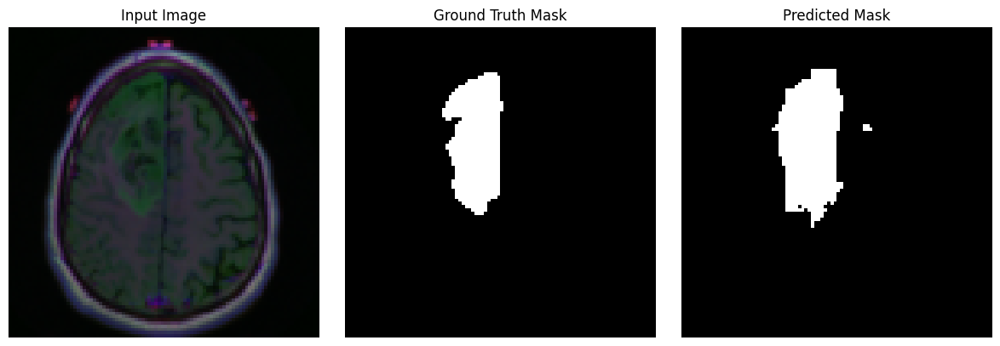

Final loss: 0.9557
Epoch 76/200 

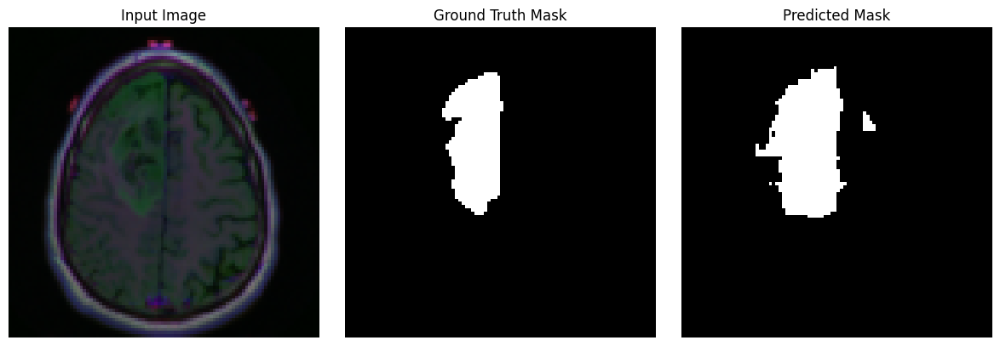

Final loss: 0.9650
Epoch 77/200 

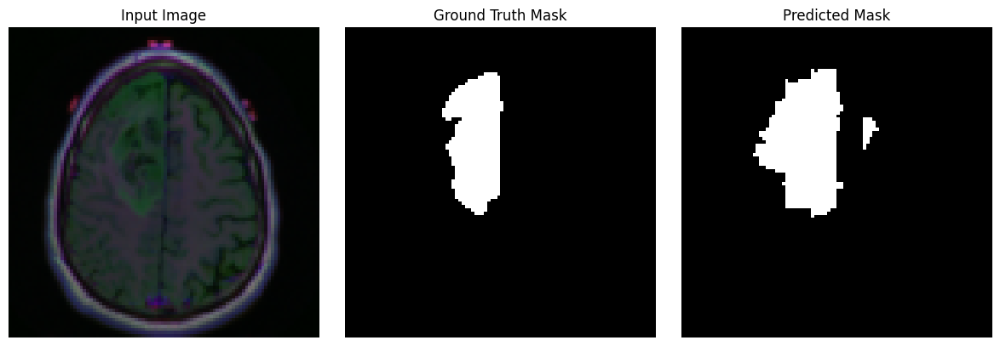

Final loss: 0.9488
Epoch 78/200 

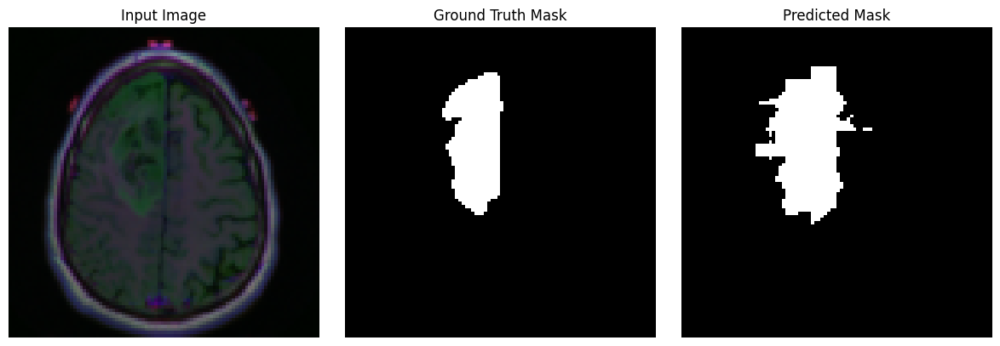

Final loss: 0.9494
Epoch 79/200 

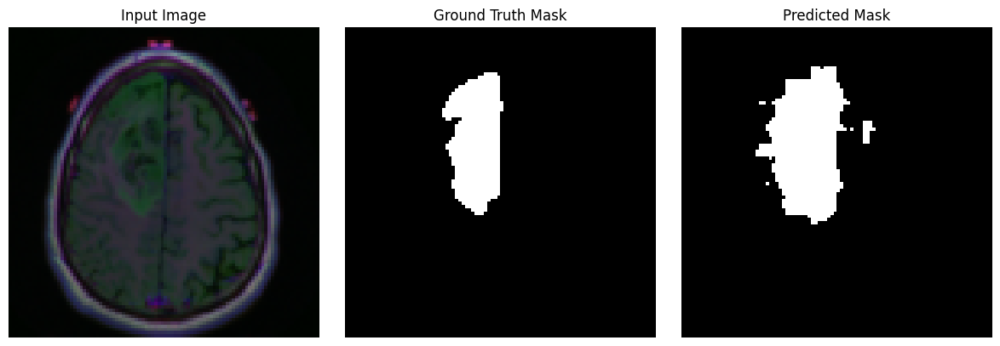

Final loss: 0.9671
Epoch 80/200 

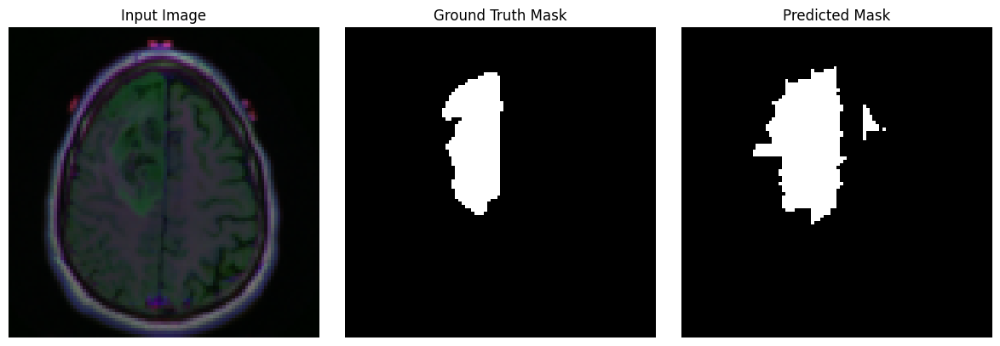

Final loss: 0.9484
Epoch 81/200 

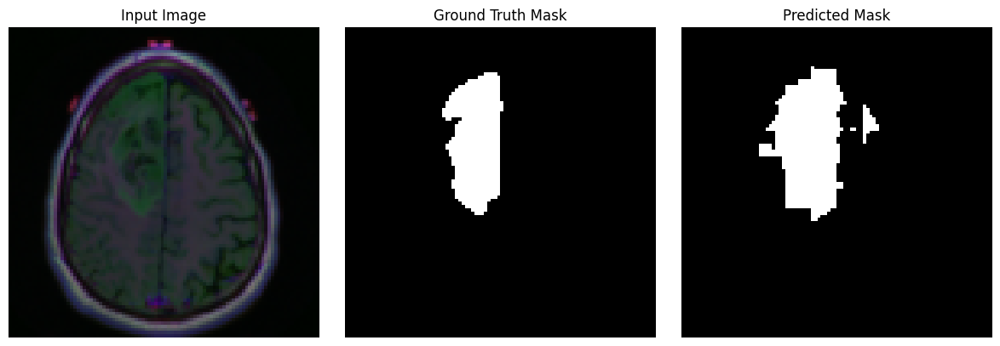

Final loss: 0.9637
Epoch 82/200 

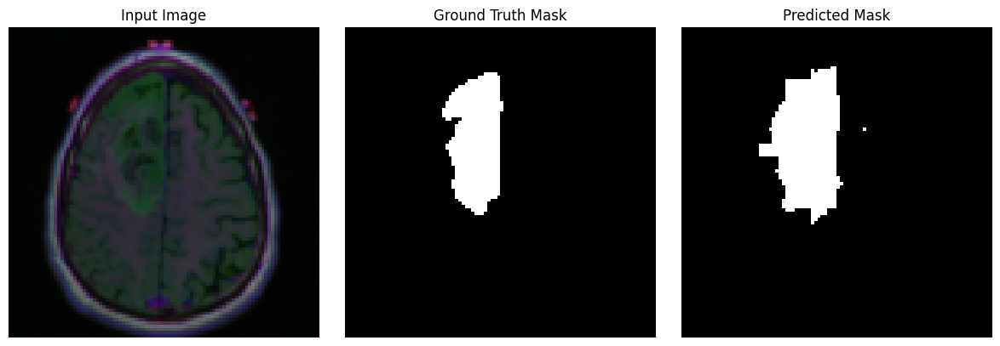

Final loss: 0.9374
Epoch 83/200 

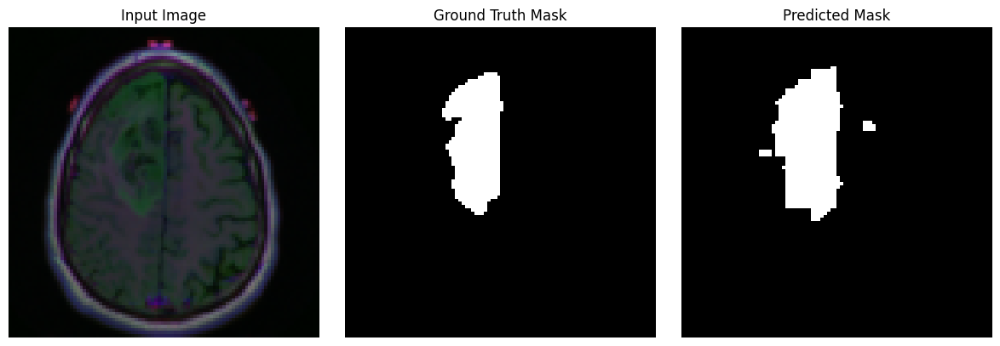

Final loss: 0.9403
Epoch 84/200 

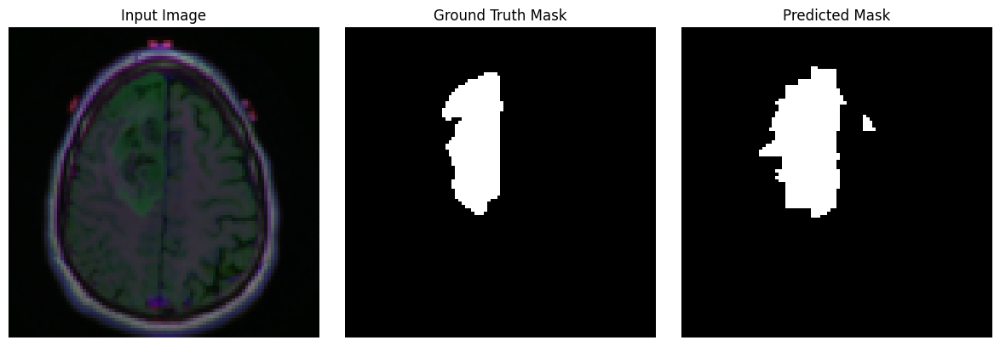

Final loss: 0.9652
Epoch 85/200 

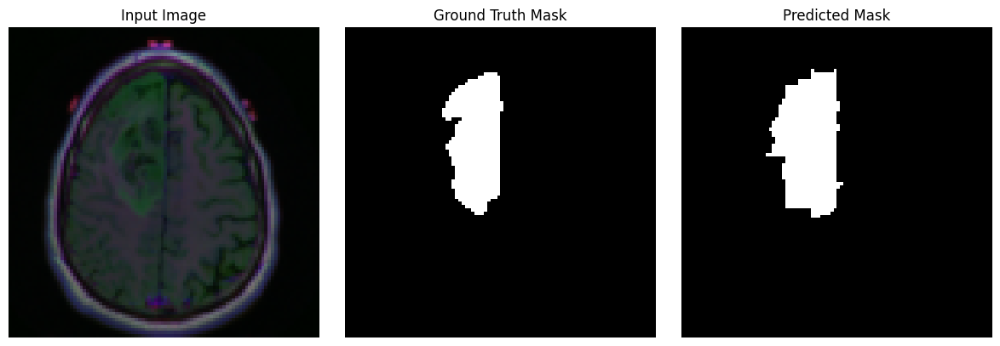

Final loss: 0.9742
Epoch 86/200 

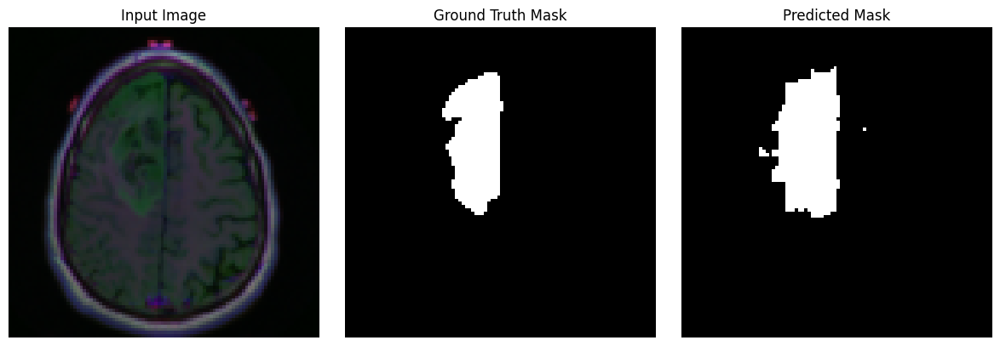

Final loss: 0.9525
Epoch 87/200 

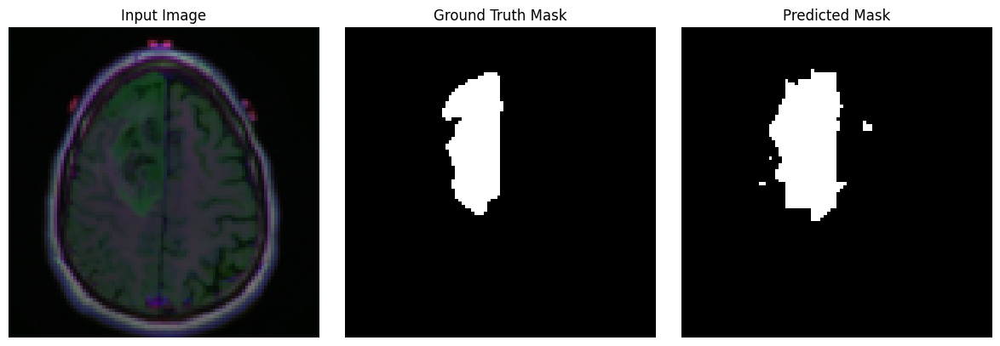

Final loss: 0.9449
Epoch 88/200 

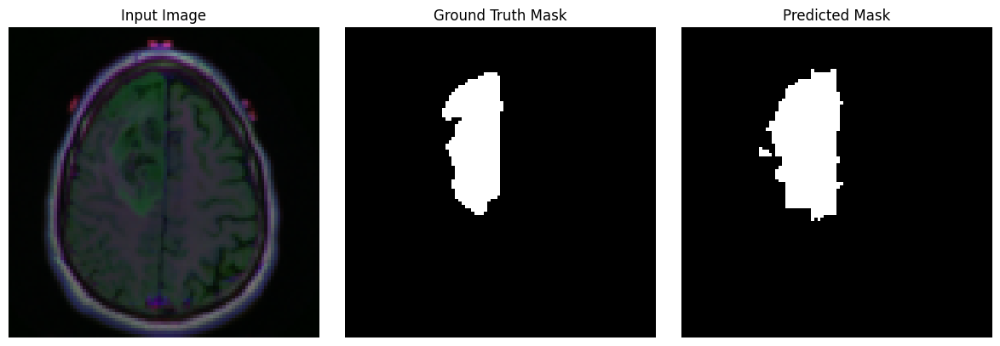

Final loss: 0.9583
Epoch 89/200 

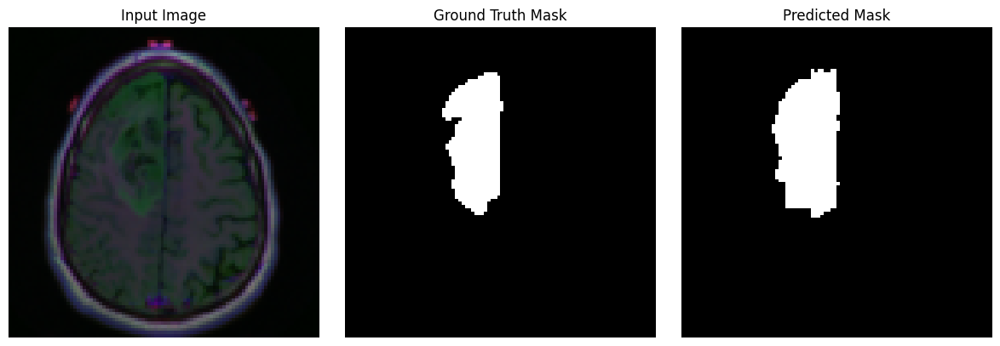

Final loss: 0.9496
Epoch 90/200 

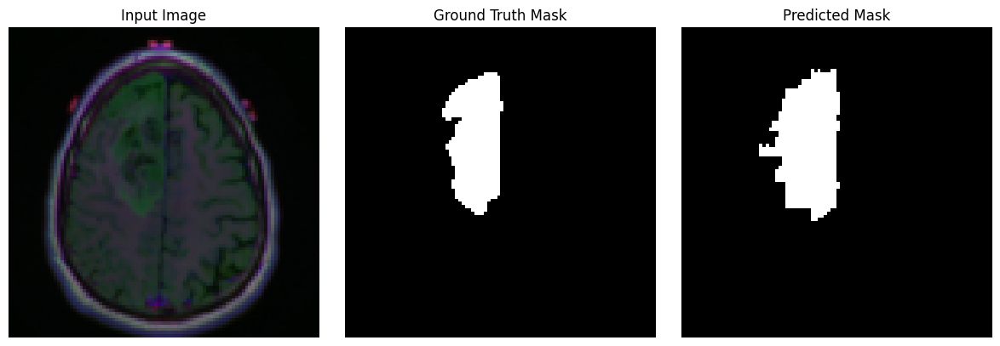

Final loss: 0.9372
Epoch 91/200 

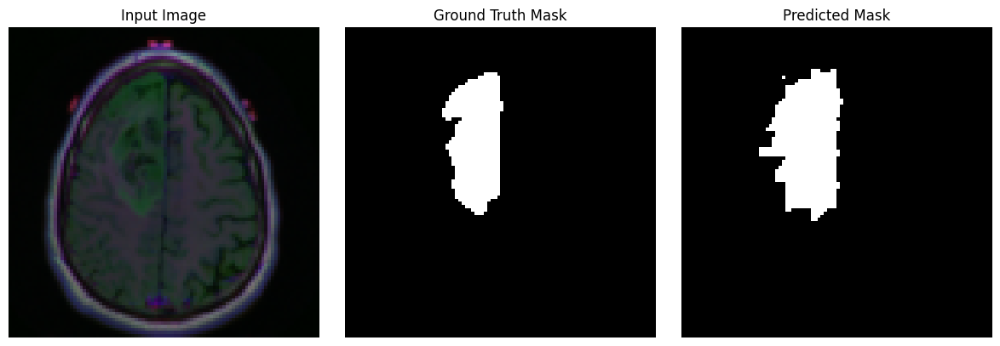

Final loss: 0.9661
Epoch 92/200 

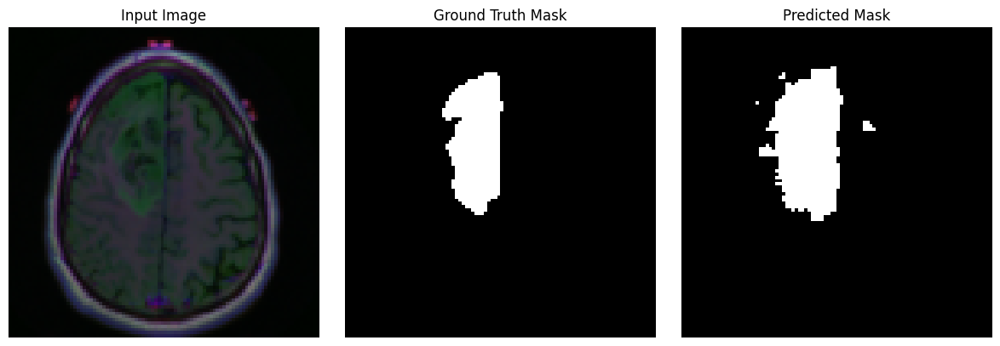

Final loss: 0.9427
Epoch 93/200 

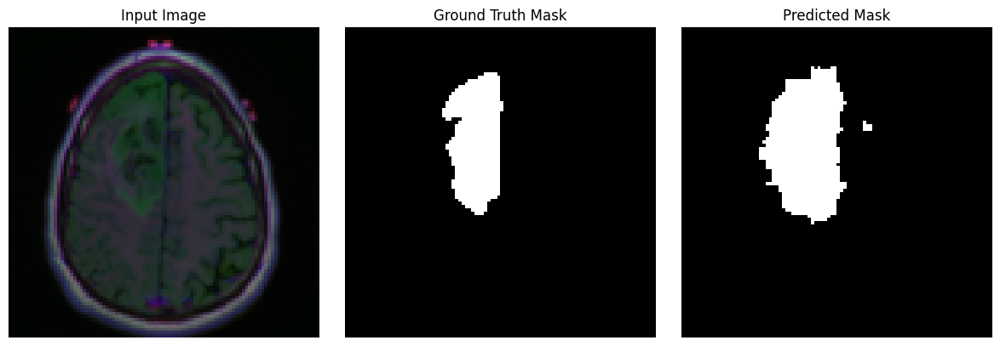

Final loss: 0.9518
Epoch 94/200 

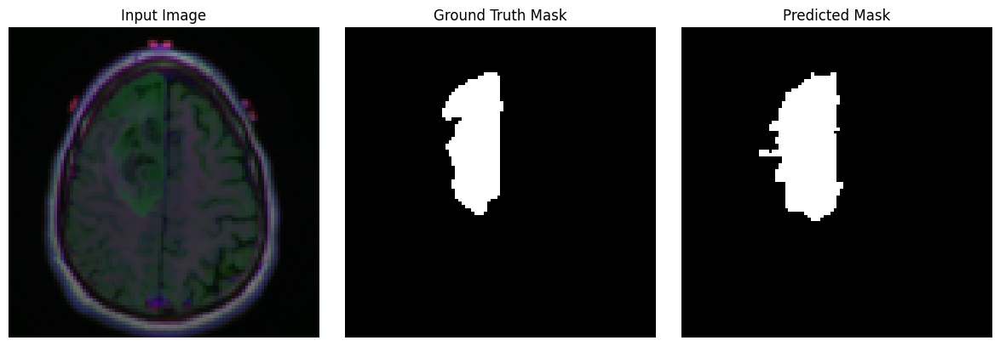

Final loss: 0.9577
Epoch 95/200 

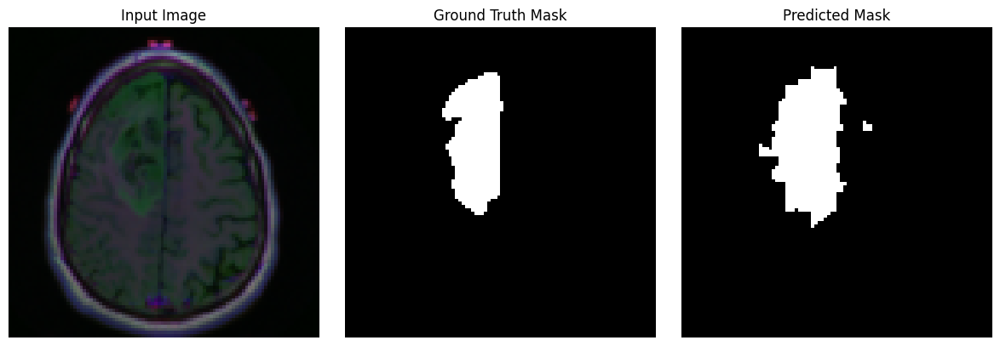

Final loss: 0.9739
Epoch 96/200 

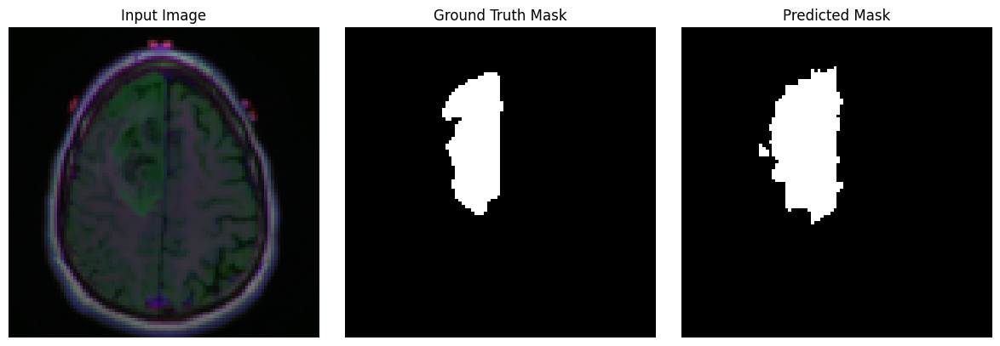

Final loss: 0.9585
Epoch 97/200 

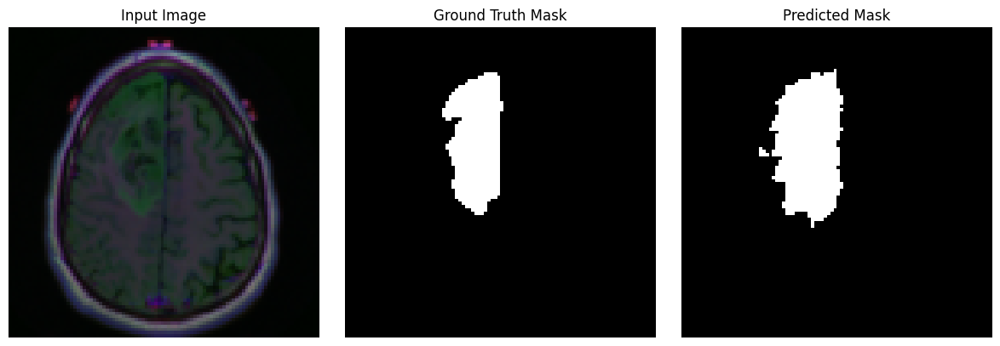

Final loss: 0.9630
Epoch 98/200 

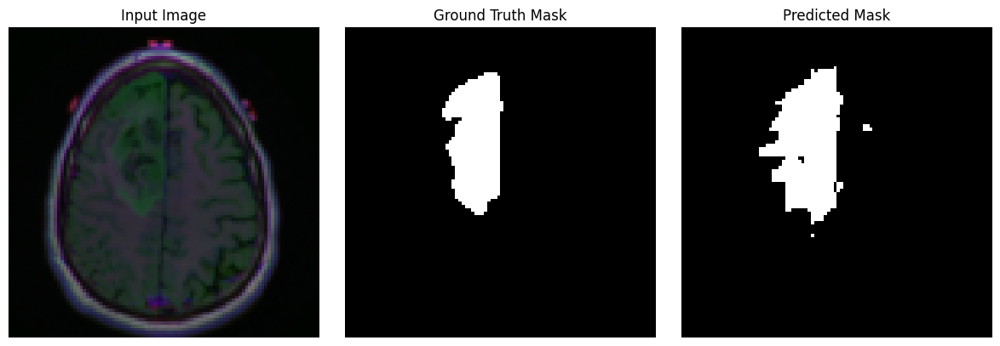

Final loss: 0.9917
Epoch 99/200 

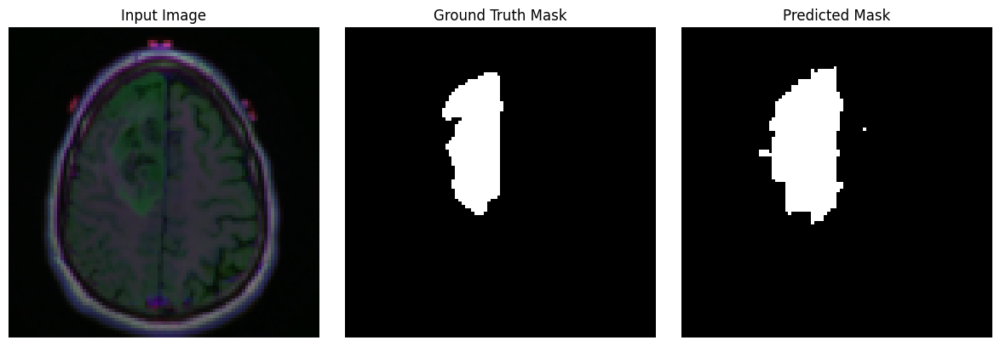

Final loss: 0.9463
Epoch 100/200 

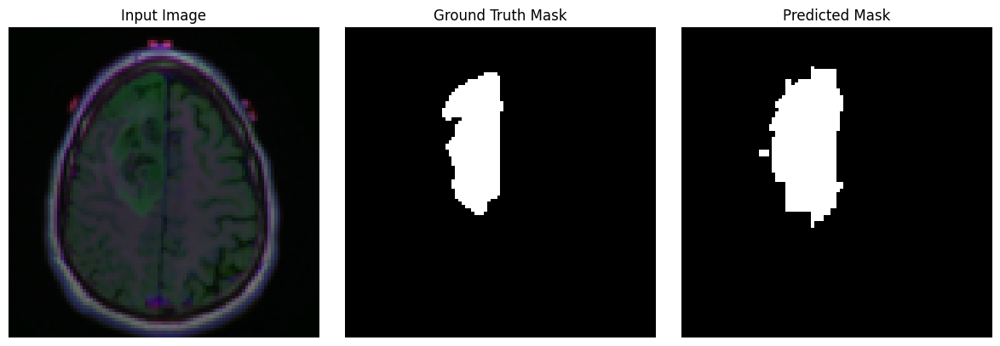

Final loss: 0.9751
Epoch 101/200 

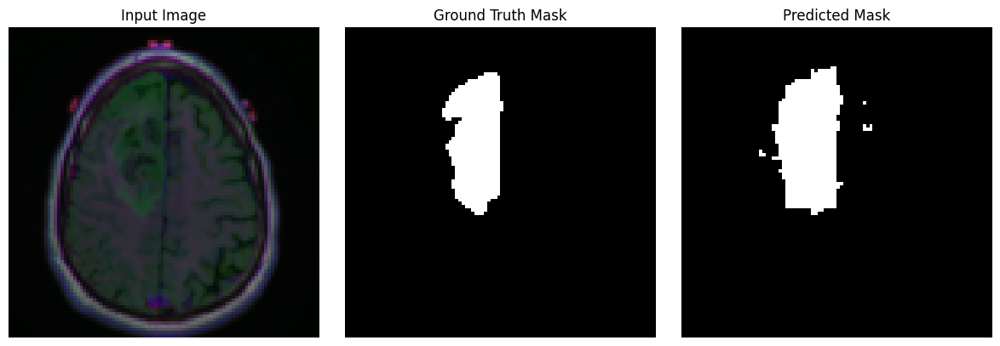

Final loss: 0.9237
Epoch 102/200 

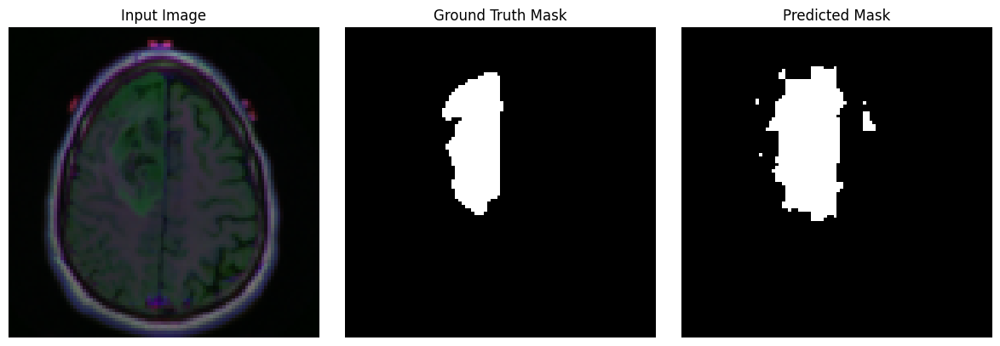

Final loss: 0.9408
Epoch 103/200 

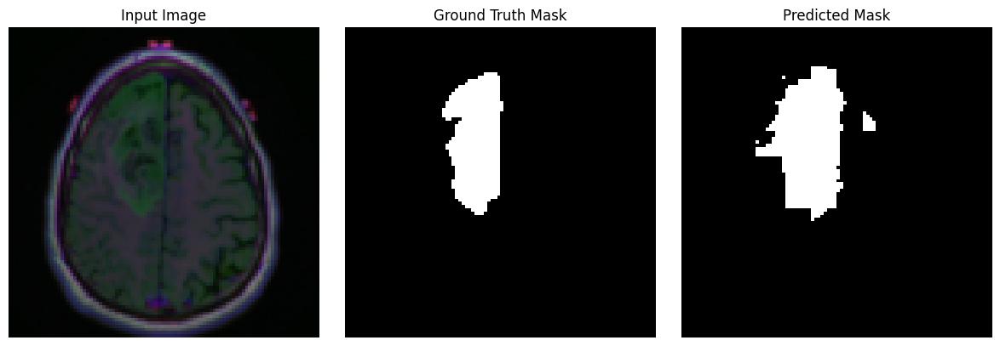

Final loss: 0.9629
Epoch 104/200 

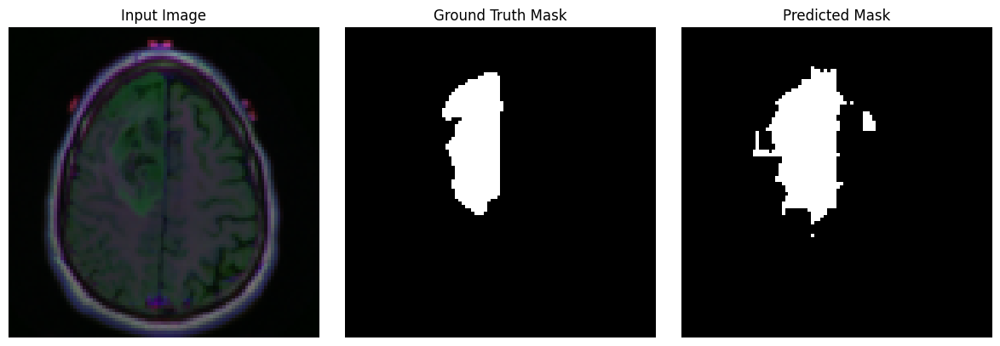

Final loss: 0.9274
Epoch 105/200 

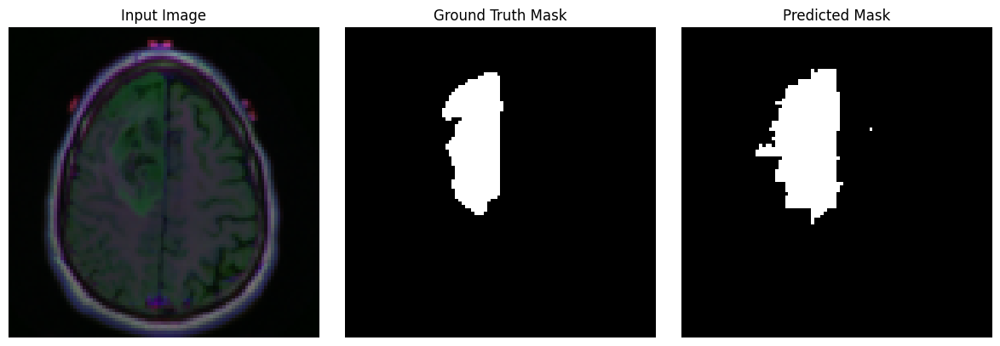

Final loss: 0.9706
Epoch 106/200 

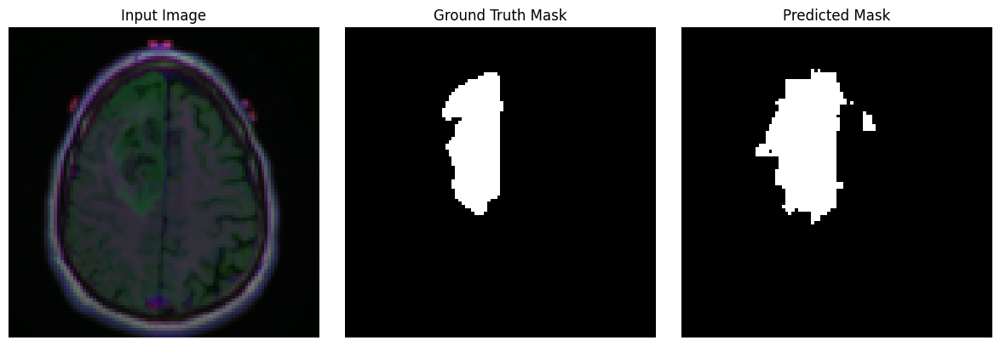

Final loss: 0.9429
Epoch 107/200 

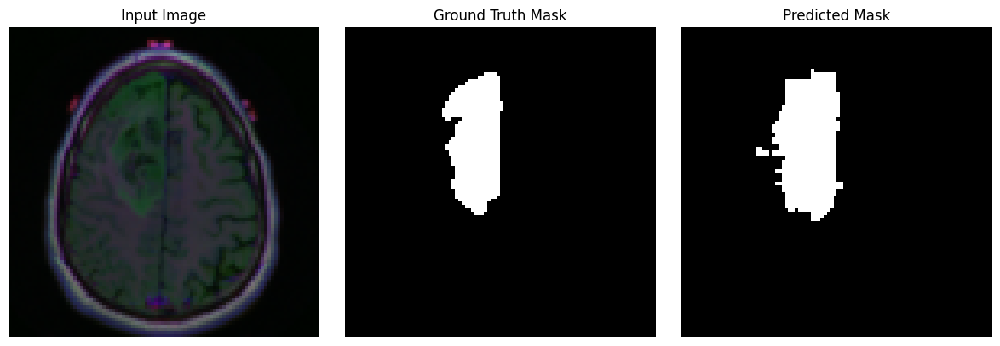

Final loss: 0.9539
Epoch 108/200 

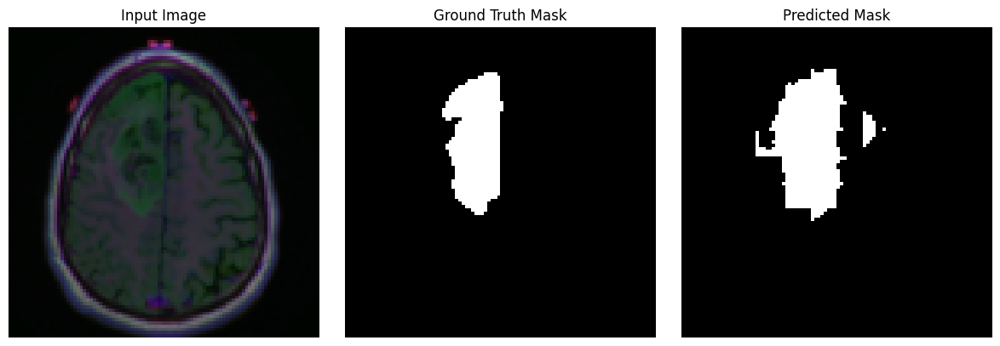

Final loss: 0.9163
Epoch 109/200 

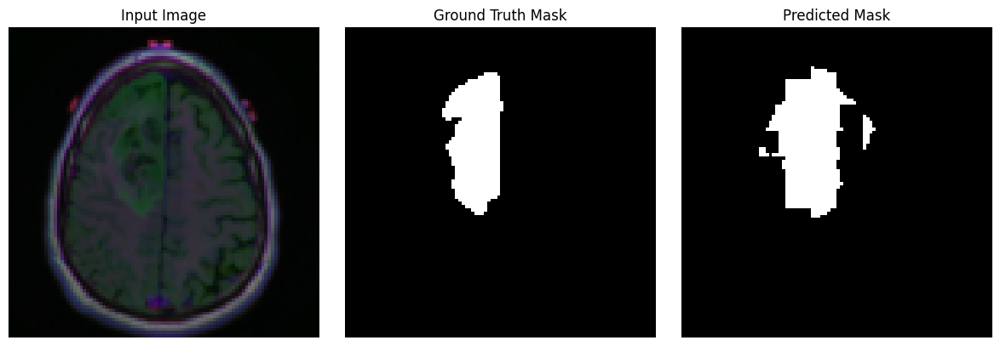

Final loss: 0.9430
Epoch 110/200 

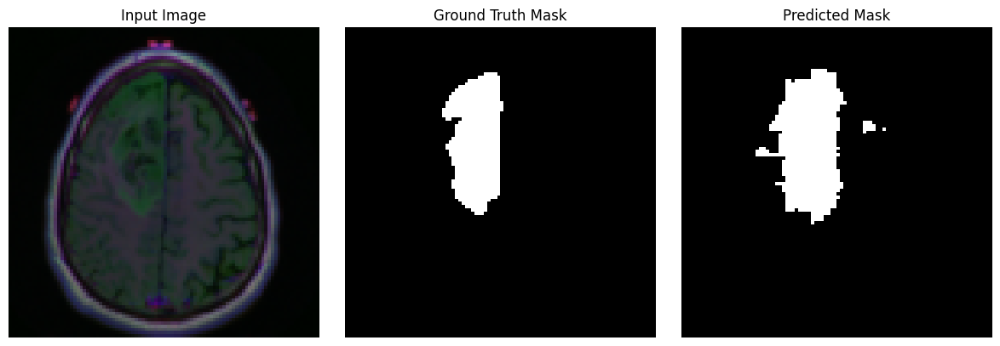

Final loss: 0.9629
Epoch 111/200 

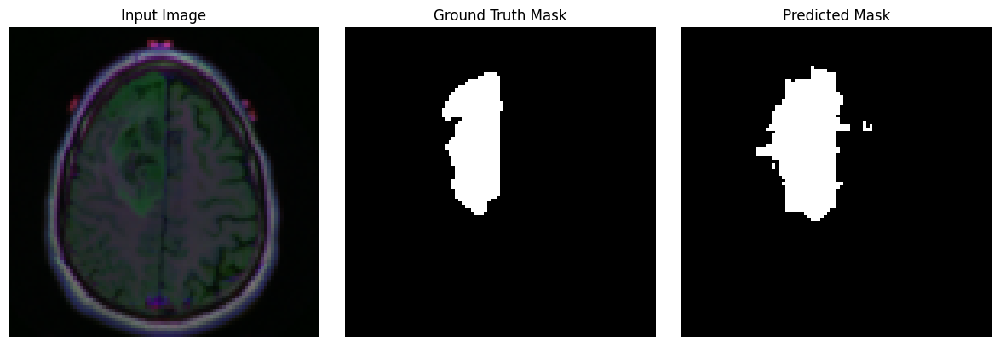

Final loss: 0.9572
Epoch 112/200 

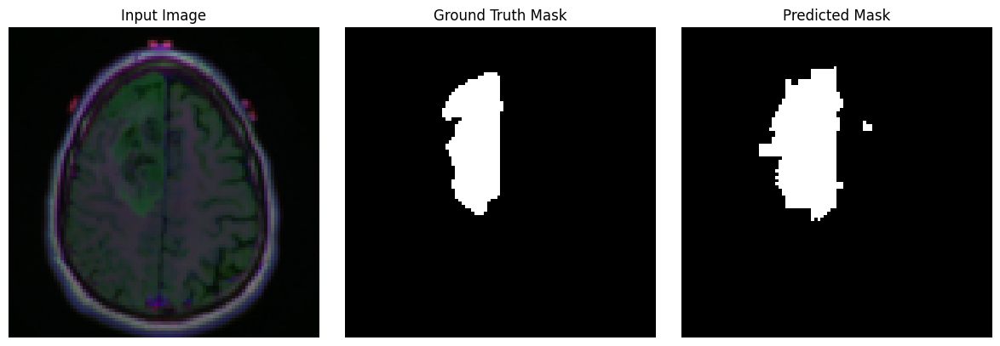

Final loss: 0.9447
Epoch 113/200 

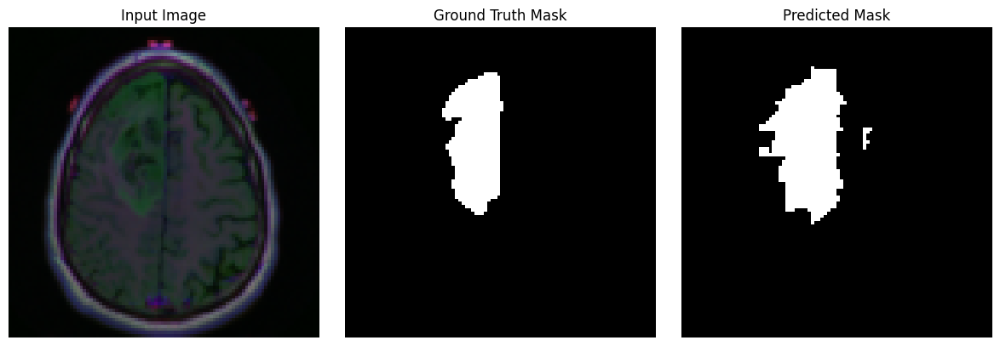

Final loss: 0.9683
Epoch 114/200 

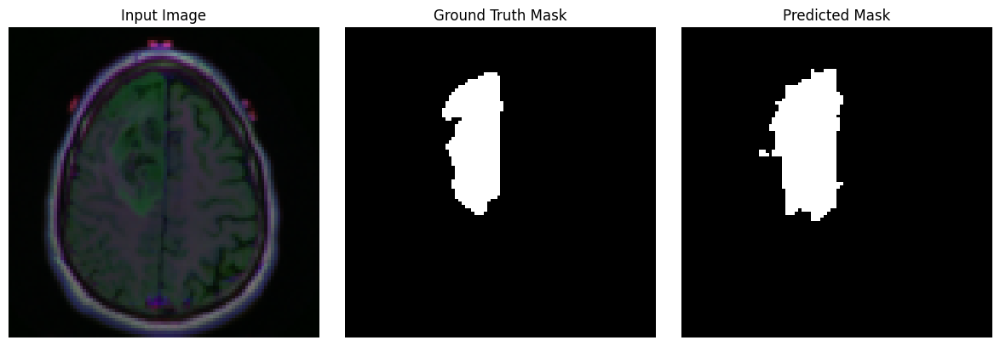

Final loss: 0.8902
Epoch 115/200 

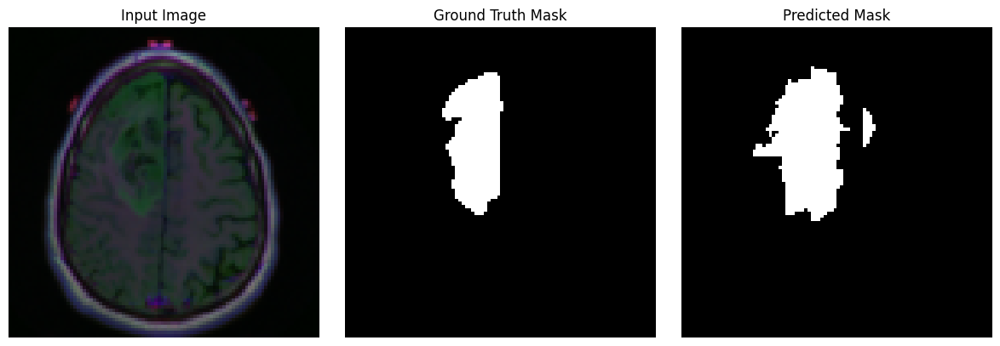

Final loss: 0.9805
Epoch 116/200 

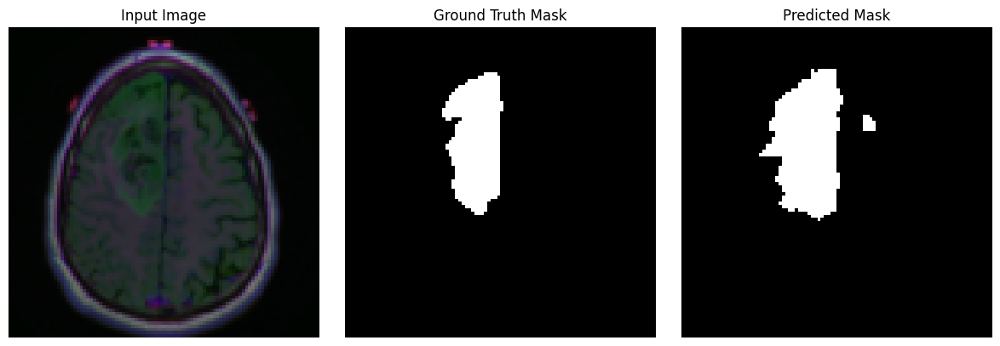

Final loss: 0.9234
Epoch 117/200 

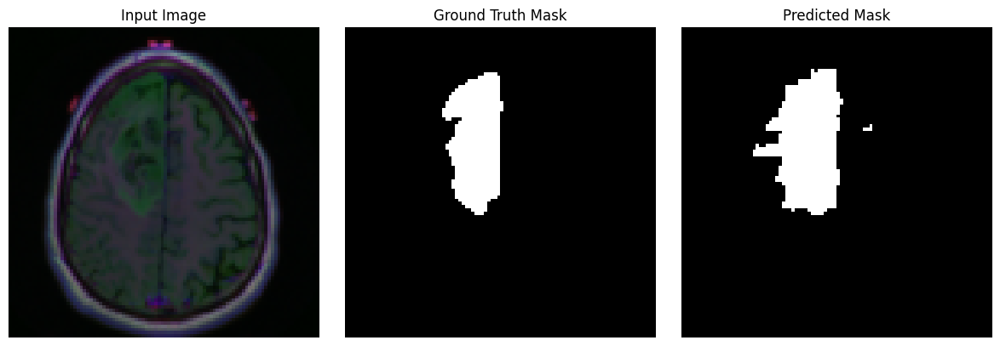

Final loss: 0.9398
Epoch 118/200 

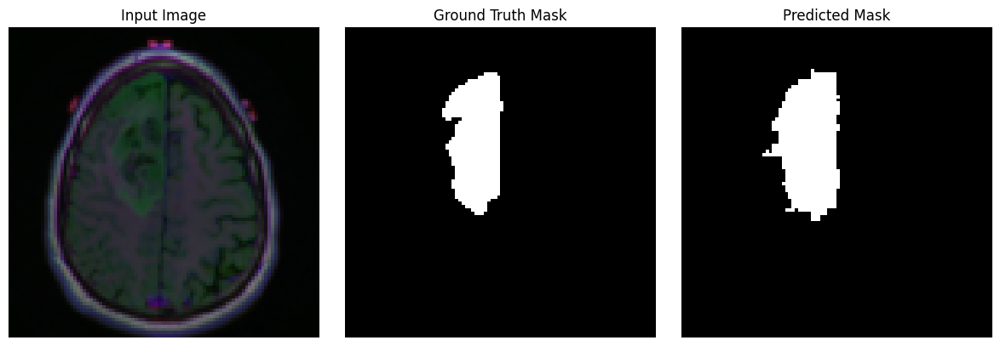

Final loss: 0.9384
Epoch 119/200 

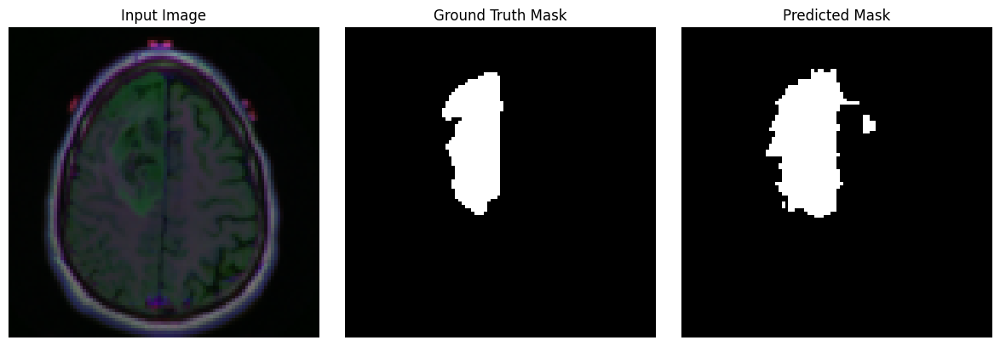

Final loss: 0.9717
Epoch 120/200 

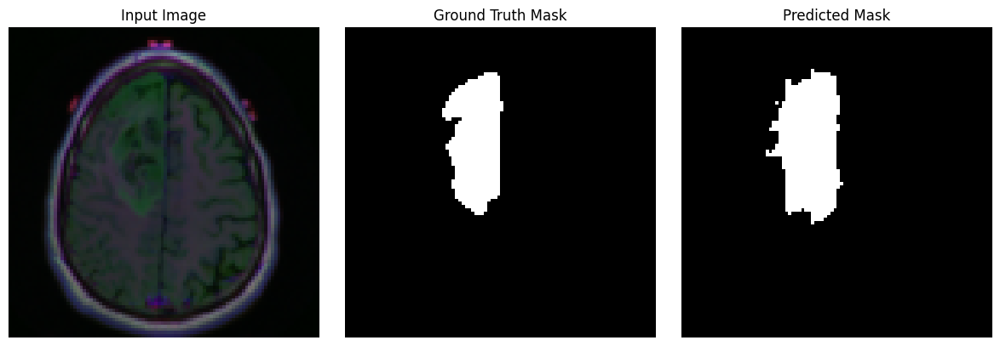

Final loss: 0.9442
Epoch 121/200 

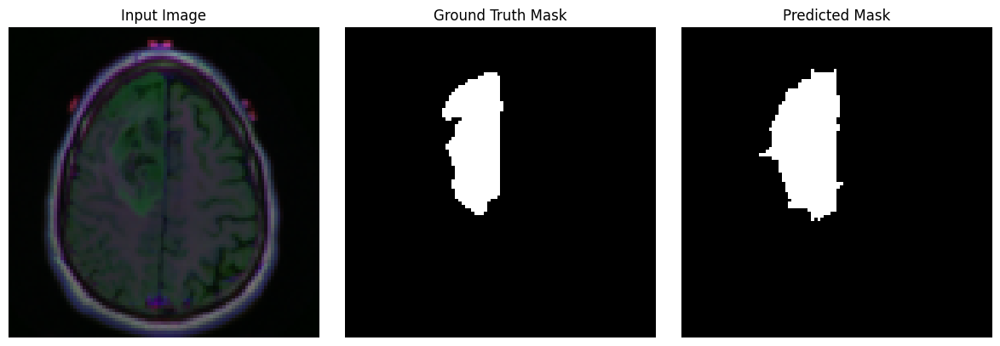

Final loss: 0.9596
Epoch 122/200 

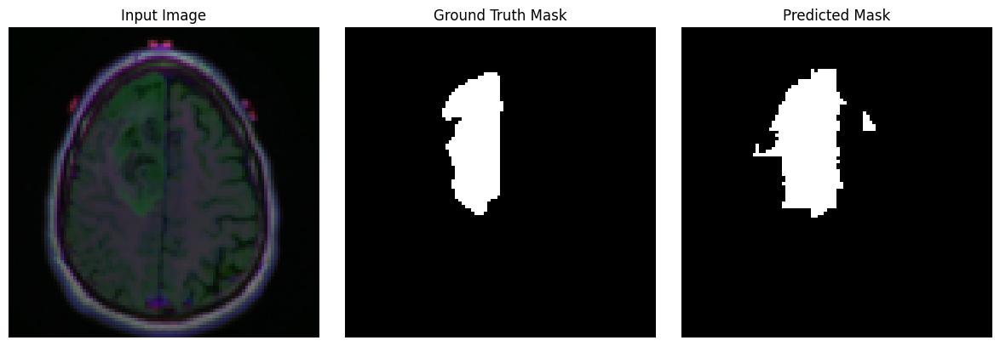

Final loss: 0.9664
Epoch 123/200 

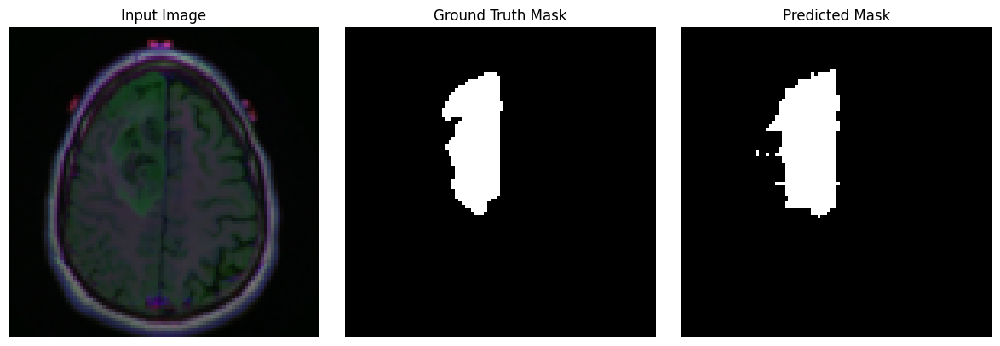

Final loss: 0.9510
Epoch 124/200 

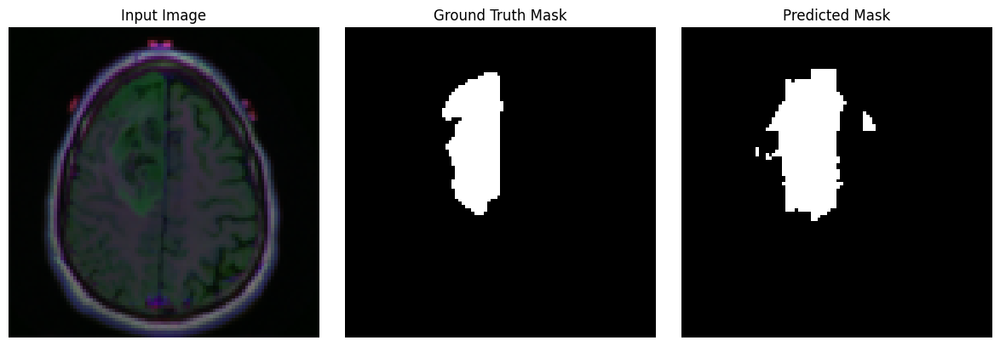

Final loss: 0.9605
Epoch 125/200 

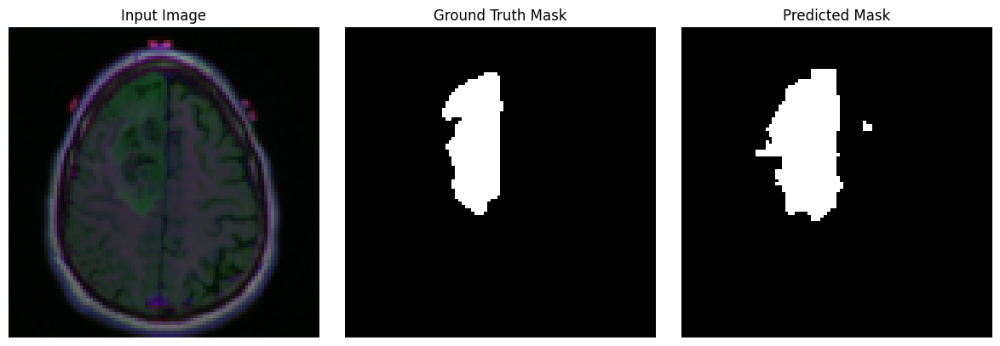

Final loss: 0.9242
Epoch 126/200 

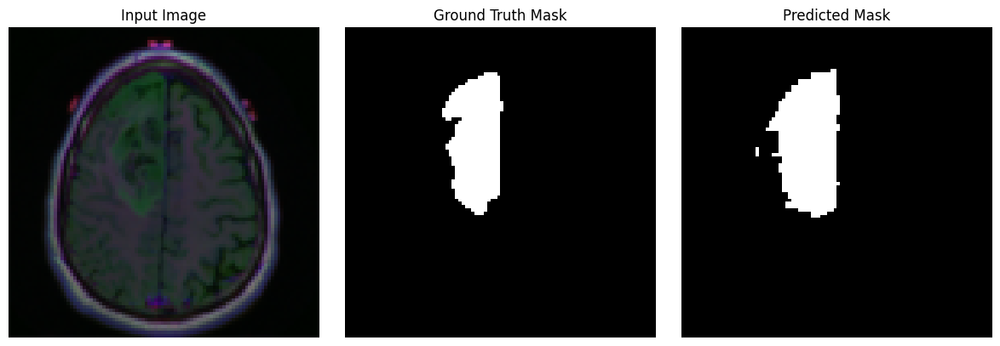

Final loss: 0.9717
Epoch 127/200 

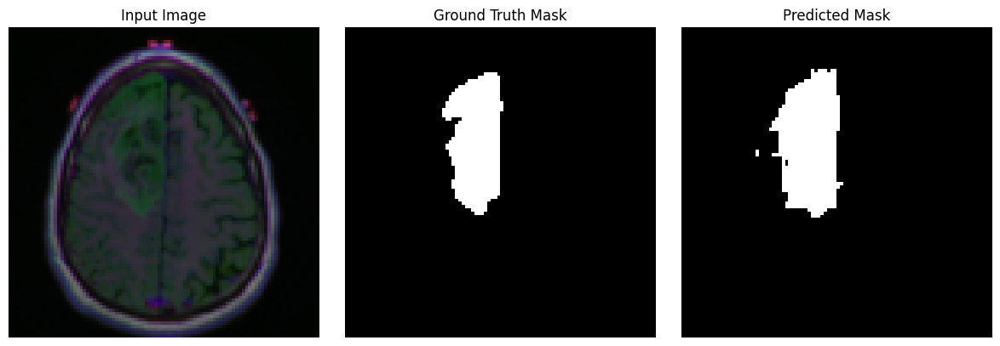

Final loss: 0.9409
Epoch 128/200 

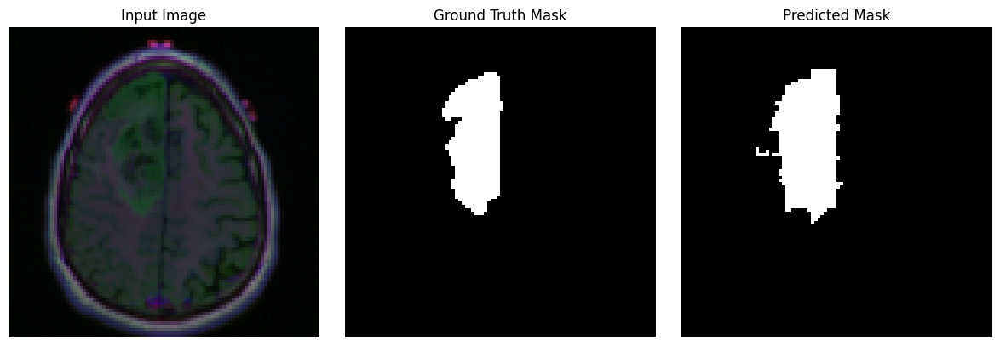

Final loss: 0.9599
Epoch 129/200 

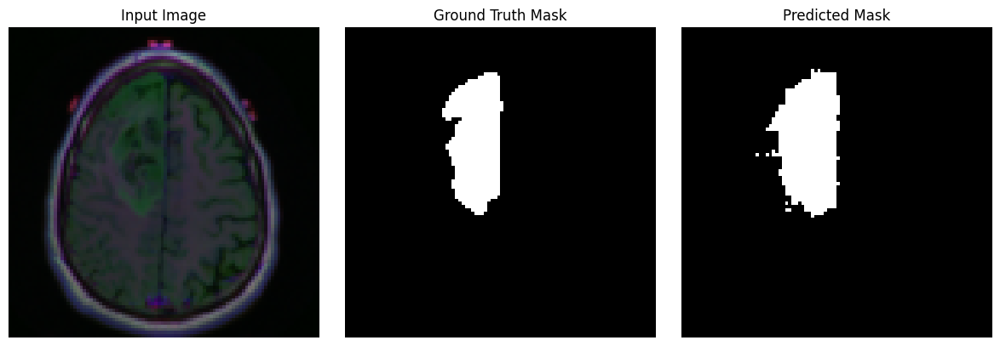

Final loss: 0.9638
Epoch 130/200 

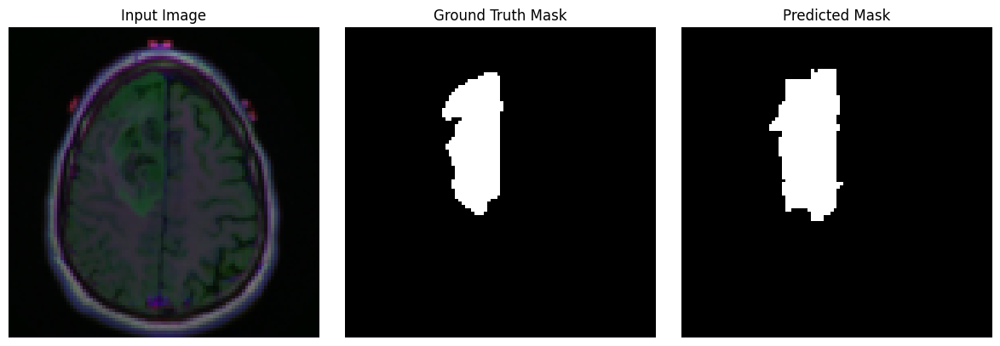

Final loss: 0.9415
Epoch 131/200 

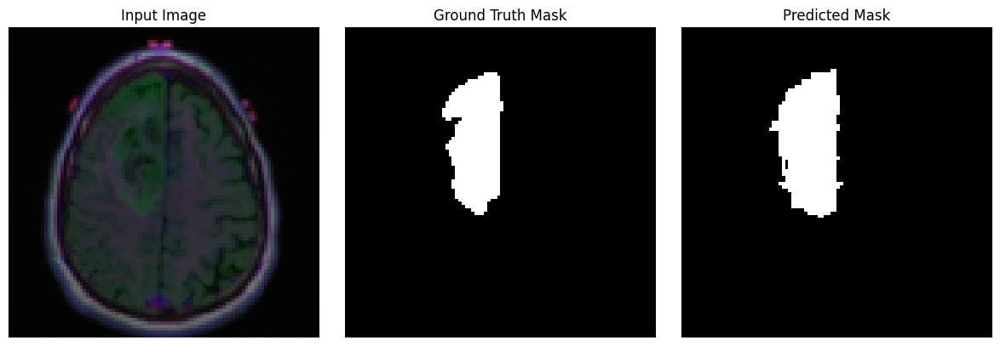

Final loss: 0.9500
Epoch 132/200 

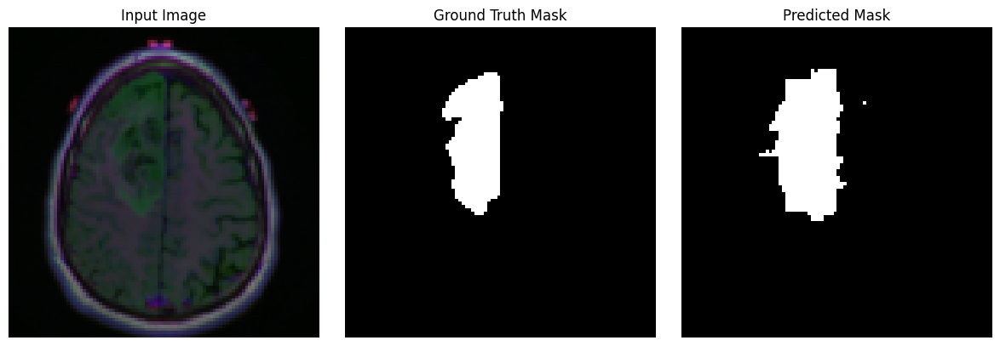

Final loss: 0.9793
Epoch 133/200 

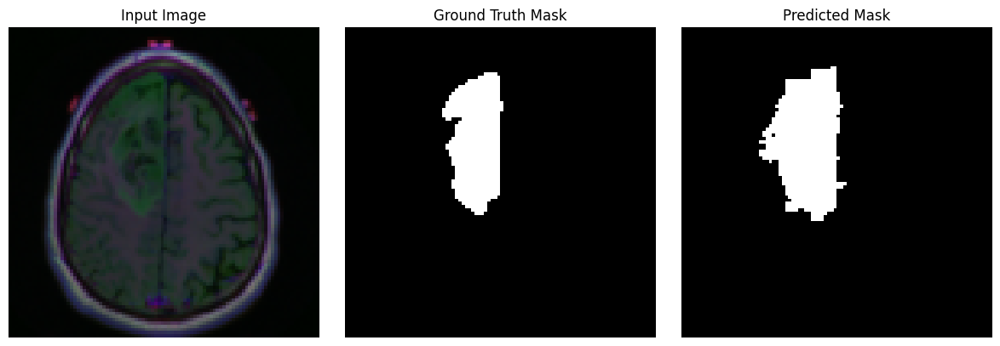

Final loss: 0.9562
Epoch 134/200 

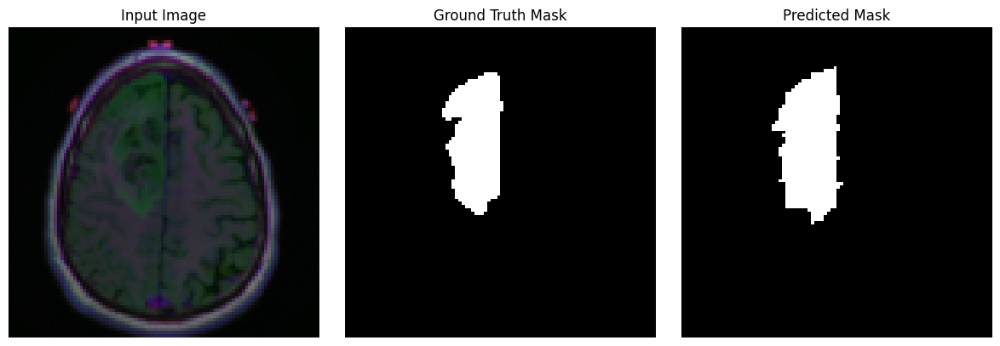

Final loss: 0.9704
Epoch 135/200 

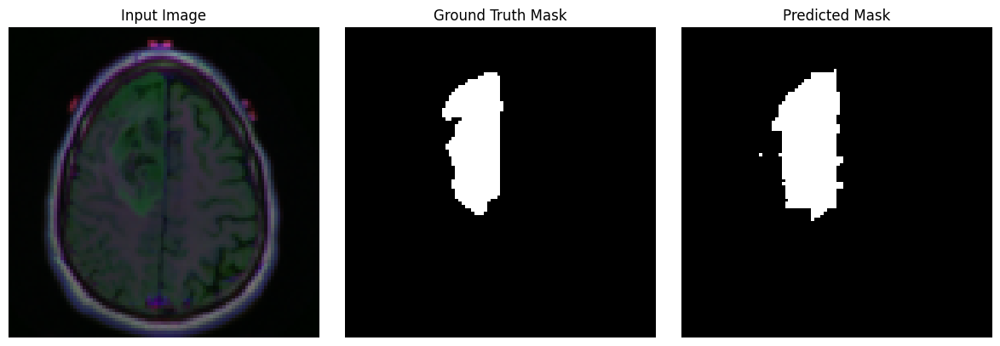

Final loss: 0.9598
Epoch 136/200 

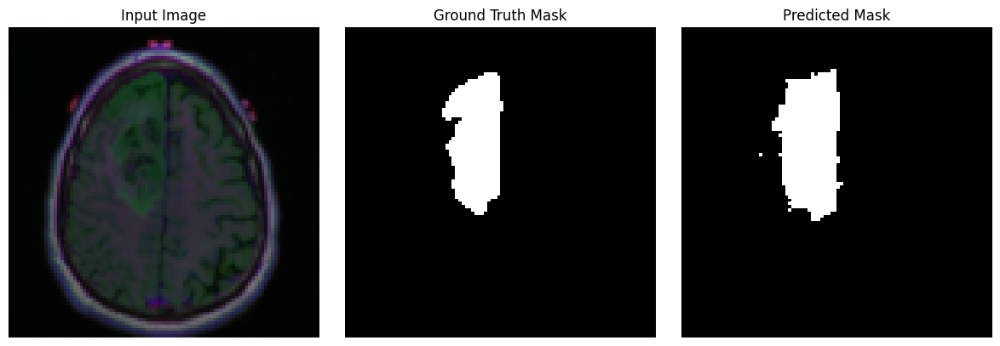

Final loss: 0.9638
Epoch 137/200 

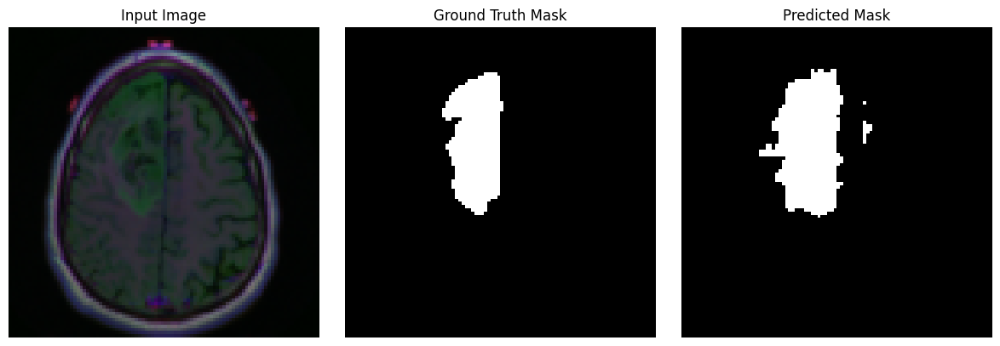

Final loss: 0.9654
Epoch 138/200 

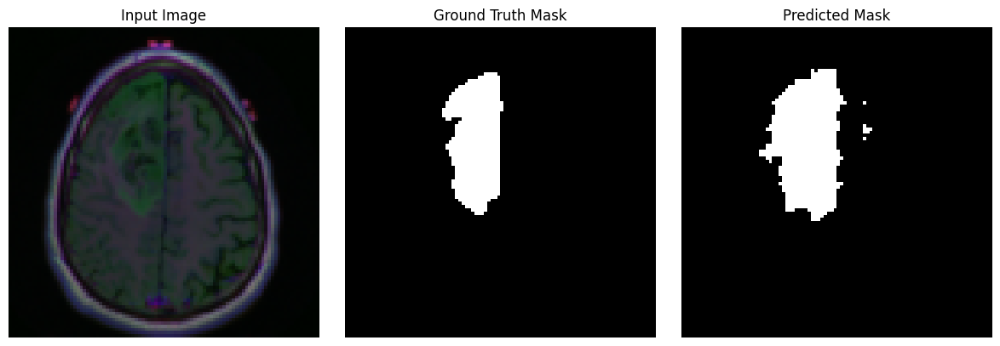

Final loss: 0.9554
Epoch 139/200 

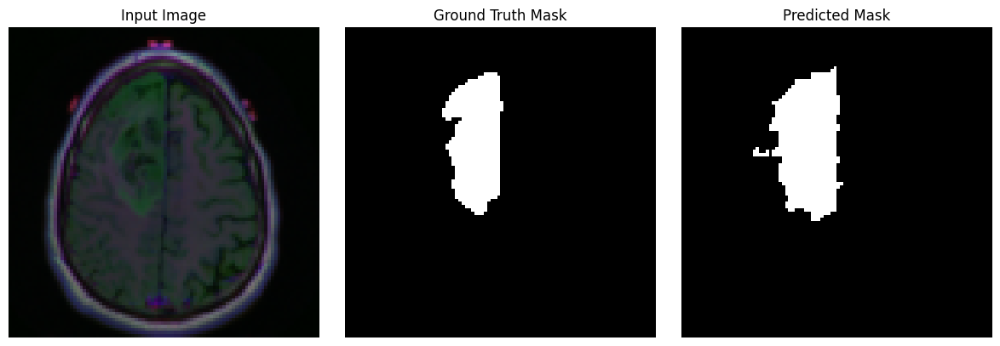

Final loss: 0.9753
Epoch 140/200 

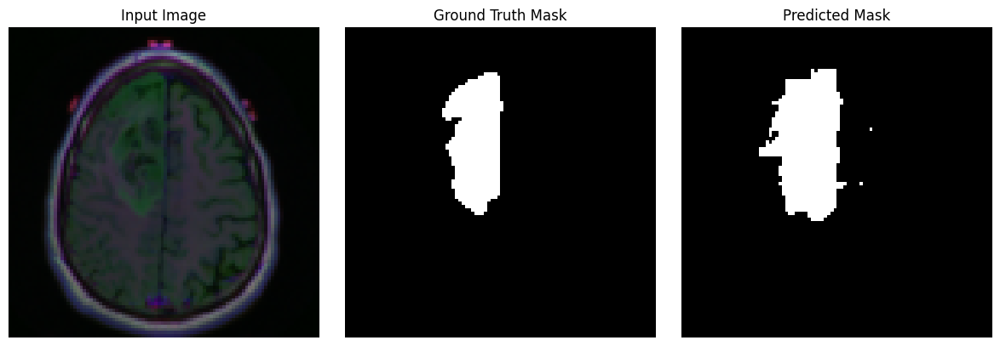

Final loss: 0.9471
Epoch 141/200 

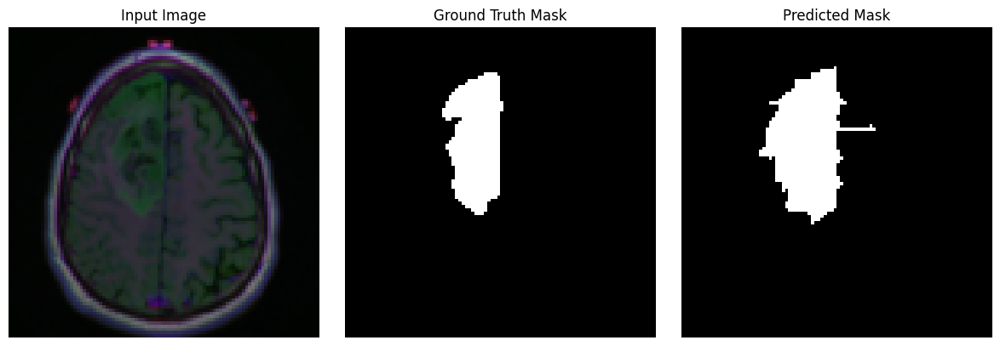

Final loss: 0.9532
Epoch 142/200 

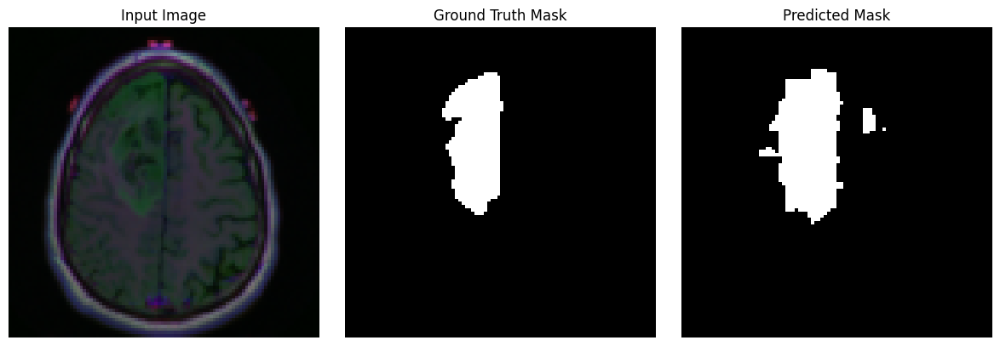

Final loss: 0.9617
Epoch 143/200 

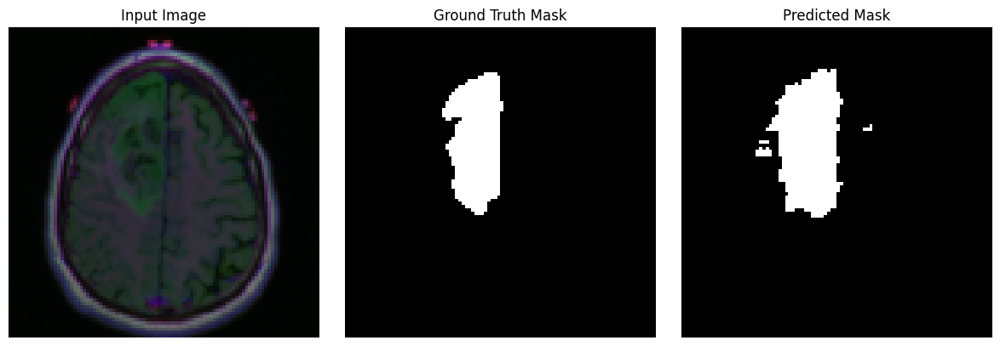

Final loss: 0.9539
Epoch 144/200 

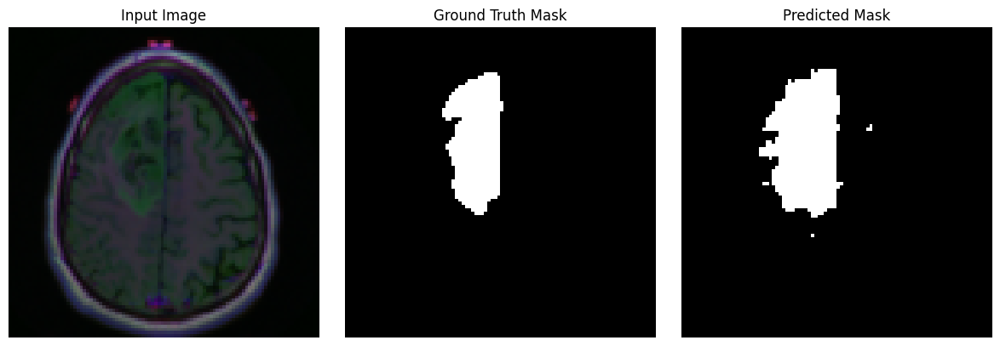

Final loss: 0.9595
Epoch 145/200 

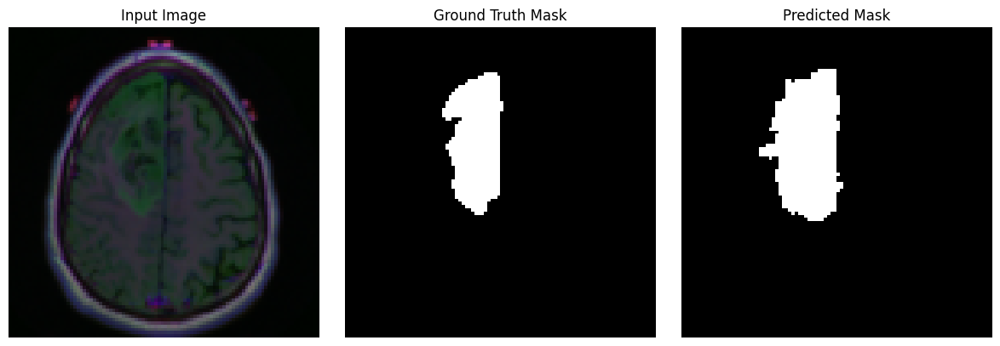

Final loss: 0.9631
Epoch 146/200 

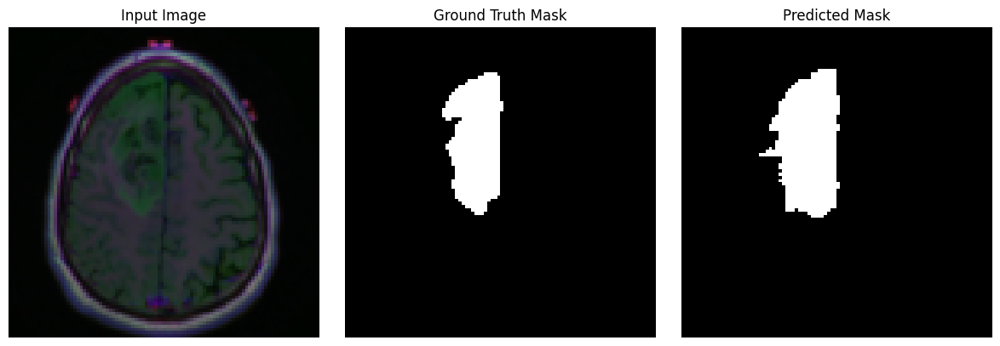

Final loss: 0.9482
Epoch 147/200 

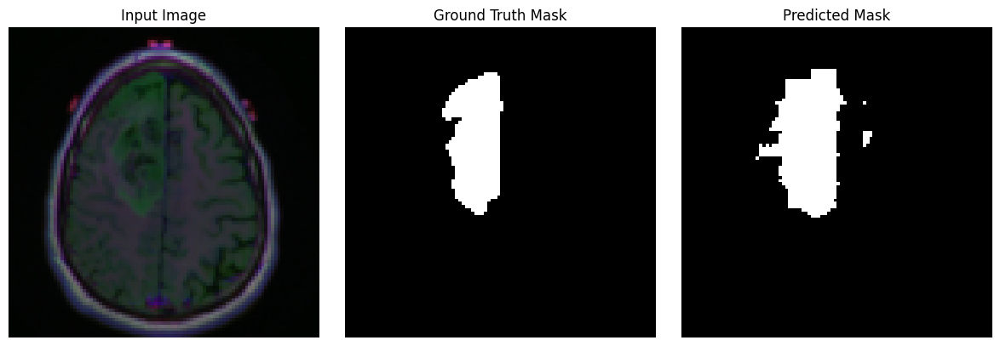

Final loss: 0.9336
Epoch 148/200 

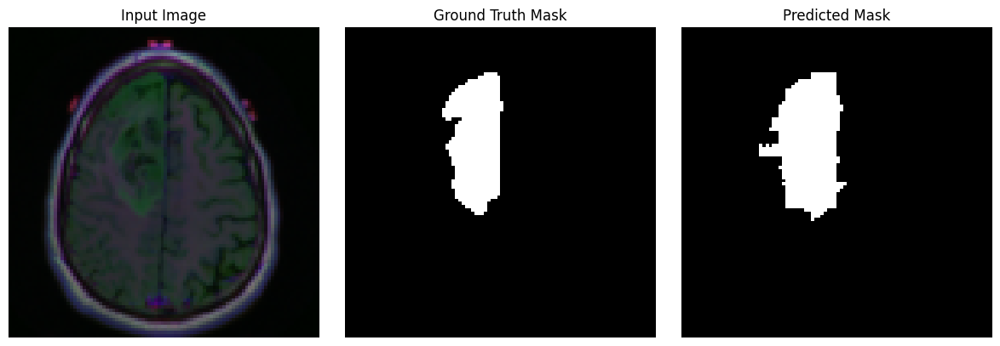

Final loss: 0.9244
Epoch 149/200 

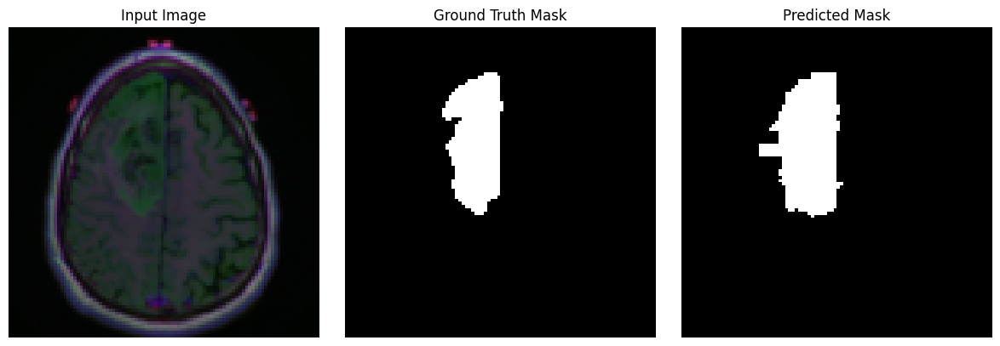

Final loss: 0.9590
Epoch 150/200 

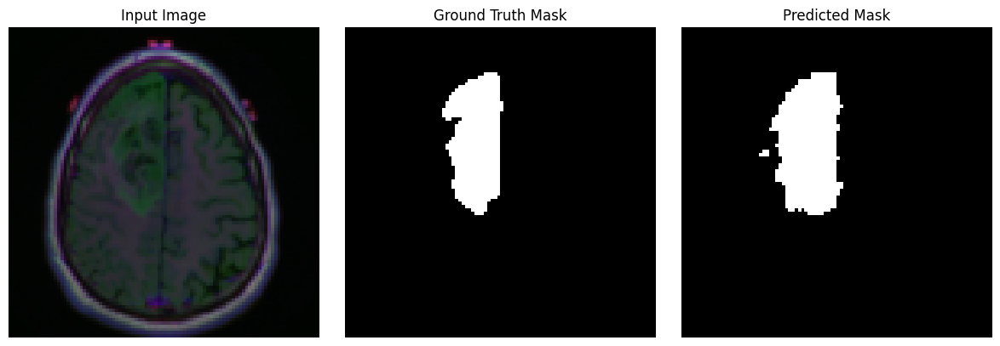

Final loss: 0.9282
Epoch 151/200 

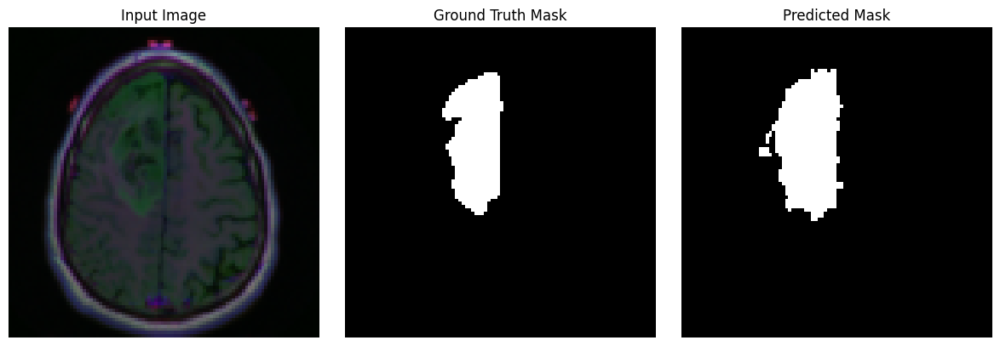

Final loss: 0.9667
Epoch 152/200 

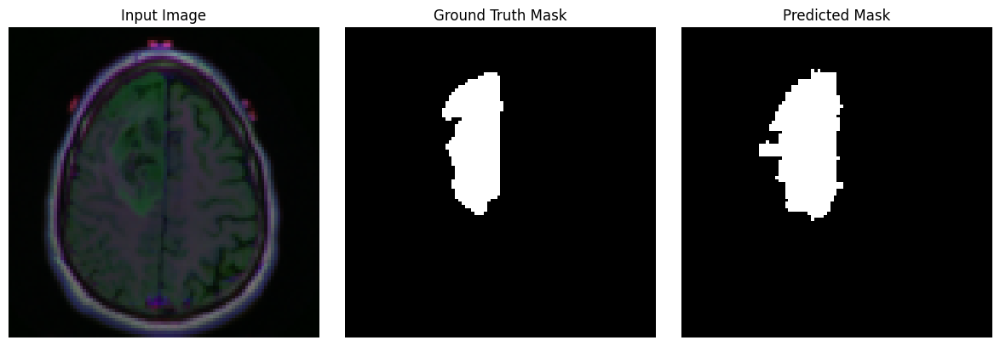

Final loss: 0.9587
Epoch 153/200 

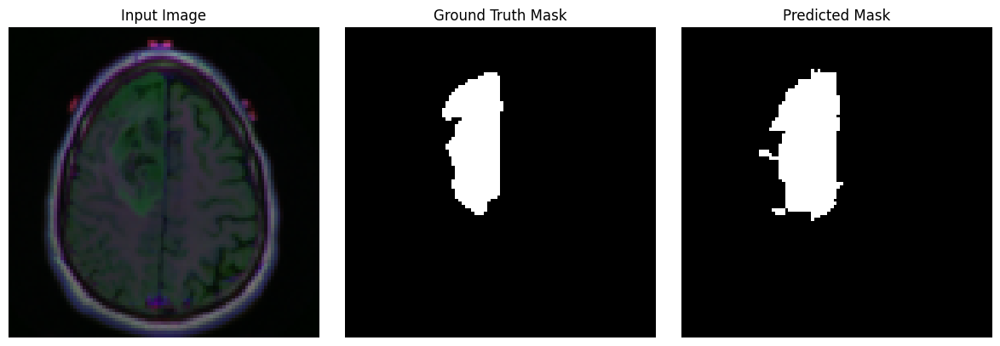

Final loss: 0.9442
Epoch 154/200 

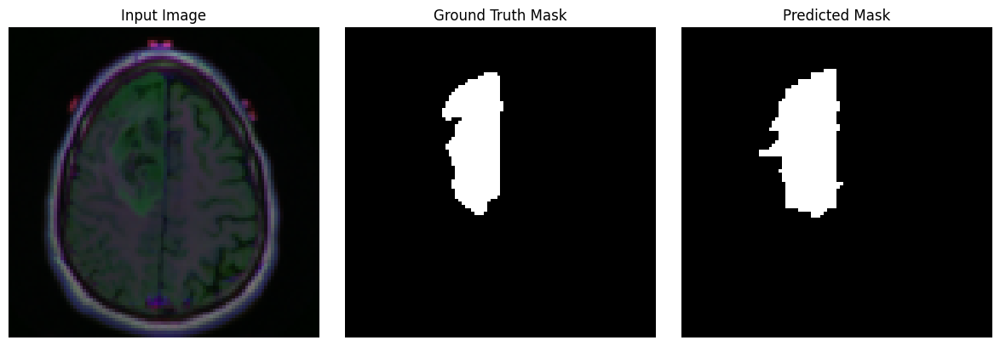

Final loss: 0.9475
Epoch 155/200 

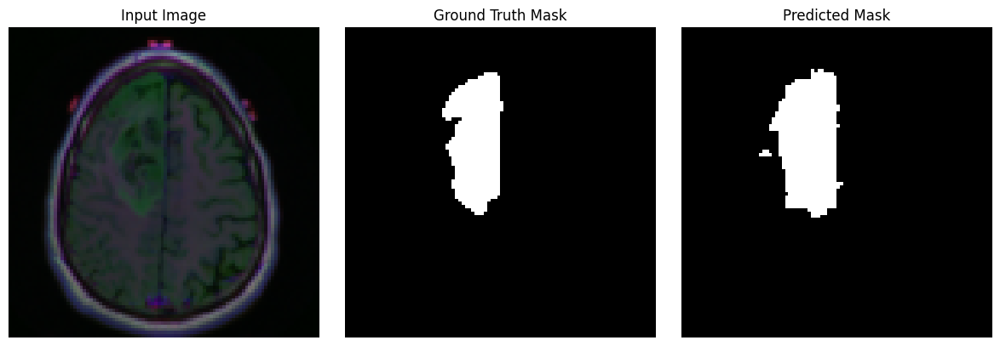

Final loss: 0.9777
Epoch 156/200 

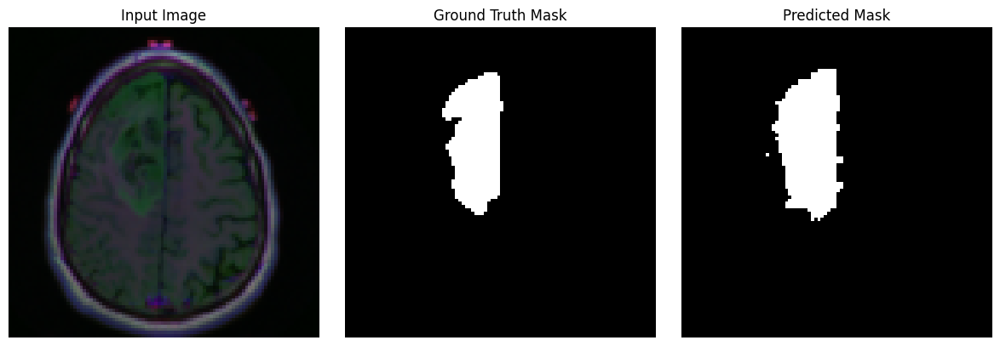

Final loss: 0.9486
Epoch 157/200 

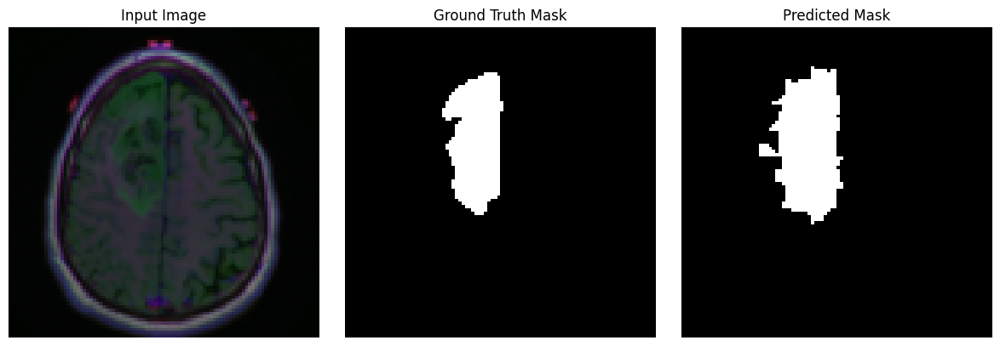

Final loss: 0.9400
Epoch 158/200 

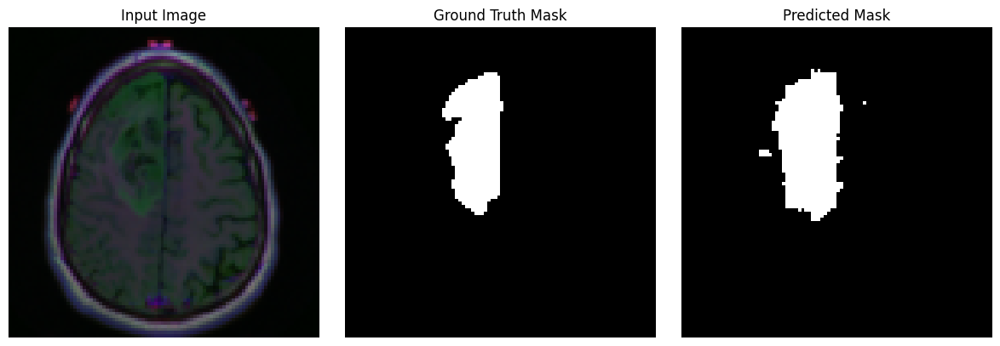

Final loss: 0.9330
Epoch 159/200 

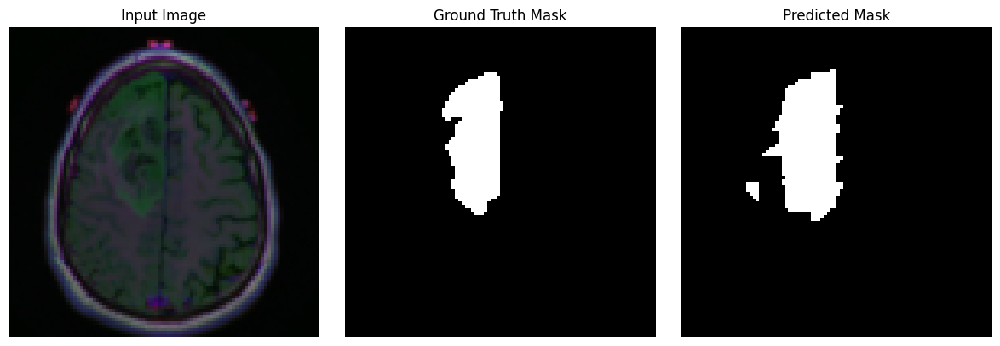

Final loss: 0.9554
Epoch 160/200 

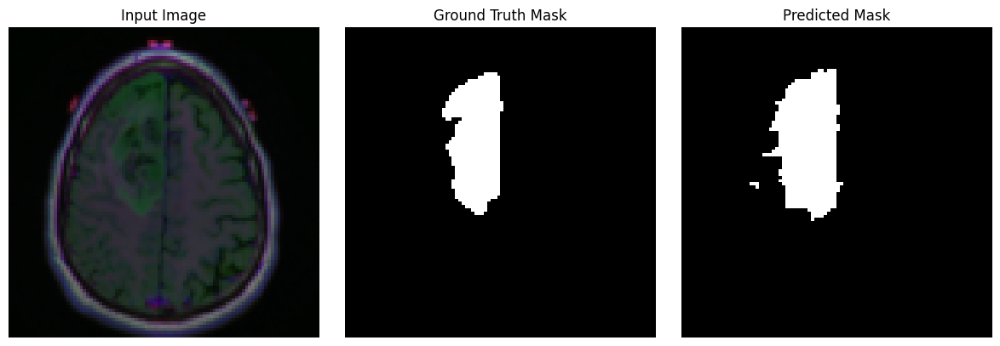

Final loss: 0.9393
Epoch 161/200 

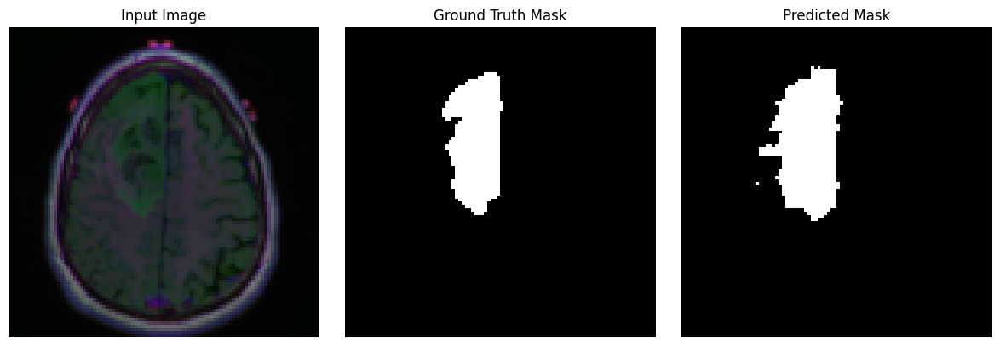

Final loss: 0.9586
Epoch 162/200 

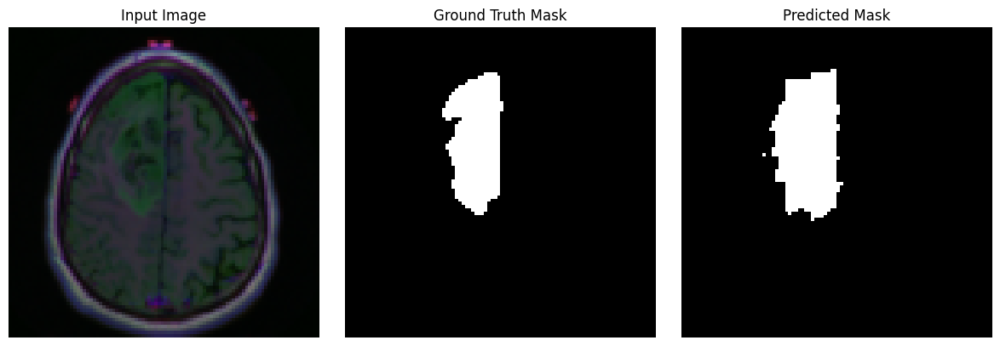

Final loss: 0.9510
Epoch 163/200 

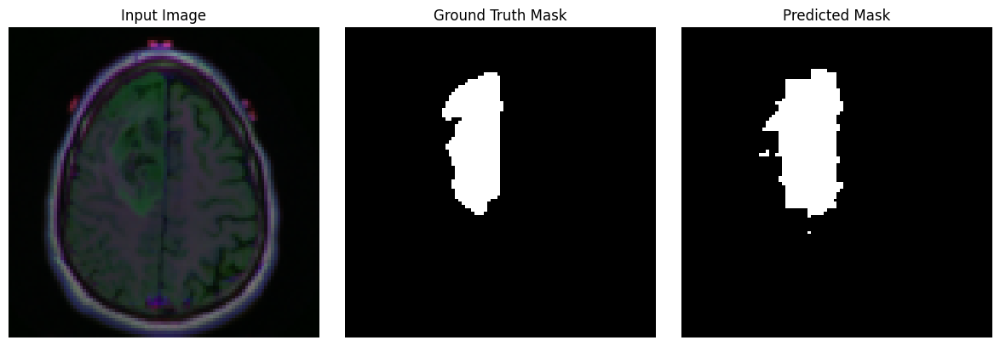

Final loss: 0.9627
Epoch 164/200 

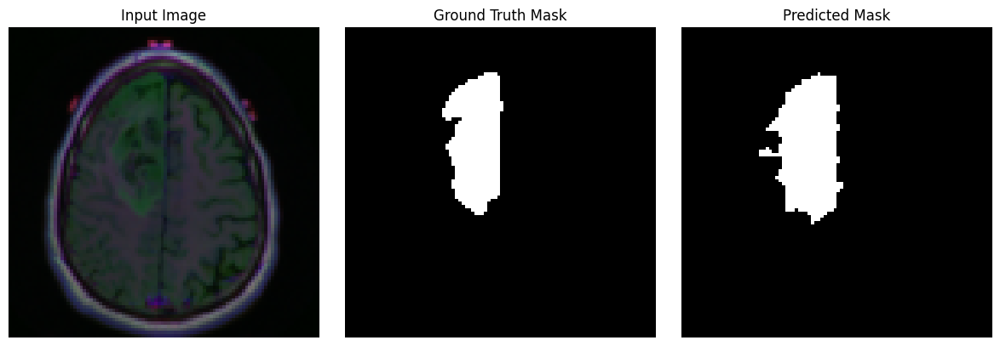

Final loss: 0.9469
Epoch 165/200 

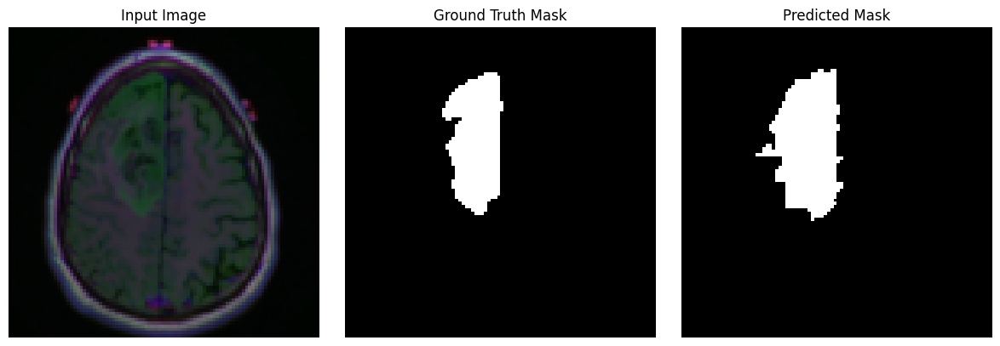

Final loss: 0.9369
Epoch 166/200 

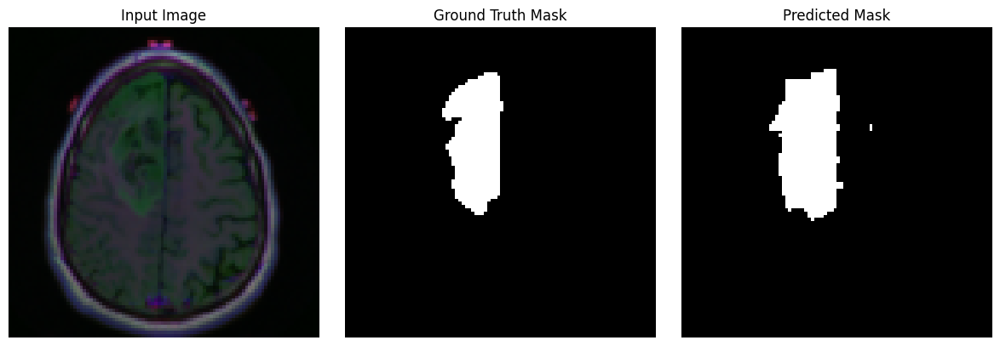

Final loss: 0.9406
Epoch 167/200 

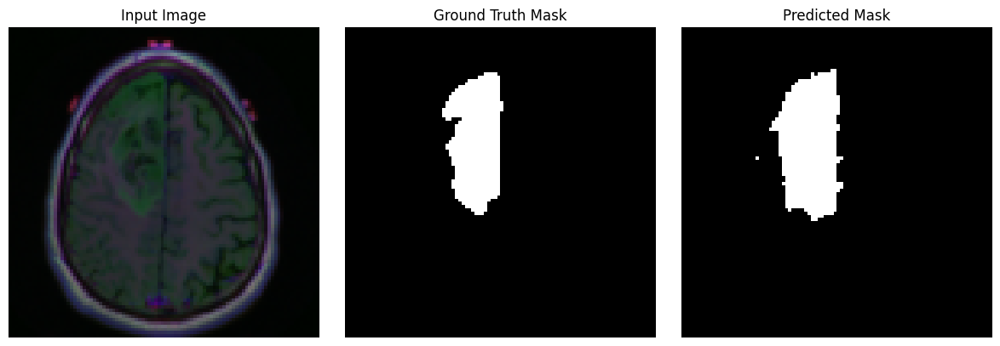

Final loss: 0.9292
Epoch 168/200 

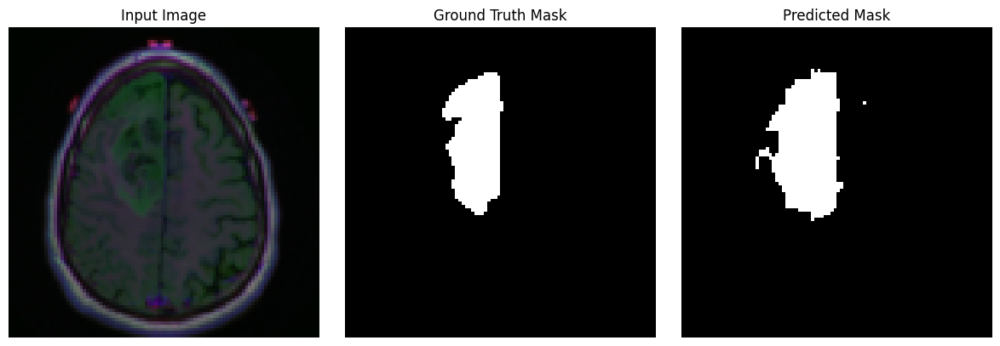

Final loss: 0.9502
Epoch 169/200 

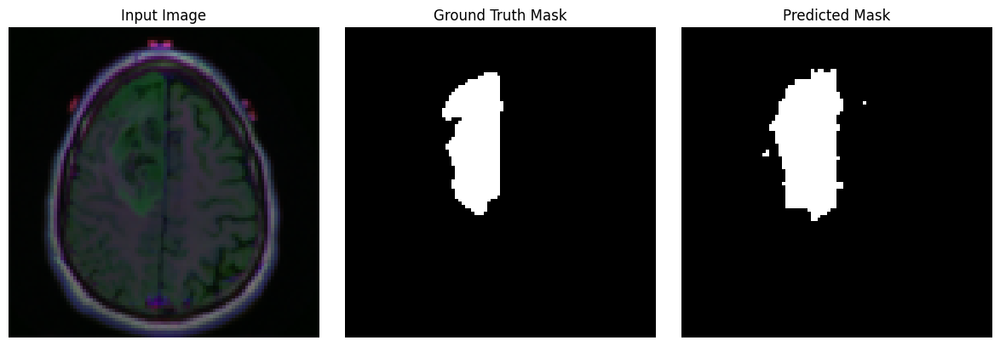

Final loss: 0.9367
Epoch 170/200 

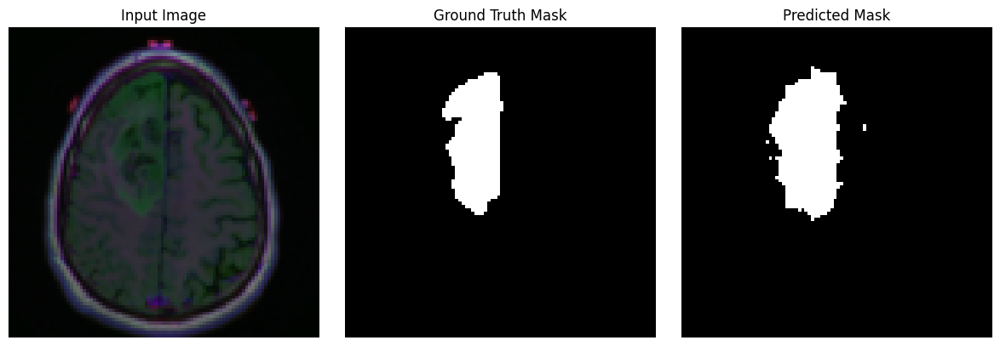

Final loss: 0.9531
Epoch 171/200 

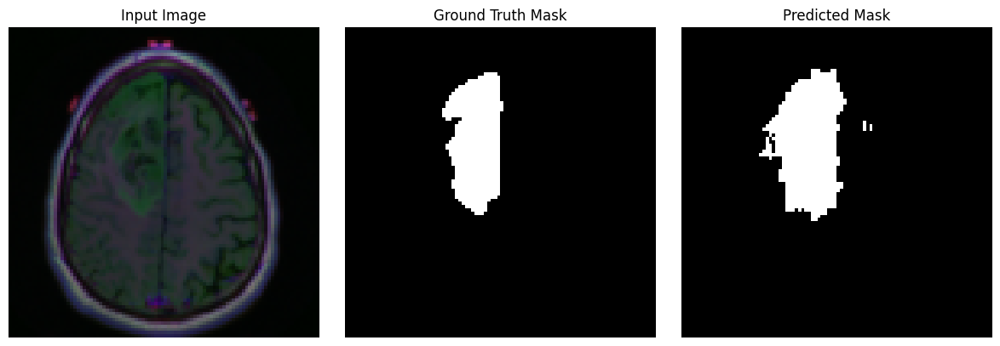

Final loss: 0.9555
Epoch 172/200 

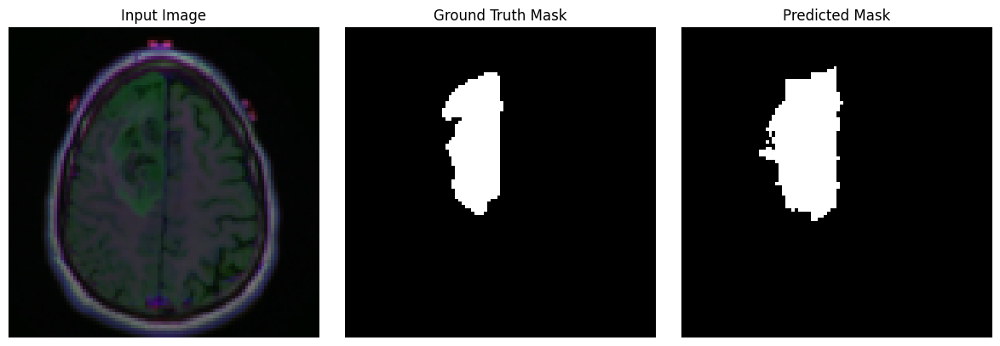

Final loss: 0.9438
Epoch 173/200 

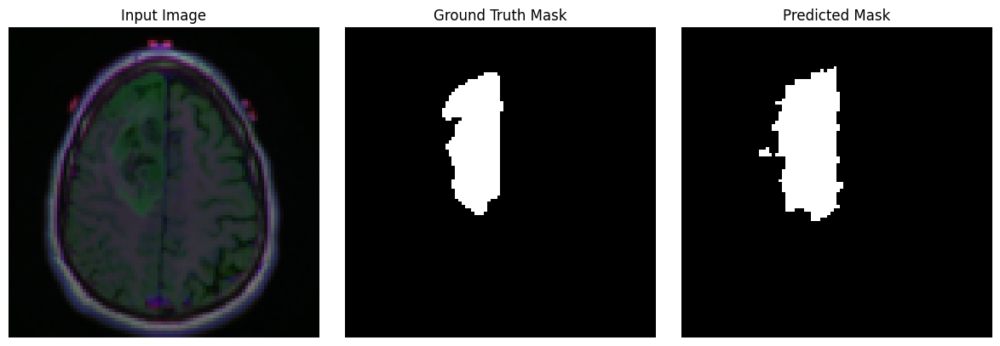

Final loss: 0.9716
Epoch 174/200 

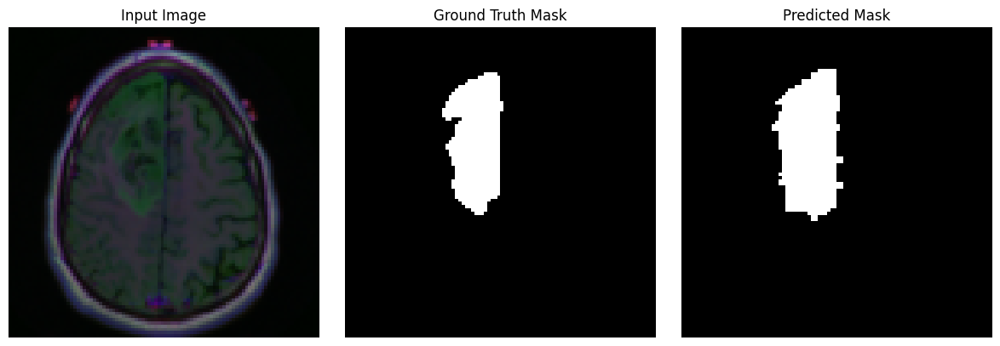

Final loss: 0.9577
Epoch 175/200 

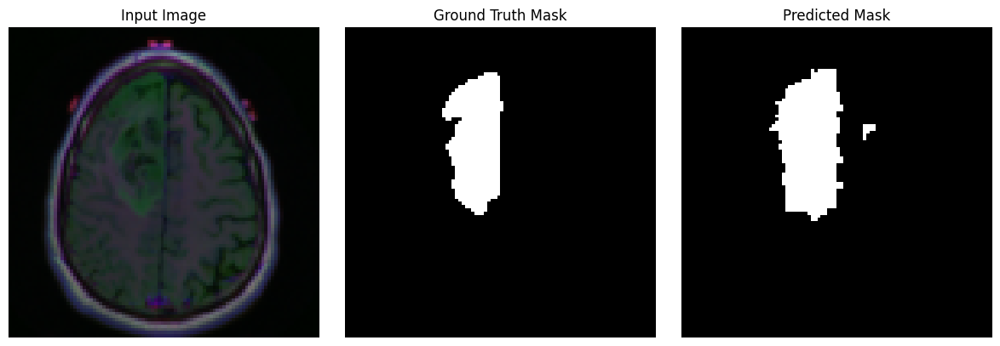

Final loss: 0.9712
Epoch 176/200 

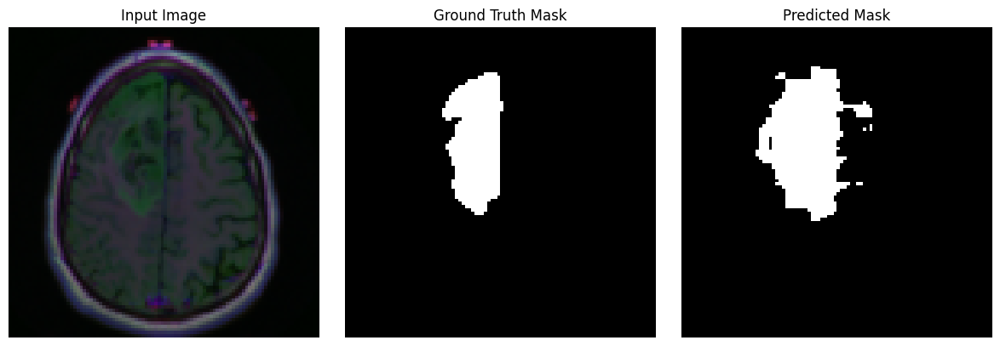

Final loss: 0.9502
Epoch 177/200 

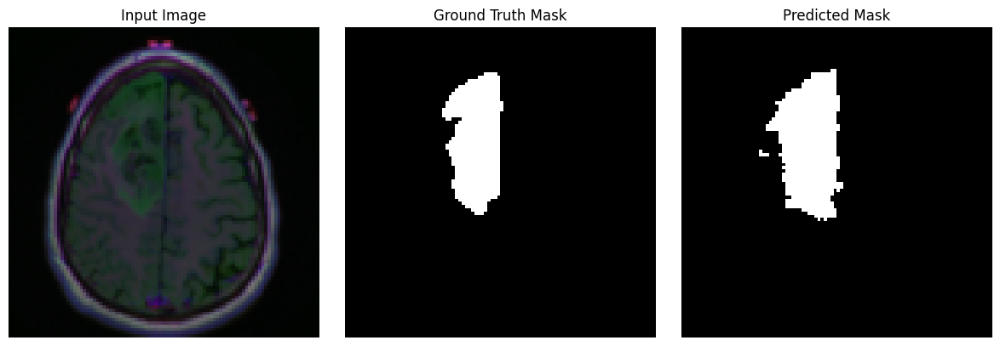

Final loss: 0.9693
Epoch 178/200 

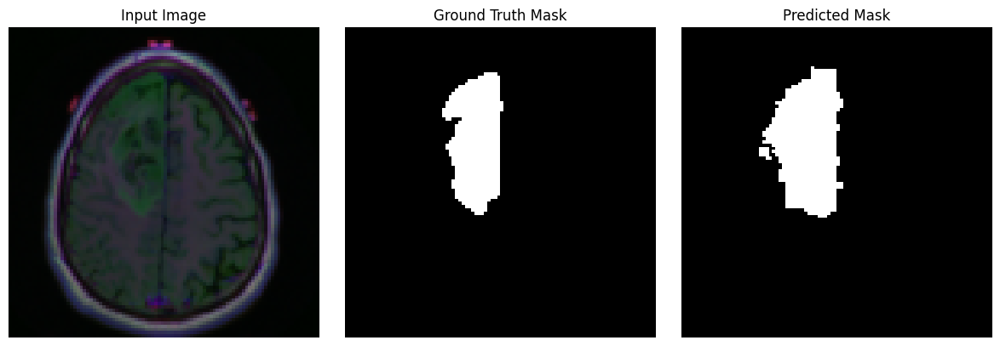

Final loss: 0.9584
Epoch 179/200 

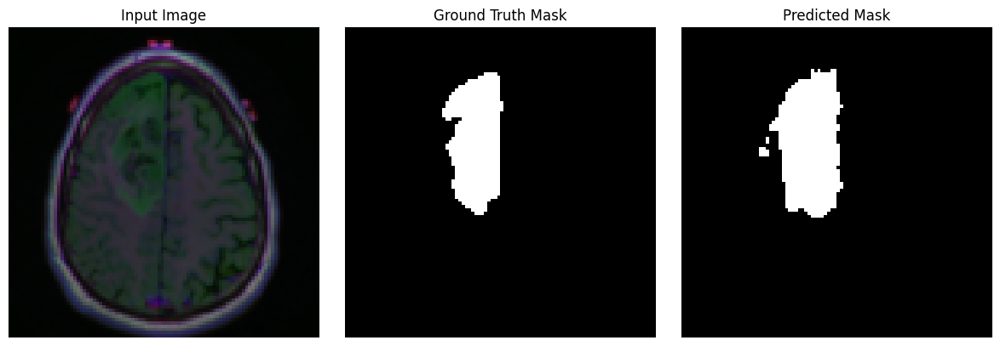

Final loss: 0.9402
Epoch 180/200 

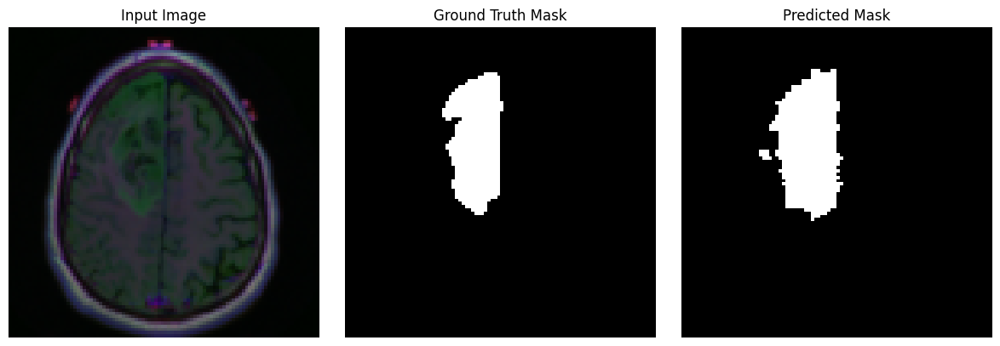

Final loss: 0.9449
Epoch 181/200 

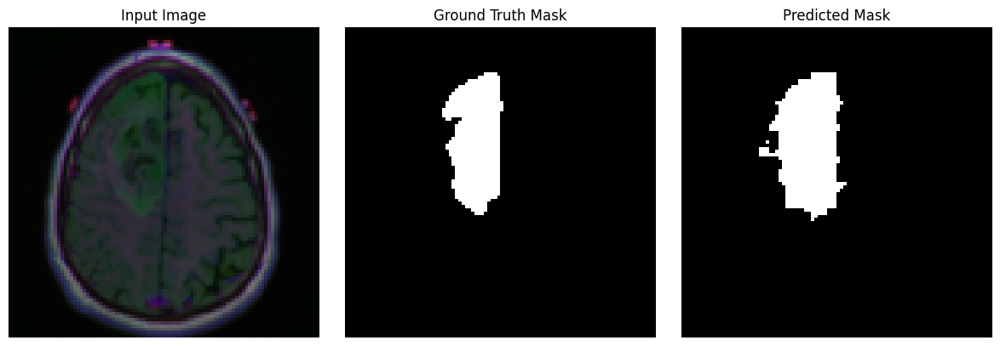

Final loss: 0.9760
Epoch 182/200 

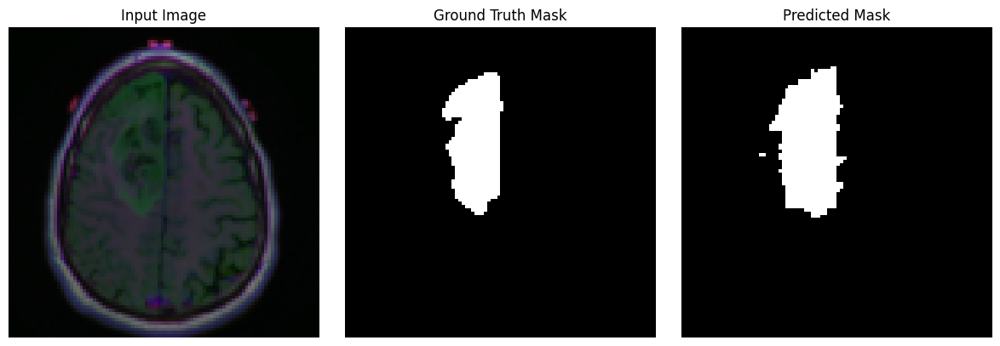

Final loss: 0.9600
Epoch 183/200 

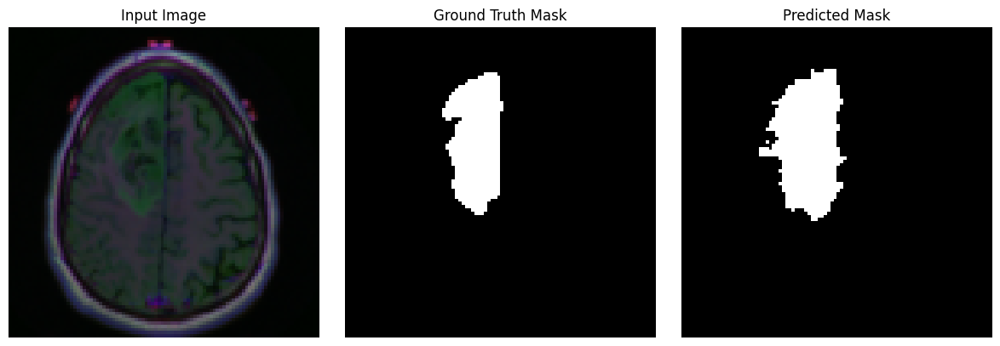

Final loss: 0.9356
Epoch 184/200 

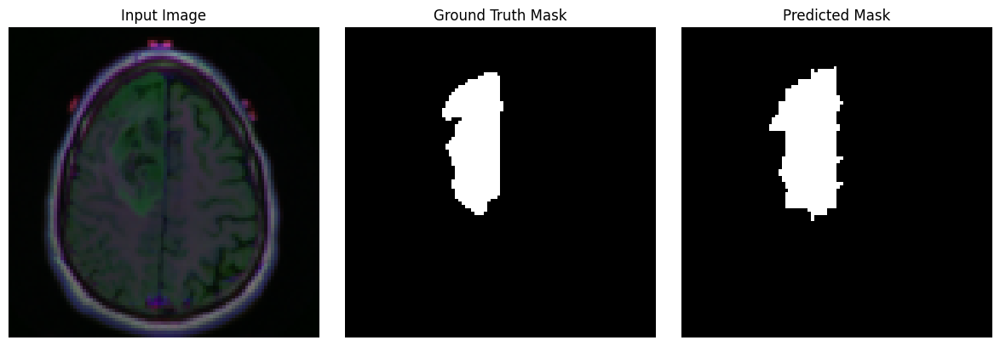

Final loss: 0.9818
Epoch 185/200 

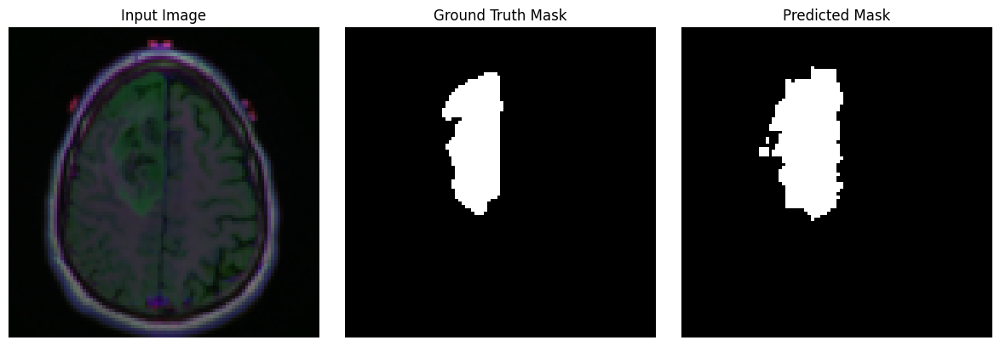

Final loss: 0.9446
Epoch 186/200 

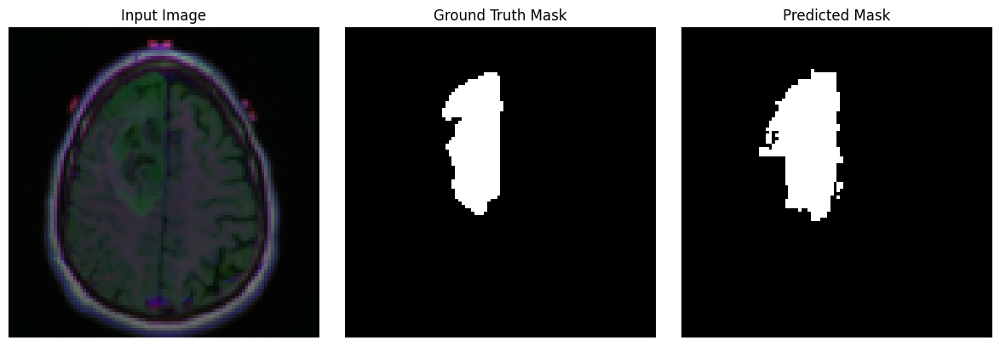

Final loss: 0.9562
Epoch 187/200 

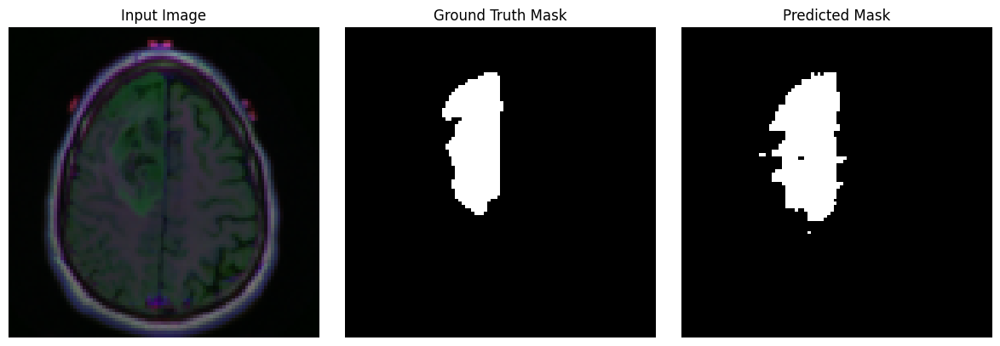

Final loss: 0.9442
Epoch 188/200 

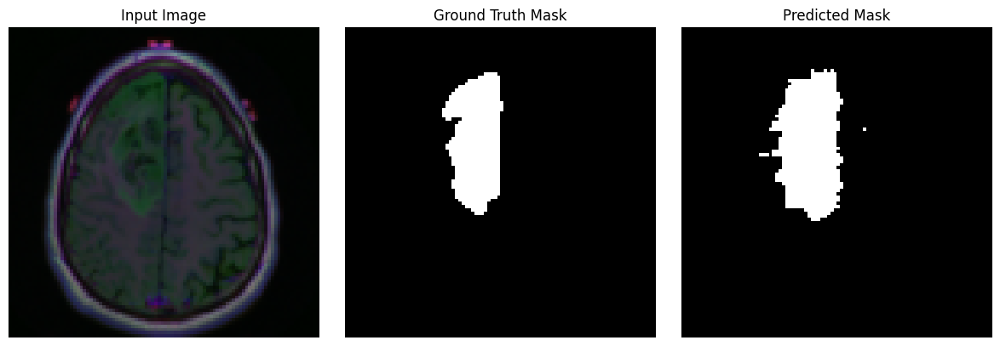

Final loss: 0.9493
Epoch 189/200 

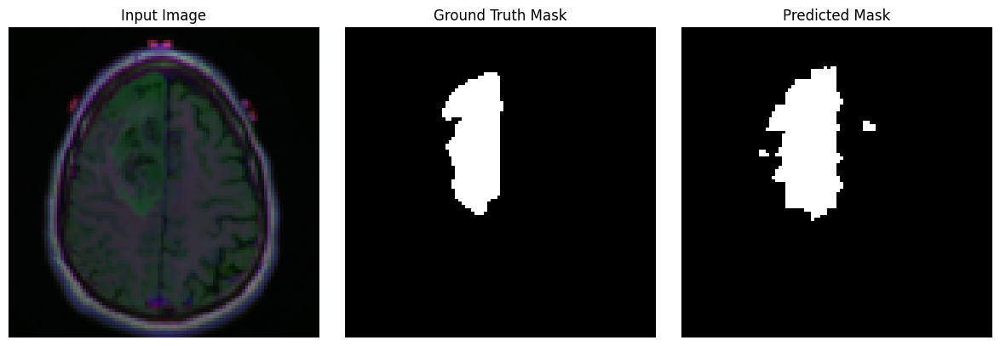

Final loss: 0.9402
Epoch 190/200 

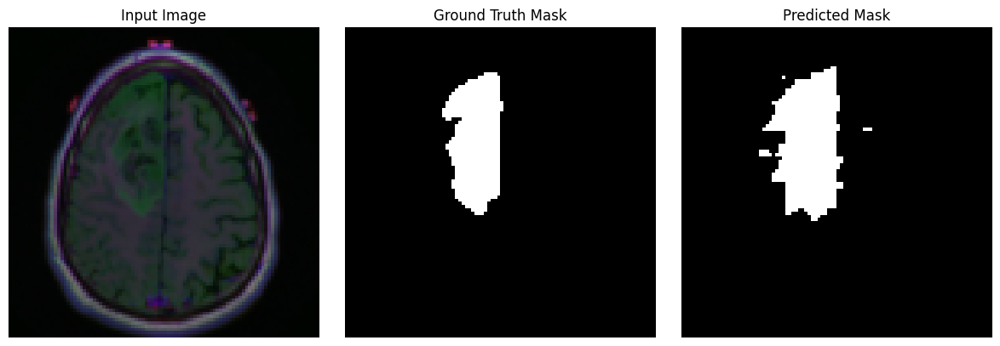

Final loss: 0.9419
Epoch 191/200 

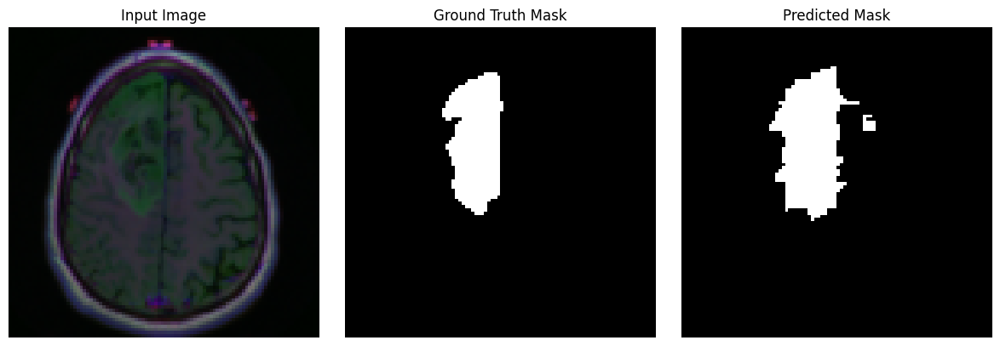

Final loss: 0.9850
Epoch 192/200 

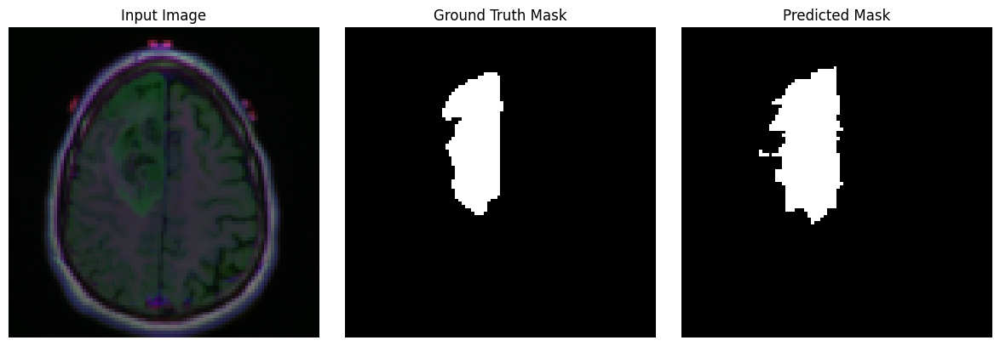

Final loss: 0.9377
Epoch 193/200 

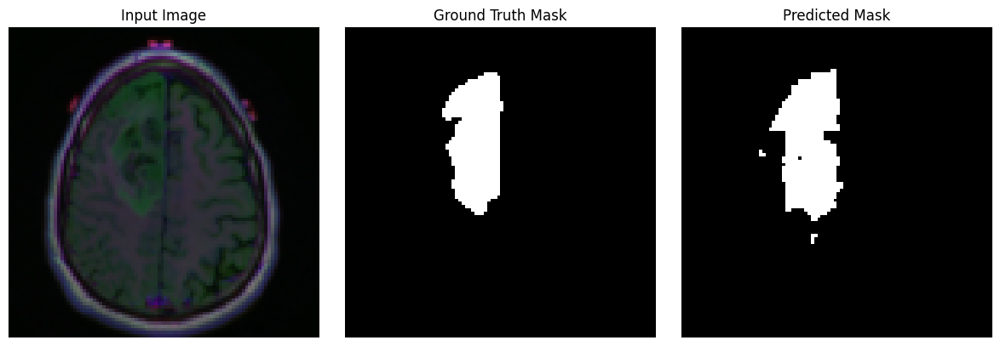

Final loss: 0.9507
Epoch 194/200 

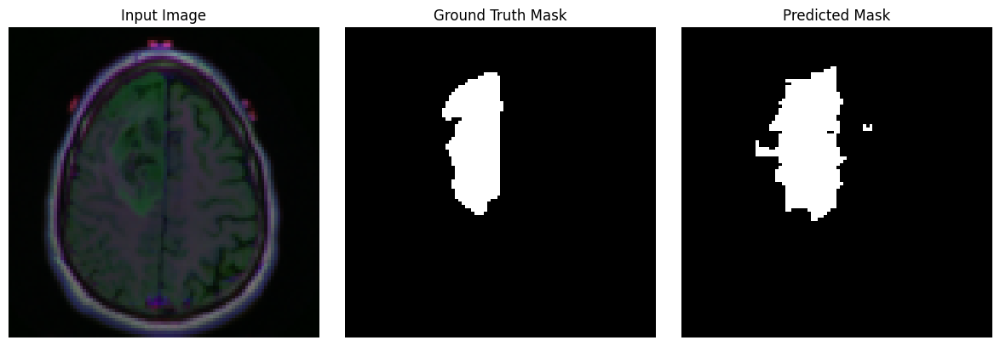

Final loss: 0.9463
Epoch 195/200 

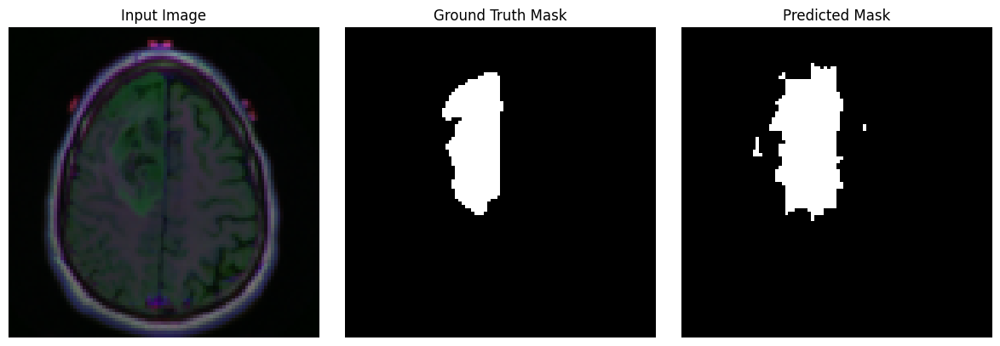

Final loss: 0.9672
Epoch 196/200 

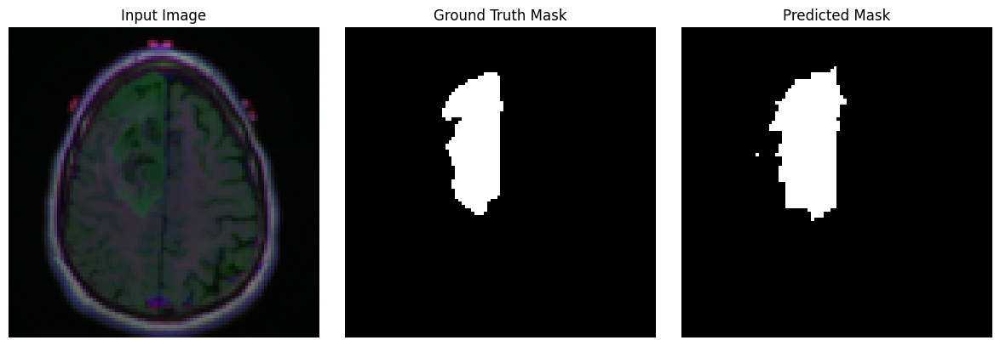

Final loss: 0.9637
Epoch 197/200 

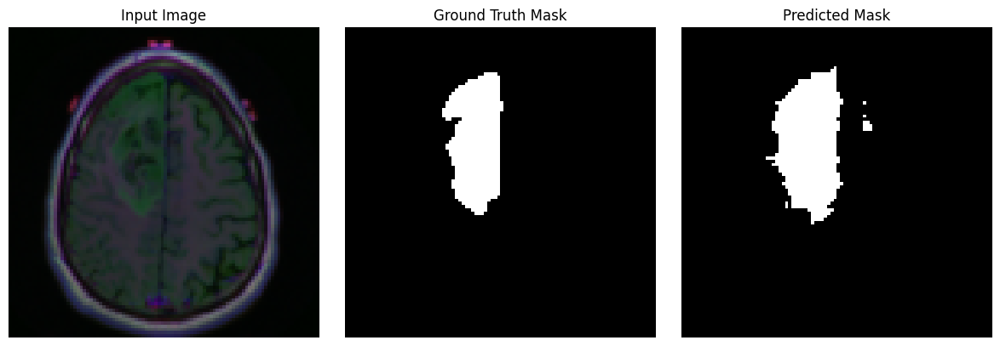

Final loss: 0.9525
Epoch 198/200 

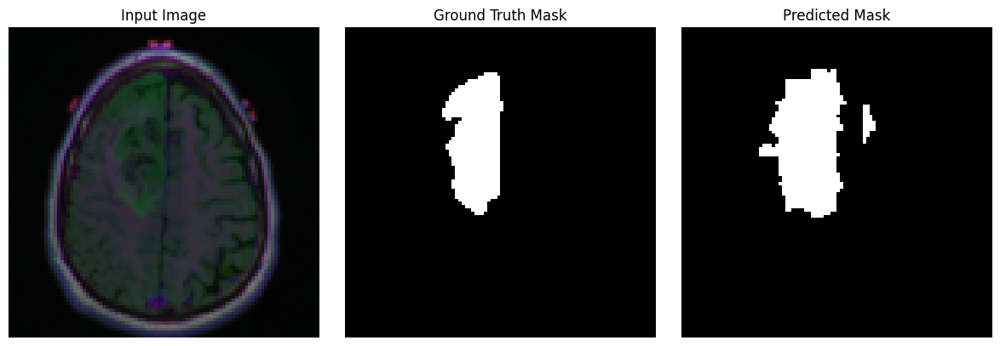

Final loss: 0.9668
Epoch 199/200 

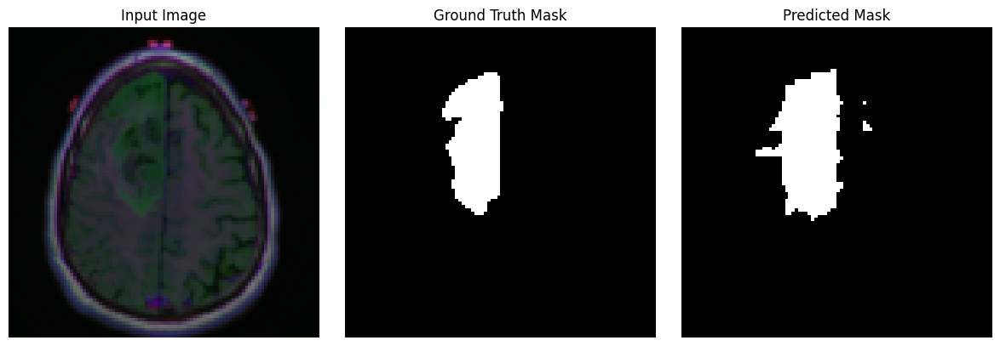

Final loss: 0.9418
Epoch 200/200 

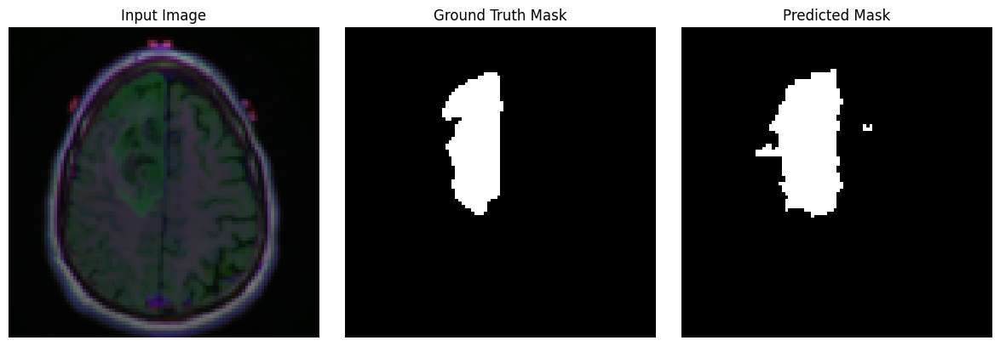

Final loss: 0.9578


In [78]:
num_epochs = 200

for i in range(num_epochs):
    print(f"Epoch {i+1}/{num_epochs}", end=' ')
    setr_model_2, final_loss = training(setr_model_2, 
                                 train_loader, 
                                 optimizer, 
                                 diceloss, 
                                 num_epochs=1, 
                                 plots=True, comments=False)
    print(f"Final loss: {final_loss:.4f}")

Trained approximatively on 300 epochs

Epoch 1/10 

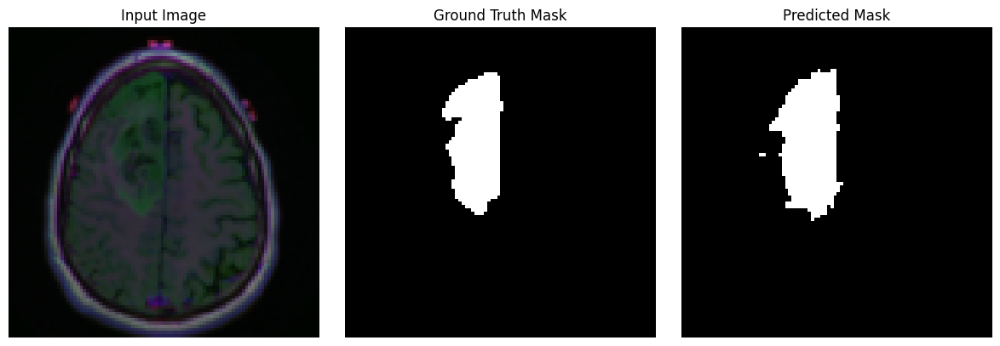

Final loss: 0.9201
Epoch 2/10 

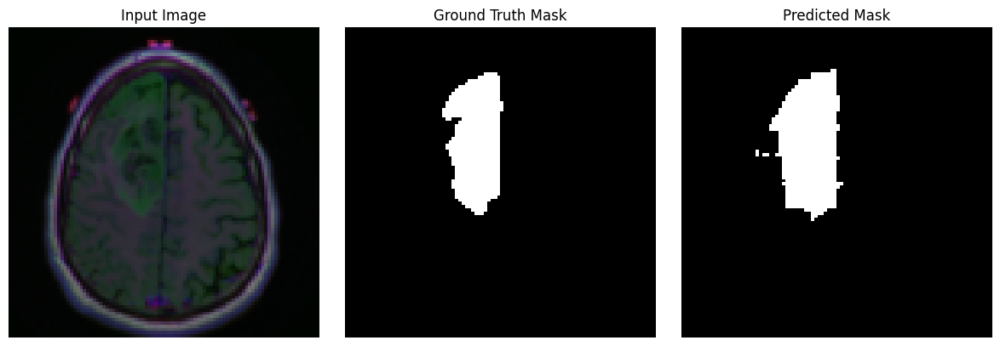

Final loss: 0.9586
Epoch 3/10 

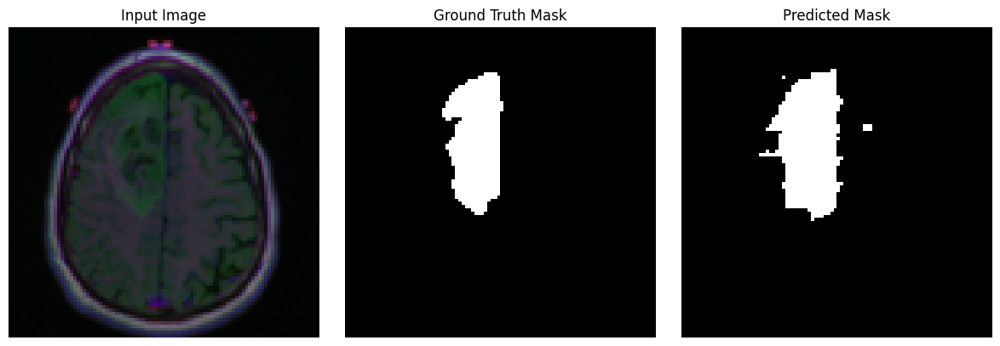

Final loss: 0.9600
Epoch 4/10 

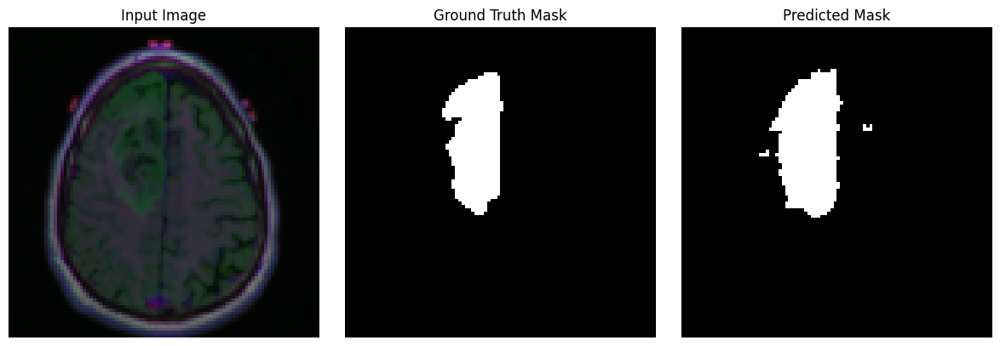

Final loss: 0.9456
Epoch 5/10 

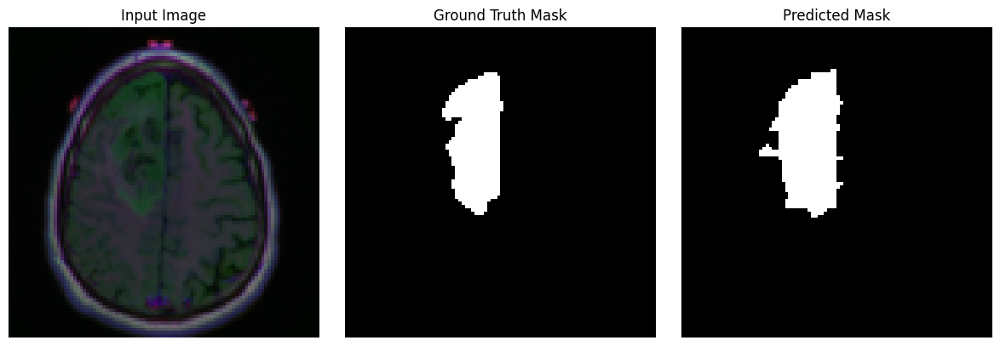

Final loss: 0.9454
Epoch 6/10 

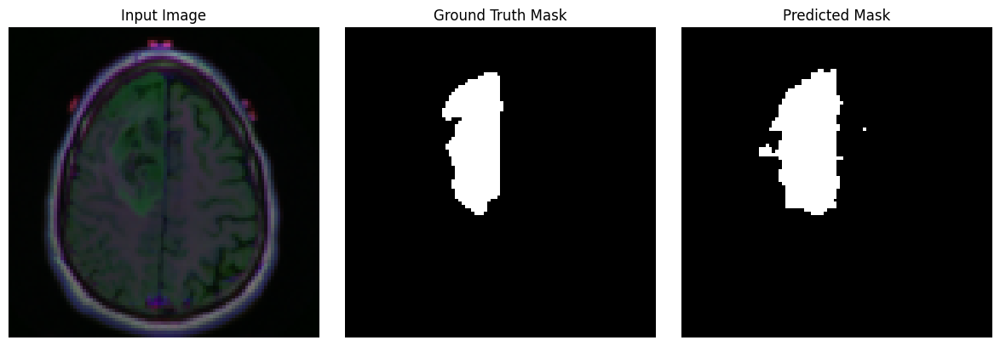

Final loss: 0.9356
Epoch 7/10 

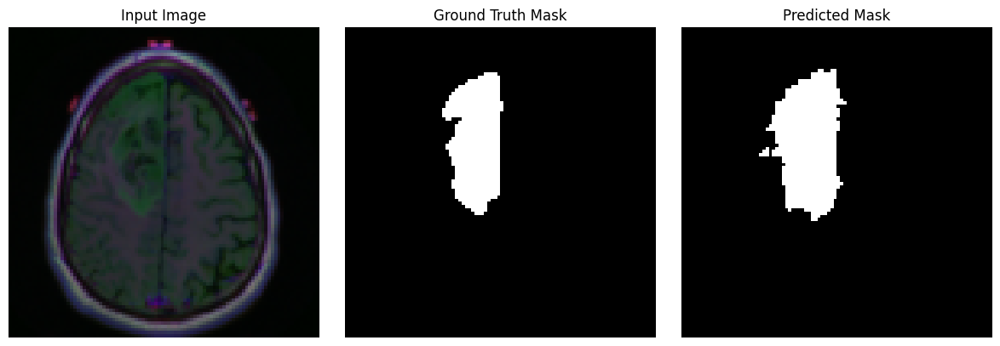

Final loss: 0.9307
Epoch 8/10 

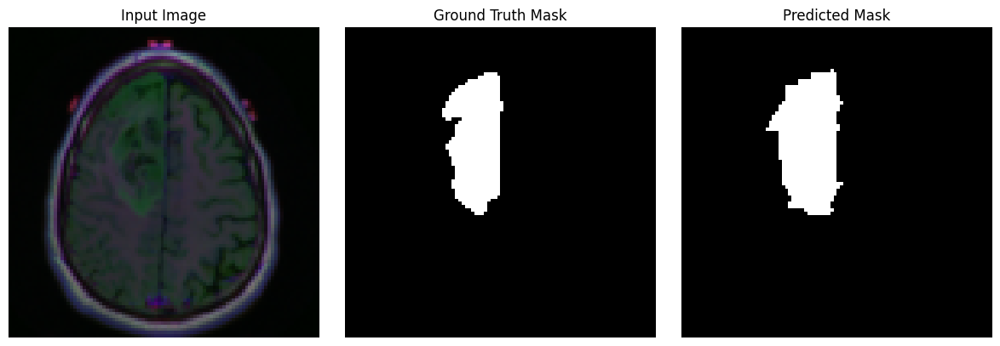

Final loss: 0.9480
Epoch 9/10 

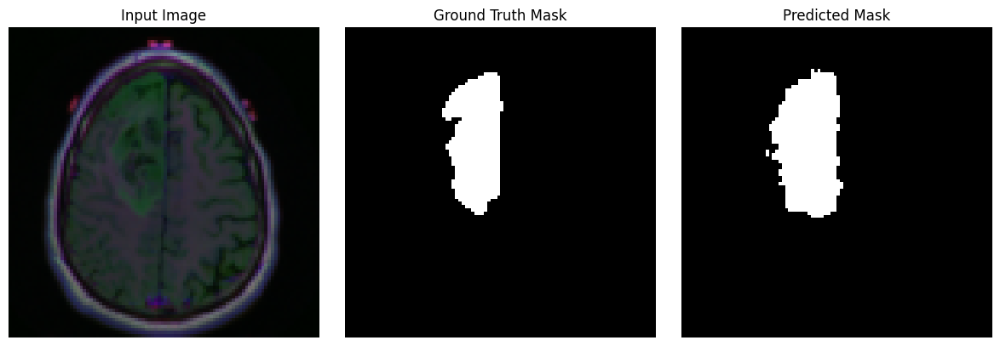

Final loss: 0.9284
Epoch 10/10 

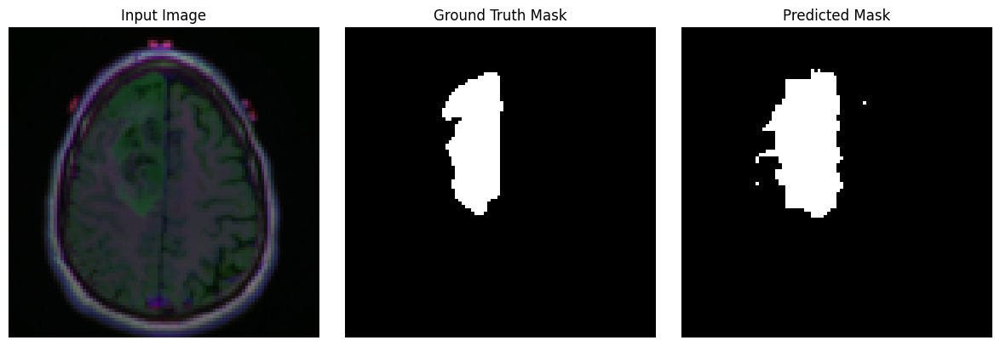

Final loss: 0.9570


In [82]:
num_epochs = 10

for i in range(num_epochs):
    print(f"Epoch {i+1}/{num_epochs}", end=' ')
    setr_model_2, final_loss = training(setr_model_2, 
                                 train_loader, 
                                 optimizer, 
                                 diceloss, 
                                 num_epochs=1, 
                                 plots=True, comments=False)
    print(f"Final loss: {final_loss:.4f}")

In [83]:
torch.save(setr_model_2, '../Trained models/setr_model2_v2.pth')
torch.save(optimizer, '../Trained models/setr_model2_v2_optimizer.pth')

Trained other 10 times

Epoch 1/1 

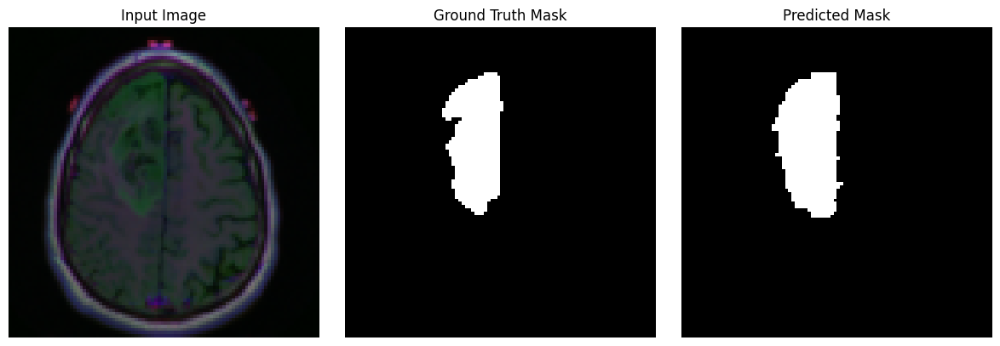

Final loss: 0.9500


In [100]:
num_epochs = 1

for i in range(num_epochs):
    print(f"Epoch {i+1}/{num_epochs}", end=' ')
    setr_model_2, final_loss = training(setr_model_2, 
                                 train_loader, 
                                 optimizer, 
                                 diceloss, 
                                 num_epochs=1, 
                                 plots=True, comments=False)
    print(f"Final loss: {final_loss:.4f}")

Trained for 100 + 200 epochs

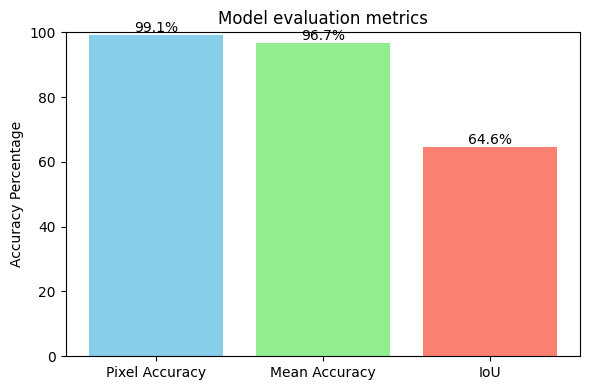

(0.9912530404550058, 0.9670318099488432, 0.6464810849392921)

In [101]:
setr_model_2.eval()
evaluate_segmentation(setr_model_2, test_loader, plot=True)

In [ ]:
# for i in range(50):
#    display_results(setr_model_2, test_set, i)  # Visualizza un esempio specifico

In [102]:
torch.save(setr_model_2, '../Trained models/setr_model2_v3.pth')
torch.save(optimizer, '../Trained models/setr_model2_v3_optimizer.pth')

#### Parameter numbers

In [212]:
dice_loaded = torch.load('../Trained models/unet_model.pth')
combo_loaded = torch.load('../Trained models/unet_combomodel.pth')
combo2_loaded = torch.load('../Trained models/unet_combomodel2.pth')
setr_model_2_loaded = torch.load('../Trained models/setr_model2_v3.pth')

[1862849, 1862849, 1862849, 2456833]


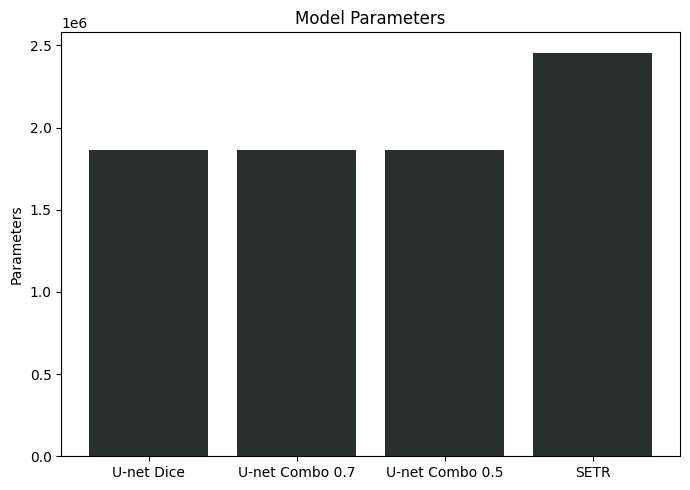

In [247]:
params = []
models = ['U-net Dice', 'U-net Combo 0.7', 'U-net Combo 0.5', 'SETR']

params.append(sum(p.numel() for p in dice_loaded.parameters()))
params.append(sum(p.numel() for p in combo_loaded.parameters()))
params.append(sum(p.numel() for p in combo2_loaded.parameters()))
params.append(sum(p.numel() for p in setr_model_2_loaded.parameters()))
print(params)

plt.figure(figsize=(7, 5))
plt.bar(models, params, color ="#27302c")
plt.ylabel('Parameters')
plt.title('Model Parameters')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

See that even if highly simplified this model has 30% more parameters to train... Training this model required approximately 6 hours on the macbook air. We can see that the model with an appropriate number of dimensions...

In [236]:
complex_model = SETR(img_size=W, num_cuts=24, in_ch=3, num_classes=1,
                            dim=1024, depth=24, heads=8, mlp_dim=2048)

(sum(p.numel() for p in complex_model.parameters()) - max(params)) / max(params) * 100

8184.991979511835

In [ ]:
sum(p.numel() for p in complex_model.parameters())
max(params)

2456833

... 200 B vs 2 B parameters, 82 times more "bigger".

[1862849, 1862849, 1862849, 2456833, 203548417]


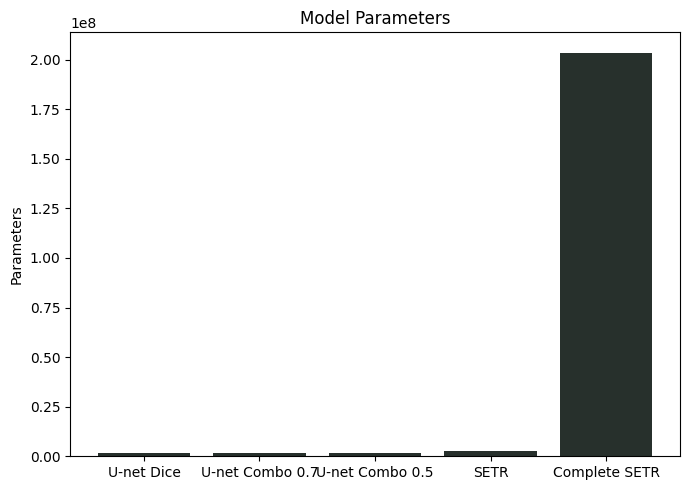

In [249]:
params = []
models = ['U-net Dice', 'U-net Combo 0.7', 'U-net Combo 0.5', 'SETR', 'Complete SETR']

params.append(sum(p.numel() for p in dice_loaded.parameters()))
params.append(sum(p.numel() for p in combo_loaded.parameters()))
params.append(sum(p.numel() for p in combo2_loaded.parameters()))
params.append(sum(p.numel() for p in setr_model_2_loaded.parameters()))
params.append(sum(p.numel() for p in complex_model.parameters()))
print(params)

plt.figure(figsize=(7, 5))
plt.bar(models, params, color ="#27302c")
plt.ylabel('Parameters')
plt.title('Model Parameters')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

---

### Conclusions

### Image overlay

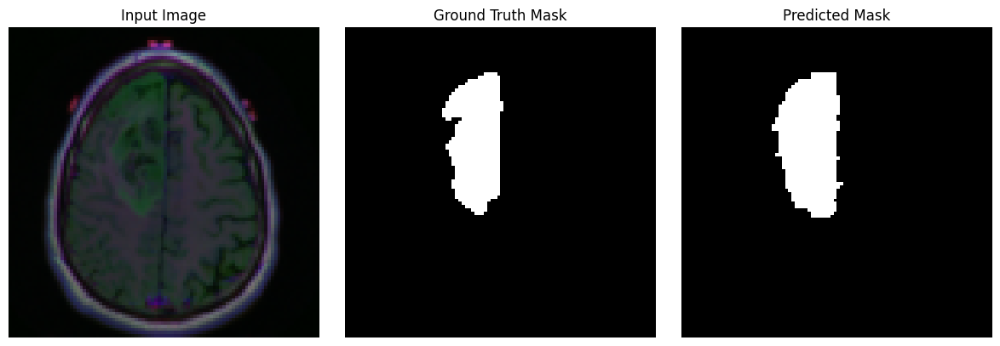

array([<AxesSubplot:title={'center':'Input Image'}>,
       <AxesSubplot:title={'center':'Ground Truth Mask'}>,
       <AxesSubplot:title={'center':'Predicted Mask'}>], dtype=object)

In [ ]:
def display_results_overlay(model, dataset, dataset_num = 34, ax_num = 3, plot_show = True):
    # Take the dataset image (num)
    model.eval() # stop the training
    img, true_mask = dataset[dataset_num]
    img = img.unsqueeze(0).to(device)

    # predict the mask
    with torch.no_grad():
        pred_mask = model(img)  # [1,1,H,W]
        pred_mask = (pred_mask.squeeze() > 0.5).cpu().float()
        true_mask = true_mask.squeeze()

    # Compare the mask
    fig, axs = plt.subplots(1, ax_num, figsize=(12, 4)) 
    axs[0].imshow(img.squeeze().permute(1, 2, 0).cpu())
    axs[0].set_title("Input Image")
    axs[1].imshow(true_mask, cmap='gray')
    axs[1].set_title("Ground Truth Mask")
    axs[2].imshow(pred_mask, cmap='gray')
    axs[2].set_title("Predicted Mask")

    for ax in axs:
        ax.axis("off")

    plt.tight_layout()
    if plot_show:
        plt.show()

    return axs

In [133]:
def display_results_overlay(model, dataset, dataset_num=34, ax_num=3, plot_show=True):
    model.eval()
    img, true_mask = dataset[dataset_num]
    img_input = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_mask = model(img_input)  # [1,1,H,W]
        pred_mask = (pred_mask.squeeze() > 0.5).cpu().float()
        true_mask = true_mask.squeeze()

    img_np = img.permute(1, 2, 0).cpu().numpy()  # [H,W,3]

    # Compare the mask
    fig, axs = plt.subplots(1, ax_num, figsize=(12, 4)) 
    axs[0].imshow(img.squeeze().permute(1, 2, 0).cpu())
    axs[0].set_title("Input Image")

    axs[1].imshow(img.squeeze().permute(1, 2, 0).cpu())
    axs[1].imshow(true_mask, cmap='gray', alpha = 0.3)
    axs[1].set_title("Ground Truth Mask")
    
    axs[2].imshow(img.squeeze().permute(1, 2, 0).cpu())
    axs[2].imshow(pred_mask, cmap='gray', alpha = 0.3)
    axs[2].set_title("Ground Truth Mask")
    

    for ax in axs:
        ax.axis("off")

    plt.tight_layout()
    if plot_show:
        plt.show()

    return axs

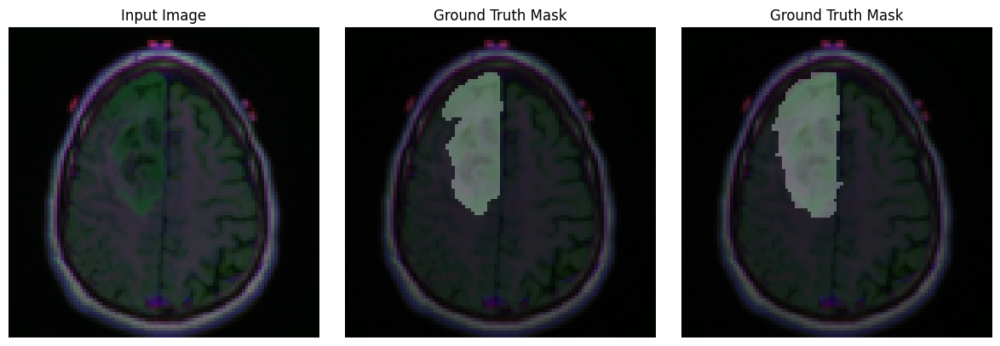

In [136]:
display_results_overlay(setr_model_2, dataset)
None

We see the result is not so good, but we can see that the model is able to detect the tumor in the image.

However, it's even more of interest to visualize the probability levels!

In [ ]:
def display_results_overlay_probability(model, dataset, dataset_num=34, ax_num=3, plot_show=True):
    model.eval()
    img, true_mask = dataset[dataset_num]
    img_input = img.unsqueeze(0).to(device)

    with torch.no_grad():
        pred_mask = model(img_input).squeeze().cpu()
        true_mask = true_mask.squeeze()

    img_np = img.permute(1, 2, 0).cpu().numpy()  # [H,W,3]

    # Compare the mask
    plt.style.use('dark_background')  

    fig, axs = plt.subplots(1, ax_num, figsize=(12, 4)) 
    axs[0].imshow(img.squeeze().permute(1, 2, 0).cpu())
    axs[0].set_title("Input Image")

    axs[1].imshow(img.squeeze().permute(1, 2, 0).cpu())
    axs[1].imshow(true_mask, cmap='gray', alpha = 0.3)
    axs[1].set_title("Ground Truth Mask")
    
    axs[2].imshow(img.squeeze().permute(1, 2, 0).cpu())
    axs[2].imshow(pred_mask, cmap='gray', alpha = 0.3)
    axs[2].set_title("Predicted Probability Mask")
    

    for ax in axs:
        ax.axis("off")

    plt.tight_layout()
    if plot_show:
        plt.show()
    plt.style.use('default')
    return axs, pred_mask

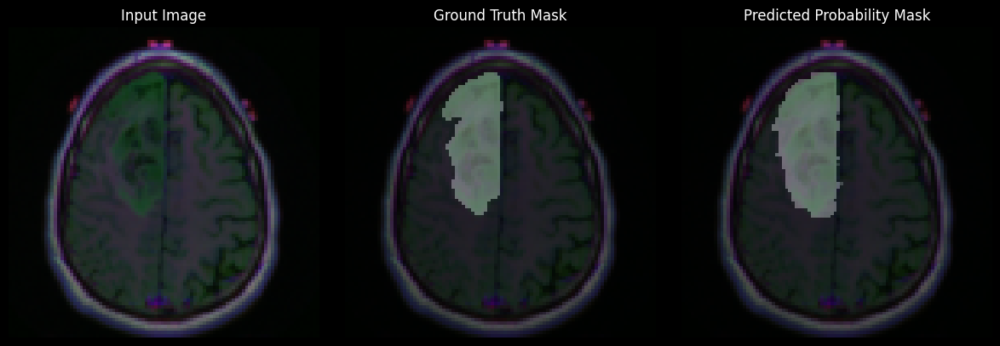

In [193]:
_, p = display_results_overlay_probability(setr_model_2, dataset)

In [ ]:
# for i in range(50):
#    display_results(combo2_loaded, test_set, i)  # Visualizza un esempio specifico

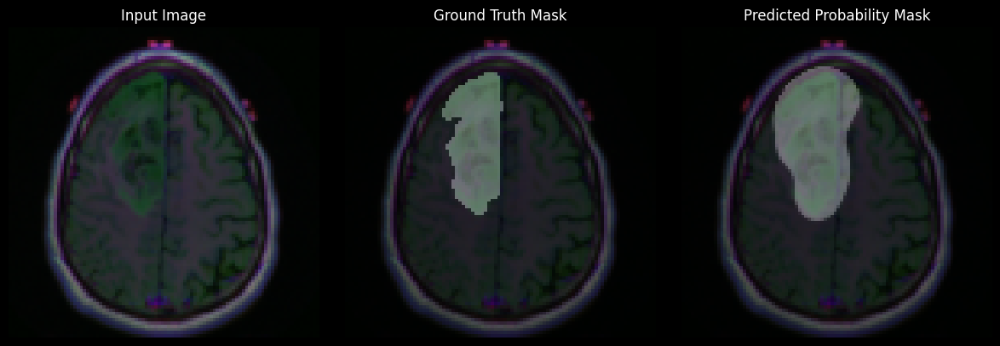

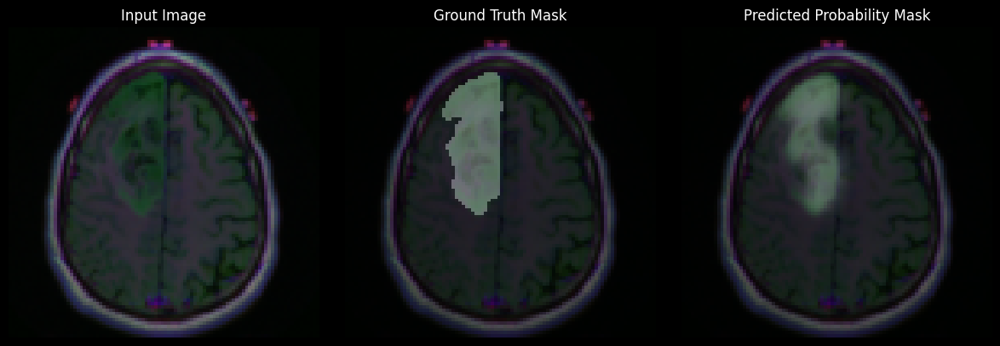

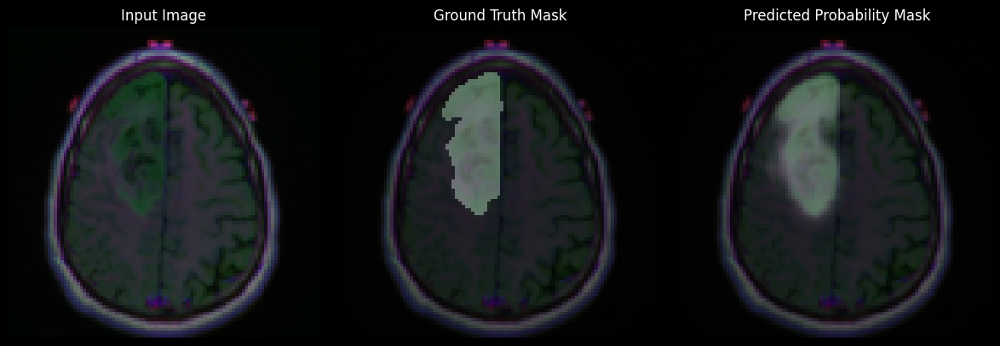

In [250]:
display_results_overlay_probability(dice_loaded, dataset)
display_results_overlay_probability(combo_loaded, dataset)
display_results_overlay_probability(combo2_loaded, dataset)
None

This concludes the Deep Learning Project.

$\blacksquare$